In [4]:
import tensorflow as tf
import keras

from keras.layers import Layer, InputSpec
import keras.backend as K

class ReflectionPadding2D(Layer):
    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        self.input_spec = [InputSpec(ndim=4)]
        super(ReflectionPadding2D, self).__init__(**kwargs)

    def compute_output_shape(self, s):
        """ If you are using "channels_last" configuration"""
        return (s[0], s[1] + 2 * self.padding[0], s[2] + 2 * self.padding[1], s[3])

    def call(self, x, mask=None):
        w_pad,h_pad = self.padding
        return tf.pad(x, [[0,0], [h_pad,h_pad], [w_pad,w_pad], [0,0] ], 'REFLECT')

In [5]:
from __future__ import print_function, division
import scipy

from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization
from keras.layers import Input, Dense, Reshape, Flatten, Dropout, Concatenate
from keras.layers import BatchNormalization, Activation, ZeroPadding2D, Add
from keras.layers import LeakyReLU, ELU
from keras.layers.convolutional import UpSampling2D, Conv2D, Conv2DTranspose
from tensorflow.keras.layers import add
#from models.layers.layers import ReflectionPadding2D
from keras.models import Sequential, Model
from keras.initializers import RandomNormal
from keras.optimizers import Adam
from keras import backend as K

from keras.utils import plot_model

import datetime
import matplotlib.pyplot as plt
import sys

import numpy as np
import os
import pickle as pkl
import random

from collections import deque

import numpy as np
import scipy
import cv2
from glob import glob
import matplotlib.pyplot as plt

In [6]:
class CycleGAN():
    def __init__(self
        , input_dim
        , learning_rate
        , lambda_validation
        , lambda_reconstructed
        , lambda_id
        , generator_type
        , gen_n_filters
        , disc_n_filters
        , buffer_max_length = 50
        ):

        self.input_dim = input_dim
        self.learning_rate = learning_rate
        self.buffer_max_length = buffer_max_length
        self.lambda_validation = lambda_validation
        self.lambda_reconstructed = lambda_reconstructed
        self.lambda_id = lambda_id
        self.generator_type = generator_type
        self.gen_n_filters = gen_n_filters
        self.disc_n_filters = disc_n_filters

        # Input shape
        self.img_rows = input_dim[0]
        self.img_cols = input_dim[1]
        self.channels = input_dim[2]
        self.img_shape = (self.img_rows, self.img_cols, self.channels)

        self.d_losses = []
        self.g_losses = []
        self.epoch = 0

        self.buffer_A = deque(maxlen = self.buffer_max_length)
        self.buffer_B = deque(maxlen = self.buffer_max_length)
        
        # Calculate output shape of D (PatchGAN)
        patch = int(self.img_rows / 2**3)
        self.disc_patch = (patch, patch, 1)

        self.weight_init = RandomNormal(mean=0., stddev=0.02)

        self.compile_Models()

    
    
    # Function for Generator     
    def build_generator_unet(self):
        
        def downSample(layer_input, filters, f_size=4):
            d = Conv2D(filters, kernel_size = f_size)
            d = InstanceNormalization(axis=-1, center = False, scale= False)(d)
            d = Activation('relu')(d)
            return d
    
        def upSample(layer_input, filters, f_size=4, dropout_rates = 0):
            u = UpSampling2D(size=2)(layer_input)
            u = Conv2D(filters, kernel_size = f_size, strides = 1, padding = 'same')(u)
            u = InstanceNormalization(axis = -1, center = False, scale = False)(u)
            u = Activation('relu')(u)
            if dropout_rate:
                u = Dropout(dropout_rate)(u)
        
            u = Concatenate()[u,skip_input]
            return u
    
        # Image Input
        img = Input(shape=self.img_shape)
    
        #DownSampling
        d1 = downSample(img, self.gen_n_filters)
        d2 = downSample(d1, self.gen_n_filters*2)
        d3 = downSample(d2, self.gen_n_filters*4)
        d4 = downSample(d3, self.gen_n_filters*8)
    
        #UpSampling
        u1 = upSample(d4, d3, self.gen_n_filters*4)
        u2 = upSample(u1, d2, self.gen_n_filters*2)
        u3 = upSample(u2, d1, self.gen_n_filters)
    
        u4 = UpSampling2D(size=2)(u3)
    
        output = Conv2D(self.channels, kernel_size=4, strides=1, padding = 'same', activation='tanh')(u4)
    
        return Model(img, output)
    
    
    # Function to build Generator Residual 
    def build_generator_resnet(self):

        def conv7s1(layer_input, filters, final):
            y = ReflectionPadding2D(padding =(3,3))(layer_input)
            y = Conv2D(filters, kernel_size=(7,7), strides=1, padding='valid', kernel_initializer = self.weight_init)(y)
            if final:
                y = Activation('tanh')(y)
            else:
                y = InstanceNormalization(axis = -1, center = False, scale = False)(y)
                y = Activation('relu')(y)
            return y

        def downsample(layer_input,filters):
            y = Conv2D(filters, kernel_size=(3,3), strides=2, padding='same', kernel_initializer = self.weight_init)(layer_input)
            y = InstanceNormalization(axis = -1, center = False, scale = False)(y)
            y = Activation('relu')(y)
            return y

        def residual(layer_input, filters):
            shortcut = layer_input
            y = ReflectionPadding2D(padding =(1,1))(layer_input)
            y = Conv2D(filters, kernel_size=(3, 3), strides=1, padding='valid', kernel_initializer = self.weight_init)(y)
            y = InstanceNormalization(axis = -1, center = False, scale = False)(y)
            y = Activation('relu')(y)
            
            y = ReflectionPadding2D(padding =(1,1))(y)
            y = Conv2D(filters, kernel_size=(3, 3), strides=1, padding='valid', kernel_initializer = self.weight_init)(y)
            y = InstanceNormalization(axis = -1, center = False, scale = False)(y)

            return add([shortcut, y])

        def upsample(layer_input,filters):
            y = Conv2DTranspose(filters, kernel_size=(3, 3), strides=2, padding='same', kernel_initializer = self.weight_init)(layer_input)
            y = InstanceNormalization(axis = -1, center = False, scale = False)(y)
            y = Activation('relu')(y)
    
            return y


        # Image input
        img = Input(shape=self.img_shape)

        y = img

        y = conv7s1(y, self.gen_n_filters, False)
        y = downsample(y, self.gen_n_filters * 2)
        y = downsample(y, self.gen_n_filters * 4)
        y = residual(y, self.gen_n_filters * 4)
        y = residual(y, self.gen_n_filters * 4)
        y = residual(y, self.gen_n_filters * 4)
        y = residual(y, self.gen_n_filters * 4)
        y = residual(y, self.gen_n_filters * 4)
        y = residual(y, self.gen_n_filters * 4)
        y = residual(y, self.gen_n_filters * 4)
        y = residual(y, self.gen_n_filters * 4)
        y = residual(y, self.gen_n_filters * 4)
        y = upsample(y, self.gen_n_filters * 2)
        y = upsample(y, self.gen_n_filters)
        y = conv7s1(y, 3, True)
        output = y

   
        return Model(img, output)
    
    # Function for Discriminator
    def build_discriminator(self):
    
        def conv4(layer_input, filters, stride=2, norm=True):
            y = Conv2D(filters, kernel_size=4, strides=stride, padding = 'same')(layer_input)
        
            if norm:
                y = InstanceNormalization(axis = -1, center = False, scale = False)(y)
        
            y = LeakyReLU(0.2)(y)
        
            return y
    
        img = Input(shape=self.img_shape)
    
        y = conv4(img, self.disc_n_filters, stride = 2, norm = False)
        y = conv4(y, self.disc_n_filters*2, stride = 2)
        y = conv4(y, self.disc_n_filters*4, stride = 2)
        y = conv4(y , self.disc_n_filters*8, stride = 1)
    
        output = Conv2D(1, kernel_size=4, strides=1, padding='same')(y)
    
        return Model(img,output)
    
    
    #Function to compile the models
    def compile_Models(self):
    
        #Build Discriminators
    
        self.d_A = self.build_discriminator()
        self.d_B = self.build_discriminator()
    
        self.d_A.compile(loss='mse', optimizer = Adam(self.learning_rate, 0.5),
                    metrics = ['accuracy'])
        self.d_B.compile(loss = 'mse', optimizer = Adam(self.learning_rate,0.5),
                    metrics = ['accuracy'])
        
        
        # Build the generators
        if self.generator_type == 'unet':
            self.g_AB = self.build_generator_unet()
            self.g_BA = self.build_generator_unet()
        else:
            self.g_AB = self.build_generator_resnet()
            self.g_BA = self.build_generator_resnet()
        
        self.d_A.trainable = False
        self.d_B.trainable = False
    
        img_A = Input(shape = self.img_shape)
        img_B = Input(shape = self.img_shape)
    
        fake_A = self.g_BA(img_B)
        fake_B = self.g_AB(img_A)
    
        valid_A = self.d_A(fake_A)
        valid_B = self.d_B(fake_B)
    
        reconstruct_A = self.g_BA(fake_B)
        reconstruct_B = self.g_AB(fake_A)
    
        img_A_id = self.g_BA(img_A)
        img_B_id = self.g_AB(img_B)
    
        self.combined = Model(inputs = [img_A, img_B], outputs = [valid_A, valid_B, 
                                                              reconstruct_A, reconstruct_B,
                                                             img_A_id,img_B_id])
    
        self.combined.compile(loss = ['mse', 'mse',
                                      'mae','mae',
                                      'mae','mae'],
                              loss_weights = [
                             self.lambda_validation,
                             self.lambda_validation,
                             self.lambda_reconstructed,
                             self.lambda_reconstructed,
                             self.lambda_id,
                             self.lambda_id
                         ],
                         optimizer = Adam(0.0002, 0.5))
    
        self.d_A.trainable = True
        self.d_B.trainable = True
    
    # Function to Train Discriminators
    def train_discriminators(self, imgs_A, imgs_B, valid, fake):

        # Translate images to opposite domain
        fake_B = self.g_AB.predict(imgs_A)
        fake_A = self.g_BA.predict(imgs_B)

        self.buffer_B.append(fake_B)
        self.buffer_A.append(fake_A)

        fake_A_rnd = random.sample(self.buffer_A, min(len(self.buffer_A), len(imgs_A)))
        fake_B_rnd = random.sample(self.buffer_B, min(len(self.buffer_B), len(imgs_B)))

        # Train the discriminators (original images = real / translated = Fake)
        dA_loss_real = self.d_A.train_on_batch(imgs_A, valid)
        dA_loss_fake = self.d_A.train_on_batch(fake_A_rnd, fake)
        dA_loss = 0.5 * np.add(dA_loss_real, dA_loss_fake)

        dB_loss_real = self.d_B.train_on_batch(imgs_B, valid)
        dB_loss_fake = self.d_B.train_on_batch(fake_B_rnd, fake)
        dB_loss = 0.5 * np.add(dB_loss_real, dB_loss_fake)

        # Total disciminator loss
        d_loss_total = 0.5 * np.add(dA_loss, dB_loss)

        return (
            d_loss_total[0]
            , dA_loss[0], dA_loss_real[0], dA_loss_fake[0]
            , dB_loss[0], dB_loss_real[0], dB_loss_fake[0]
            , d_loss_total[1]
            , dA_loss[1], dA_loss_real[1], dA_loss_fake[1]
            , dB_loss[1], dB_loss_real[1], dB_loss_fake[1]
        )
    
    def train_generators(self, imgs_A, imgs_B, valid):

        # Train the generators
        return self.combined.train_on_batch([imgs_A, imgs_B],
                                                [valid, valid,
                                                imgs_A, imgs_B,
                                                imgs_A, imgs_B])
    
    # Train the Model
    def train(self, data_loader, run_folder, epochs, test_A_file, test_B_file, batch_size=1, sample_interval=50):

        start_time = datetime.datetime.now()

        # Adversarial loss ground truths
        valid = np.ones((batch_size,) + self.disc_patch)
        fake = np.zeros((batch_size,) + self.disc_patch)

        for epoch in range(self.epoch, epochs):
            for batch_i, (imgs_A, imgs_B) in enumerate(data_loader.load_batch()):
                
                #print("Checkpoint 1")

                d_loss = self.train_discriminators(imgs_A, imgs_B, valid, fake)
                g_loss = self.train_generators(imgs_A, imgs_B, valid)

                elapsed_time = datetime.datetime.now() - start_time

                # Plot the progress
                print ("[Epoch %d/%d] [Batch %d/%d] [D loss: %f, acc: %3d%%] [G loss: %05f, adv: %05f, recon: %05f, id: %05f] time: %s " \
                    % ( self.epoch, epochs,
                        batch_i, data_loader.n_batches,
                        d_loss[0], 100*d_loss[7],
                        g_loss[0],
                        np.sum(g_loss[1:3]),
                        np.sum(g_loss[3:5]),
                        np.sum(g_loss[5:7]),
                        elapsed_time))

                self.d_losses.append(d_loss)
                self.g_losses.append(g_loss)

                # If at save interval => save generated image samples
                if batch_i % sample_interval == 0:
                    self.sample_images(data_loader, batch_i, run_folder, test_A_file, test_B_file)
                    self.combined.save_weights(os.path.join(run_folder, 'weights/weights-%d.h5' % (self.epoch)))
                    self.combined.save_weights(os.path.join(run_folder, 'weights/weights.h5'))
                    self.save_model(run_folder)

                
            self.epoch += 1
            
    def sample_images(self, data_loader, batch_i, run_folder, test_A_file, test_B_file):
        
        r, c = 2, 4

        for p in range(2):

            #if p == 1:
            #    imgs_A = data_loader.load_data(domain="A", batch_size=1, is_testing=True)
            #    imgs_B = data_loader.load_data(domain="B", batch_size=1, is_testing=True)
            #else:
            imgs_A = data_loader.load_img(test_A_file)
            imgs_B = data_loader.load_img(test_B_file)

            # Translate images to the other domain
            fake_B = self.g_AB.predict(imgs_A)
            fake_A = self.g_BA.predict(imgs_B)
            # Translate back to original domain
            reconstr_A = self.g_BA.predict(fake_B)
            reconstr_B = self.g_AB.predict(fake_A)

            # ID the images
            id_A = self.g_BA.predict(imgs_A)
            id_B = self.g_AB.predict(imgs_B)

            gen_imgs = np.concatenate([imgs_A, fake_B, reconstr_A, id_A, imgs_B, fake_A, reconstr_B, id_B])

            # Rescale images 0 - 1
            gen_imgs = 0.5 * gen_imgs + 0.5
            gen_imgs = np.clip(gen_imgs, 0, 1)

            titles = ['Original', 'Translated', 'Reconstructed', 'ID']
            fig, axs = plt.subplots(r, c, figsize=(25,12.5))
            cnt = 0
            for i in range(r):
                for j in range(c):
                    axs[i,j].imshow(gen_imgs[cnt])
                    axs[i, j].set_title(titles[j])
                    axs[i,j].axis('off')
                    cnt += 1
            fig.savefig(os.path.join(run_folder ,"images/%d_%d_%d.png" % (p, self.epoch, batch_i)))
            plt.close()
            
    def save_model(self, run_folder):
        self.combined.save(os.path.join(run_folder, 'model.h5')  )
        self.d_A.save(os.path.join(run_folder, 'd_A.h5') )
        self.d_B.save(os.path.join(run_folder, 'd_B.h5') )
        self.g_BA.save(os.path.join(run_folder, 'g_BA.h5')  )
        self.g_AB.save(os.path.join(run_folder, 'g_AB.h5') )

        pkl.dump(self, open( os.path.join(run_folder, "obj.pkl"), "wb" ))
    
    def load_weights(self, filepath):
        self.combined.load_weights(filepath)

In [7]:
class DataLoader():
    def __init__(self, dataset_name, img_res=(256, 256)):
        self.dataset_name = dataset_name
        self.img_res = img_res

    def load_data(self, domain, batch_size=1, is_testing=False):
        #data_type = "train%s" % domain if not is_testing else "test%s" % domain
        #path = glob('./data/%s/%s/*' % (self.dataset_name, data_type))
        path = glob('%s/*' % (self.dataset_name))
        print(path)
        batch_images = np.random.choice(path, size=batch_size)
        print(batch_images)

        imgs = []
        for img_path in batch_images:
            img = self.imread(img_path)
            if not is_testing:
                img = cv2.resize(img, self.img_res)

                if np.random.random() > 0.5:
                    img = np.fliplr(img)
            else:
                img = cv2.resize(img, self.img_res)
            imgs.append(img)

        imgs = np.array(imgs)/127.5 - 1.

        return imgs

    def load_batch(self, batch_size=1, is_testing=False):
        #data_type = "train" if not is_testing else "val"
        #path_A = glob('./data/%s/%sA/*' % (self.dataset_name, data_type))
        #path_B = glob('./data/%s/%sB/*' % (self.dataset_name, data_type))

        path_A = glob('%s\\Pictures_A\\*' % (self.dataset_name))
        path_B = glob('%s\\Pictures_B\\*' % (self.dataset_name))
        #print(path_A,path_B)
        self.n_batches = int(min(len(path_A), len(path_B)) / batch_size)
        #print(self.n_batches)
        total_samples = self.n_batches * batch_size
        #print(total_samples)

        # Sample n_batches * batch_size from each path list so that model sees all
        # samples from both domains
        path_A = np.random.choice(path_A, total_samples, replace=False)
        path_B = np.random.choice(path_B, total_samples, replace=False)

        for i in range(self.n_batches-1):
            batch_A = path_A[i*batch_size:(i+1)*batch_size]
            batch_B = path_B[i*batch_size:(i+1)*batch_size]
            imgs_A, imgs_B = [], []
            for img_A, img_B in zip(batch_A, batch_B):
                img_A = self.imread(img_A)
                img_B = self.imread(img_B)

                img_A = cv2.resize(img_A, self.img_res)
                img_B = cv2.resize(img_B, self.img_res)

                if not is_testing and np.random.random() > 0.5:
                        img_A = np.fliplr(img_A)
                        img_B = np.fliplr(img_B)

                imgs_A.append(img_A)
                imgs_B.append(img_B)

            imgs_A = np.array(imgs_A)/127.5 - 1.
            imgs_B = np.array(imgs_B)/127.5 - 1.

            yield imgs_A, imgs_B

    def load_img(self, path):
        img = self.imread(path)
        img = cv2.resize(img, self.img_res)
        img = img/127.5 - 1.
        return img[np.newaxis, :, :, :]

    def imread(self, path):
        print(path)
        return cv2.imread(path).astype(np.float)

In [8]:
# run params
SECTION = 'paint'
RUN_ID = '0001'
DATA_NAME = 'LandscapestoCarr'
RUN_FOLDER = 'run/{}/'.format(SECTION)
RUN_FOLDER += '_'.join([RUN_ID, DATA_NAME])

if not os.path.exists(RUN_FOLDER):
    os.mkdir(RUN_FOLDER)
    os.mkdir(os.path.join(RUN_FOLDER, 'viz'))
    os.mkdir(os.path.join(RUN_FOLDER, 'images'))
    os.mkdir(os.path.join(RUN_FOLDER, 'weights'))

mode =  'build' # 'build' # 

In [10]:
IMAGE_SIZE = 256

In [14]:
data_loader = DataLoader(dataset_name=DATA_NAME, img_res=(IMAGE_SIZE, IMAGE_SIZE))

In [217]:
gan = CycleGAN(
    input_dim = (IMAGE_SIZE,IMAGE_SIZE,3)
    ,learning_rate = 0.0002
    , buffer_max_length = 50
    , lambda_validation = 1
    , lambda_reconstructed = 10
    , lambda_id = 2
    , generator_type = 'resnet'
    , gen_n_filters = 32
    , disc_n_filters = 32
    )

if mode == 'build':
    gan.save_model(RUN_FOLDER)
else:
    gan.load_weights(os.path.join(RUN_FOLDER, 'weights/weights.h5'))

Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\conv2d
......vars
.........0
.........1
...layers\conv2d_1
......vars
.........0
.........1
...layers\conv2d_2
......vars
.........0
.........1
...layers\conv2d_3
......vars
.........0
.........1
...layers\conv2d_4
......vars
.........0
.........1
...layers\input_layer
......vars
...layers\instance_normalization
......vars
...layers\instance_normalization_1
......vars
...layers\instance_normalization_2
......vars
...layers\leaky_re_lu
......vars
...layers\leaky_re_lu_1
......vars
...layers\leaky_re_lu_2
......vars
...layers\leaky_re_lu_3
......vars
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...vars
Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 16:35:54         6446
metadata.json                                  2023-02-07 16

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 16:35:54        38430
metadata.json                                  2023-02-07 16:35:54           64
variables.h5                                   2023-02-07 16:35:54     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\functional
......vars
...layers\functional\layers\activation
......vars
...layers\functional\layers\activation_1
......vars
...layers\functional\layers\activation_10
......vars
...layers\functional\layers\activation_11
......vars
...layers\functional\layers\activation_12
......vars
...layers\functional\layers\activation_13
......vars
...layers\functional\layers\activation_14
......vars
...layers\functional\layers\activation_2
......vars
...layers\functional\layers\activation_3
......vars
...layers\functional\layers\activation_4
......vars
...layers\functional\layers\act

File Name                                             Modified             Size
config.json                                    2023-02-07 16:35:54        91114
metadata.json                                  2023-02-07 16:35:54           64
variables.h5                                   2023-02-07 16:35:55     28843960


In [11]:
gan = CycleGAN(
    input_dim = (IMAGE_SIZE,IMAGE_SIZE,3)
    ,learning_rate = 0.0002
    , buffer_max_length = 50
    , lambda_validation = 1
    , lambda_reconstructed = 10
    , lambda_id = 2
    , generator_type = 'resnet'
    , gen_n_filters = 32
    , disc_n_filters = 32
    )

C:\Users\aakas\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\initializers\initializers_v2.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


In [22]:
gan.load_weights(os.path.join(RUN_FOLDER, 'weights/weights-50.h5'))

In [23]:
test_A = data_loader.load_img("Images/image-253.jpg")

Images/image-253.jpg


C:\Users\aakas\AppData\Local\Temp\ipykernel_38816\3773808775.py:79: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  return cv2.imread(path).astype(np.float)


In [26]:
a = gan.g_AB.predict(test_A)

1/1 [==============================] - 1s 925ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


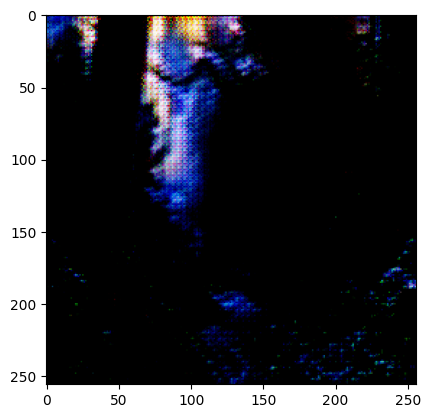

In [27]:
plt.imshow(a[0])

In [218]:
gan.g_BA.summary()

Model: "model_85"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_101 (InputLayer)         [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 reflection_padding2d_700 (Refl  (None, 262, 262, 3)  0          ['input_101[0][0]']              
 ectionPadding2D)                                                                                 
                                                                                                  
 conv2d_950 (Conv2D)            (None, 256, 256, 32  4736        ['reflection_padding2d_700[0][0]'
                                )                                ]                         

                                                                 ]']                              
                                                                                                  
 reflection_padding2d_705 (Refl  (None, 66, 66, 128)  0          ['add_316[0][0]']                
 ectionPadding2D)                                                                                 
                                                                                                  
 conv2d_957 (Conv2D)            (None, 64, 64, 128)  147584      ['reflection_padding2d_705[0][0]'
                                                                 ]                                
                                                                                                  
 instance_normalization_920 (In  (None, 64, 64, 128)  0          ['conv2d_957[0][0]']             
 stanceNormalization)                                                                             
          

 instance_normalization_926 (In  (None, 64, 64, 128)  0          ['conv2d_963[0][0]']             
 stanceNormalization)                                                                             
                                                                                                  
 activation_533 (Activation)    (None, 64, 64, 128)  0           ['instance_normalization_926[0][0
                                                                 ]']                              
                                                                                                  
 reflection_padding2d_712 (Refl  (None, 66, 66, 128)  0          ['activation_533[0][0]']         
 ectionPadding2D)                                                                                 
                                                                                                  
 conv2d_964 (Conv2D)            (None, 64, 64, 128)  147584      ['reflection_padding2d_712[0][0]'
          

                                                                                                  
 conv2d_970 (Conv2D)            (None, 64, 64, 128)  147584      ['reflection_padding2d_718[0][0]'
                                                                 ]                                
                                                                                                  
 instance_normalization_933 (In  (None, 64, 64, 128)  0          ['conv2d_970[0][0]']             
 stanceNormalization)                                                                             
                                                                                                  
 add_323 (Add)                  (None, 64, 64, 128)  0           ['add_322[0][0]',                
                                                                  'instance_normalization_933[0][0
                                                                 ]']                              
          

In [219]:
gan.g_AB.summary()

Model: "model_84"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_100 (InputLayer)         [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 reflection_padding2d_680 (Refl  (None, 262, 262, 3)  0          ['input_100[0][0]']              
 ectionPadding2D)                                                                                 
                                                                                                  
 conv2d_928 (Conv2D)            (None, 256, 256, 32  4736        ['reflection_padding2d_680[0][0]'
                                )                                ]                         

                                                                 ]']                              
                                                                                                  
 reflection_padding2d_685 (Refl  (None, 66, 66, 128)  0          ['add_307[0][0]']                
 ectionPadding2D)                                                                                 
                                                                                                  
 conv2d_935 (Conv2D)            (None, 64, 64, 128)  147584      ['reflection_padding2d_685[0][0]'
                                                                 ]                                
                                                                                                  
 instance_normalization_897 (In  (None, 64, 64, 128)  0          ['conv2d_935[0][0]']             
 stanceNormalization)                                                                             
          

 instance_normalization_903 (In  (None, 64, 64, 128)  0          ['conv2d_941[0][0]']             
 stanceNormalization)                                                                             
                                                                                                  
 activation_518 (Activation)    (None, 64, 64, 128)  0           ['instance_normalization_903[0][0
                                                                 ]']                              
                                                                                                  
 reflection_padding2d_692 (Refl  (None, 66, 66, 128)  0          ['activation_518[0][0]']         
 ectionPadding2D)                                                                                 
                                                                                                  
 conv2d_942 (Conv2D)            (None, 64, 64, 128)  147584      ['reflection_padding2d_692[0][0]'
          

                                                                                                  
 conv2d_948 (Conv2D)            (None, 64, 64, 128)  147584      ['reflection_padding2d_698[0][0]'
                                                                 ]                                
                                                                                                  
 instance_normalization_910 (In  (None, 64, 64, 128)  0          ['conv2d_948[0][0]']             
 stanceNormalization)                                                                             
                                                                                                  
 add_314 (Add)                  (None, 64, 64, 128)  0           ['add_313[0][0]',                
                                                                  'instance_normalization_910[0][0
                                                                 ]']                              
          

In [220]:
gan.d_A.summary()

Model: "model_82"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_98 (InputLayer)       [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_918 (Conv2D)         (None, 128, 128, 32)      1568      
                                                                 
 leaky_re_lu_136 (LeakyReLU)  (None, 128, 128, 32)     0         
                                                                 
 conv2d_919 (Conv2D)         (None, 64, 64, 64)        32832     
                                                                 
 instance_normalization_884   (None, 64, 64, 64)       0         
 (InstanceNormalization)                                         
                                                                 
 leaky_re_lu_137 (LeakyReLU)  (None, 64, 64, 64)       0         
                                                          

In [221]:
gan.d_B.summary()

Model: "model_83"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_99 (InputLayer)       [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_923 (Conv2D)         (None, 128, 128, 32)      1568      
                                                                 
 leaky_re_lu_140 (LeakyReLU)  (None, 128, 128, 32)     0         
                                                                 
 conv2d_924 (Conv2D)         (None, 64, 64, 64)        32832     
                                                                 
 instance_normalization_887   (None, 64, 64, 64)       0         
 (InstanceNormalization)                                         
                                                                 
 leaky_re_lu_141 (LeakyReLU)  (None, 64, 64, 64)       0         
                                                          

In [222]:
BATCH_SIZE = 1
EPOCHS = 100
PRINT_EVERY_N_BATCHES = 10

TEST_A_FILE = 'reforestation-1936.jpg'
TEST_B_FILE = 'image-190.jpg'

In [223]:
gan.train(data_loader
        , run_folder = RUN_FOLDER
        , epochs=EPOCHS
        , test_A_file = TEST_A_FILE
        , test_B_file = TEST_B_FILE
        , batch_size=BATCH_SIZE
        , sample_interval=PRINT_EVERY_N_BATCHES)

LandscapestoCarr\Pictures_A\forest-british-columbia-1932.jpg
LandscapestoCarr\Pictures_B\image-72.jpg


C:\Users\aakas\AppData\Local\Temp\ipykernel_34884\3773808775.py:79: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  return cv2.imread(path).astype(np.float)


1/1 [==============================] - 1s 680ms/step
[Epoch 0/100] [Batch 0/45] [D loss: 1.242188, acc:  46%] [G loss: 14.613777, adv: 1.530741, recon: 1.089825, id: 1.092395] time: 0:00:23.526931 
reforestation-1936.jpg
image-190.jpg
1/1 [==============================] - 0s 331ms/step
reforestation-1936.jpg
image-190.jpg
1/1 [==============================] - 0s 326ms/step
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\conv2d
......vars
.........0
.........1
...layers\conv2d_1
......vars
.........0
.........1
...layers\conv2d_2
......vars
.........0
.........1
...layers\conv2d_3
......vars
.........0
.........1
...layers\conv2d_4
......vars
.........0
.........1
...layers\input_layer
......vars
...layers\instance_normalization
......vars
...layers\instance_normalization_1
......vars
...layers\instance_normalization_2
......vars
...layers\leaky_re_lu
......vars
...layers\leaky_re_lu_1
......vars
...layers\leaky_re_lu_2
......vars
...layers\leaky_re_lu_3
..

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 16:36:32        38430
metadata.json                                  2023-02-07 16:36:32           64
variables.h5                                   2023-02-07 16:36:33     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\functional
......vars
...layers\functional\layers\activation
......vars
...layers\functional\layers\activation_1
......vars
...layers\functional\layers\activation_10
......vars
...layers\functional\layers\activation_11
......vars
...layers\functional\layers\activation_12
......vars
...layers\functional\layers\activation_13
......vars
...layers\functional\layers\activation_14
......vars
...layers\functional\layers\activation_2
......vars
...layers\functional\layers\activation_3
......vars
...layers\functional\layers\activation_4
......vars
...layers\functional\layers\act

File Name                                             Modified             Size
config.json                                    2023-02-07 16:36:33        91201
metadata.json                                  2023-02-07 16:36:33           64
variables.h5                                   2023-02-07 16:36:33     28843960
LandscapestoCarr\Pictures_A\skidegate-1928.jpg
LandscapestoCarr\Pictures_B\image-134.jpg
1/1 [==============================] - 0s 329ms/step
[Epoch 0/100] [Batch 1/45] [D loss: 2.649603, acc:  50%] [G loss: 13.201847, adv: 1.680429, recon: 0.960162, id: 0.959898] time: 0:00:38.225015 
LandscapestoCarr\Pictures_A\the-mountain-1933.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-107.jpg
1/1 [==============================] - 0s 324ms/step
[Epoch 0/100] [Batch 2/45] [D loss: 1.557535, acc:  47%] [G loss: 12.300241, adv: 1.986416, recon: 0.858319, id: 0.865317] time: 0:00:46.173845 
LandscapestoCarr\Pictures_A\indian-house-interior-with-totems-1912.jpg
LandscapestoCarr\Pictu

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 16:37:58        38430
metadata.json                                  2023-02-07 16:37:58           64
variables.h5                                   2023-02-07 16:37:59     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 16:37:59        91201
metadata.json                                  2023-02-07 16:37:59           64
variables.h5                                   2023-02-07 16:37:59     28843960
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-139.jpg
1/1 [==============================] - 1s 524ms/step
[Epoch 0/100] [Batch 11/45] [D loss: 0.619961, acc:  47%] [G loss: 10.737911, adv: 1.125121, recon: 0.798668, id: 0.813055] time: 0:02:10.521851 
LandscapestoCarr\Pictures_A\kispiax-village-1929.jpg
LandscapestoCarr\Pictures_B\image-129.jpg
1/1 [==============================] - 1s 569ms/step
[Epoch 0/100] [Batch 12/45] [D loss: 0.578448, acc:  50%] [G loss: 8.641262, adv: 1.181079, recon: 0.620455, id: 0.627819] time: 0:02:23.235270 
LandscapestoCarr\Pictures_A\indian-war-canoe-alert-bay-1912.jpg
LandscapestoCarr\Pictures_B\

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 16:40:19        38430
metadata.json                                  2023-02-07 16:40:19           64
variables.h5                                   2023-02-07 16:40:19     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 16:40:19        91201
metadata.json                                  2023-02-07 16:40:19           64
variables.h5                                   2023-02-07 16:40:20     28843960
LandscapestoCarr\Pictures_A\zunoqua-of-the-cat-village-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-18.jpg
1/1 [==============================] - 1s 552ms/step
[Epoch 0/100] [Batch 21/45] [D loss: 0.788065, acc:  48%] [G loss: 13.535004, adv: 1.036148, recon: 1.050154, id: 0.998659] time: 0:04:29.432545 
LandscapestoCarr\Pictures_A\loggers-culls-1935.jpg
LandscapestoCarr\Pictures_B\image-126.jpg
1/1 [==============================] - 1s 559ms/step
[Epoch 0/100] [Batch 22/45] [D loss: 0.504566, acc:  52%] [G loss: 10.802611, adv: 1.081306, recon: 0.807972, id: 0.820792] time: 0:04:42.224444 
LandscapestoCarr\Pictures_A\above-the-trees-1939.jpg
LandscapestoCarr\Pict

File Name                                             Modified             Size
config.json                                    2023-02-07 16:42:33        38430
metadata.json                                  2023-02-07 16:42:33           64
variables.h5                                   2023-02-07 16:42:33     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 16:42:34        91201
metadata.json                                  2023-02-07 16:42:34           64
variables.h5                                   2023-02-07 16:42:34     28843960
LandscapestoCarr\Pictures_A\a-skidegate-beaver-pole-1946.jpg
LandscapestoCarr\Pictures_B\image-34.jpg
1/1 [==============================] - 1s 622ms/step
[Epoch 0/100] [Batch 31/45] [D loss: 0.458441, acc:  48%] [G loss: 8.261959, adv: 0.747679, recon: 0.624665, id: 0.633815] time: 0:06:44.138123 
LandscapestoCarr\Pictures_A\old-trees-at-dusk-1936.jpg
LandscapestoCarr\Pictures_B\image-13.jpg
1/1 [==============================] - 1s 529ms/step
[Epoch 0/100] [Batch 32/45] [D loss: 0.372749, acc:  49%] [G loss: 9.918778, adv: 0.973450, recon: 0.755617, id: 0.694582] time: 0:06:56.193083 
LandscapestoCarr\Pictures_A\blue-sky-1932.jpg
LandscapestoCarr\Pictures_B\image-26.jpg

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 16:44:48        38430
metadata.json                                  2023-02-07 16:44:48           64
variables.h5                                   2023-02-07 16:44:49     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 16:44:49        91201
metadata.json                                  2023-02-07 16:44:49           64
variables.h5                                   2023-02-07 16:44:49     28843960
LandscapestoCarr\Pictures_A\tree-trunk-1932.jpg
LandscapestoCarr\Pictures_B\image-3.jpg
1/1 [==============================] - 1s 547ms/step
[Epoch 0/100] [Batch 41/45] [D loss: 0.325533, acc:  51%] [G loss: 7.147438, adv: 0.754192, recon: 0.539103, id: 0.501109] time: 0:08:59.169755 
LandscapestoCarr\Pictures_A\totem-and-forest-1931.jpg
LandscapestoCarr\Pictures_B\image-117.jpg
1/1 [==============================] - 1s 532ms/step
[Epoch 0/100] [Batch 42/45] [D loss: 0.303002, acc:  57%] [G loss: 7.583255, adv: 0.871581, recon: 0.564753, id: 0.532071] time: 0:09:11.404878 
LandscapestoCarr\Pictures_A\cedar-1942.jpg
LandscapestoCarr\Pictures_B\image-6.jpg
1/1 [============

File Name                                             Modified             Size
config.json                                    2023-02-07 16:45:48        38430
metadata.json                                  2023-02-07 16:45:48           64
variables.h5                                   2023-02-07 16:45:48     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 16:45:49        91201
metadata.json                                  2023-02-07 16:45:49           64
variables.h5                                   2023-02-07 16:45:49     28843960
LandscapestoCarr\Pictures_A\old-trees-at-dusk-1936.jpg
LandscapestoCarr\Pictures_B\image-93.jpg
1/1 [==============================] - 1s 547ms/step
[Epoch 1/100] [Batch 1/45] [D loss: 0.308641, acc:  57%] [G loss: 6.298680, adv: 0.658781, recon: 0.477756, id: 0.431168] time: 0:09:58.821343 
LandscapestoCarr\Pictures_A\old-indian-house-northern-british-columbia-1912.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-96.jpg
1/1 [==============================] - 1s 545ms/step
[Epoch 1/100] [Batch 2/45] [D loss: 0.310753, acc:  54%] [G loss: 8.992342, adv: 0.598935, recon: 0.708981, id: 0.651798] time: 0:10:10.752447 
LandscapestoCarr\Pictures_A\clearing-1942.jpg
LandscapestoC

File Name                                             Modified             Size
config.json                                    2023-02-07 16:48:00        38430
metadata.json                                  2023-02-07 16:48:00           64
variables.h5                                   2023-02-07 16:48:00     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 16:48:01        91201
metadata.json                                  2023-02-07 16:48:01           64
variables.h5                                   2023-02-07 16:48:01     28843960
LandscapestoCarr\Pictures_A\grey-1930.jpg
LandscapestoCarr\Pictures_B\image-3.jpg
1/1 [==============================] - 1s 549ms/step
[Epoch 1/100] [Batch 11/45] [D loss: 0.270618, acc:  57%] [G loss: 7.133405, adv: 0.733625, recon: 0.547572, id: 0.462031] time: 0:12:10.719224 
LandscapestoCarr\Pictures_A\brittany-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-97.jpg
1/1 [==============================] - 1s 539ms/step
[Epoch 1/100] [Batch 12/45] [D loss: 0.296189, acc:  54%] [G loss: 8.260923, adv: 0.658351, recon: 0.637456, id: 0.614009] time: 0:12:22.549686 
LandscapestoCarr\Pictures_A\autumn-in-france-1911.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-113.jpg

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 16:50:12        38430
metadata.json                                  2023-02-07 16:50:12           64
variables.h5                                   2023-02-07 16:50:12     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 16:50:13        91201
metadata.json                                  2023-02-07 16:50:13           64
variables.h5                                   2023-02-07 16:50:13     28843960
LandscapestoCarr\Pictures_A\old-time-coast-village-1939.jpg
LandscapestoCarr\Pictures_B\image-11.jpg
1/1 [==============================] - 1s 545ms/step
[Epoch 1/100] [Batch 21/45] [D loss: 0.234465, acc:  65%] [G loss: 6.645208, adv: 0.882309, recon: 0.481576, id: 0.473572] time: 0:14:22.785839 
LandscapestoCarr\Pictures_A\a-skidegate-beaver-pole-1946.jpg
LandscapestoCarr\Pictures_B\image-111.jpg
1/1 [==============================] - 1s 545ms/step
[Epoch 1/100] [Batch 22/45] [D loss: 0.352274, acc:  51%] [G loss: 7.772838, adv: 0.533617, recon: 0.606307, id: 0.588078] time: 0:14:34.848197 
LandscapestoCarr\Pictures_A\indian-war-canoe-alert-bay-1912.jpg
LandscapestoCarr

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 16:52:30        38430
metadata.json                                  2023-02-07 16:52:30           64
variables.h5                                   2023-02-07 16:52:30     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 16:52:31        91201
metadata.json                                  2023-02-07 16:52:31           64
variables.h5                                   2023-02-07 16:52:31     28843960
LandscapestoCarr\Pictures_A\indian-village-alert-bay-1912.jpg
LandscapestoCarr\Pictures_B\image-139.jpg
1/1 [==============================] - 1s 556ms/step
[Epoch 1/100] [Batch 31/45] [D loss: 0.250965, acc:  58%] [G loss: 5.630075, adv: 0.507231, recon: 0.426699, id: 0.427928] time: 0:16:41.015604 
LandscapestoCarr\Pictures_A\forest-british-columbia-1932.jpg
LandscapestoCarr\Pictures_B\image-75.jpg
1/1 [==============================] - 1s 554ms/step
[Epoch 1/100] [Batch 32/45] [D loss: 0.318108, acc:  47%] [G loss: 8.021843, adv: 0.730006, recon: 0.617304, id: 0.559399] time: 0:16:52.995949 
LandscapestoCarr\Pictures_A\thunder-bird-campbell-river-1929.jpg
LandscapestoC

File Name                                             Modified             Size
config.json                                    2023-02-07 16:54:41        38430
metadata.json                                  2023-02-07 16:54:41           64
variables.h5                                   2023-02-07 16:54:41     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 16:54:42        91201
metadata.json                                  2023-02-07 16:54:42           64
variables.h5                                   2023-02-07 16:54:42     28843960
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-2.jpg
1/1 [==============================] - 1s 540ms/step
[Epoch 1/100] [Batch 41/45] [D loss: 0.310966, acc:  50%] [G loss: 6.066636, adv: 0.494610, recon: 0.467168, id: 0.450173] time: 0:18:51.844185 
LandscapestoCarr\Pictures_A\totem-walk-at-sitka-1907.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-130.jpg
1/1 [==============================] - 1s 537ms/step
[Epoch 1/100] [Batch 42/45] [D loss: 0.227222, acc:  64%] [G loss: 6.533693, adv: 0.579824, recon: 0.506521, id: 0.444332] time: 0:19:04.069694 
LandscapestoCarr\Pictures_A\heart-of-the-forest-1935.jpeg!L

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 16:55:41        38430
metadata.json                                  2023-02-07 16:55:41           64
variables.h5                                   2023-02-07 16:55:41     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 16:55:42        91201
metadata.json                                  2023-02-07 16:55:42           64
variables.h5                                   2023-02-07 16:55:42     28843960
LandscapestoCarr\Pictures_A\kitwancool-1928.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-94.jpg
1/1 [==============================] - 1s 545ms/step
[Epoch 2/100] [Batch 1/45] [D loss: 0.337979, acc:  50%] [G loss: 8.092961, adv: 0.729497, recon: 0.618826, id: 0.587601] time: 0:19:51.715540 
LandscapestoCarr\Pictures_A\old-trees-at-dusk-1936.jpg
LandscapestoCarr\Pictures_B\image-136.jpg
1/1 [==============================] - 1s 544ms/step
[Epoch 2/100] [Batch 2/45] [D loss: 0.315579, acc:  58%] [G loss: 8.513319, adv: 0.715456, recon: 0.658113, id: 0.608368] time: 0:20:03.448944 
LandscapestoCarr\Pictures_A\grey-1930.jpg
LandscapestoCarr\Pictures_B\image-26.jpg
1/1 [==

File Name                                             Modified             Size
config.json                                    2023-02-07 16:57:56        38430
metadata.json                                  2023-02-07 16:57:56           64
variables.h5                                   2023-02-07 16:57:56     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 16:57:57        91201
metadata.json                                  2023-02-07 16:57:57           64
variables.h5                                   2023-02-07 16:57:57     28843960
LandscapestoCarr\Pictures_A\clearing-1942.jpg
LandscapestoCarr\Pictures_B\image-109.jpg
1/1 [==============================] - 1s 537ms/step
[Epoch 2/100] [Batch 11/45] [D loss: 0.327960, acc:  45%] [G loss: 4.393773, adv: 0.886477, recon: 0.292352, id: 0.291887] time: 0:22:07.289894 
LandscapestoCarr\Pictures_A\sea-drift-at-the-edge-of-the-forest-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-52.jpg
1/1 [==============================] - 1s 539ms/step
[Epoch 2/100] [Batch 12/45] [D loss: 0.236979, acc:  62%] [G loss: 6.303572, adv: 0.911760, recon: 0.459651, id: 0.397649] time: 0:22:19.431531 
LandscapestoCarr\Pictures_A\cedar-sanctuary-1942.jpg!Large.jpg
Landscape

File Name                                             Modified             Size
config.json                                    2023-02-07 17:00:09        38430
metadata.json                                  2023-02-07 17:00:09           64
variables.h5                                   2023-02-07 17:00:09     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:00:10        91201
metadata.json                                  2023-02-07 17:00:10           64
variables.h5                                   2023-02-07 17:00:10     28843960
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-64.jpg
1/1 [==============================] - 1s 552ms/step
[Epoch 2/100] [Batch 21/45] [D loss: 0.230257, acc:  64%] [G loss: 9.640781, adv: 0.629662, recon: 0.749151, id: 0.759807] time: 0:24:19.918037 
LandscapestoCarr\Pictures_A\indian-village-alert-bay-1912.jpg
LandscapestoCarr\Pictures_B\image-18.jpg
1/1 [==============================] - 1s 535ms/step
[Epoch 2/100] [Batch 22/45] [D loss: 0.307311, acc:  52%] [G loss: 10.854274, adv: 0.491575, recon: 0.857369, id: 0.894505] time: 0:24:31.695347 
LandscapestoCarr\Pictures_A\vanquished-1931.jpg
LandscapestoCarr\Pictures_B\image-70.

File Name                                             Modified             Size
config.json                                    2023-02-07 17:02:20        38430
metadata.json                                  2023-02-07 17:02:20           64
variables.h5                                   2023-02-07 17:02:20     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:02:21        91201
metadata.json                                  2023-02-07 17:02:21           64
variables.h5                                   2023-02-07 17:02:21     28843960
LandscapestoCarr\Pictures_A\autumn-in-france-1911.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-127.jpg
1/1 [==============================] - 1s 566ms/step
[Epoch 2/100] [Batch 31/45] [D loss: 0.353419, acc:  43%] [G loss: 9.051161, adv: 0.713939, recon: 0.694223, id: 0.697498] time: 0:26:30.703712 
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-46.jpg
1/1 [==============================] - 1s 548ms/step
[Epoch 2/100] [Batch 32/45] [D loss: 0.234002, acc:  61%] [G loss: 11.199545, adv: 1.043660, recon: 0.853472, id: 0.810582] time: 0:26:43.101838 
LandscapestoCarr\Pictures_A\a-young-tree-1931.jpg!Large.jpg
LandscapestoCarr\Pictures

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 17:04:33        38430
metadata.json                                  2023-02-07 17:04:33           64
variables.h5                                   2023-02-07 17:04:33     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 17:04:33        91201
metadata.json                                  2023-02-07 17:04:33           64
variables.h5                                   2023-02-07 17:04:34     28843960
LandscapestoCarr\Pictures_A\heart-of-the-forest-1935.jpeg!Large.jpeg
LandscapestoCarr\Pictures_B\image-134.jpg
1/1 [==============================] - 1s 561ms/step
[Epoch 2/100] [Batch 41/45] [D loss: 0.320134, acc:  43%] [G loss: 5.833166, adv: 0.664286, recon: 0.427258, id: 0.448153] time: 0:28:43.842247 
LandscapestoCarr\Pictures_A\skidegate-1928.jpg
LandscapestoCarr\Pictures_B\image-111.jpg
1/1 [==============================] - 1s 568ms/step
[Epoch 2/100] [Batch 42/45] [D loss: 0.268075, acc:  58%] [G loss: 7.392323, adv: 0.867709, recon: 0.555513, id: 0.484742] time: 0:28:58.529326 
LandscapestoCarr\Pictures_A\reforestation-1936.jpg
LandscapestoCarr\Pictures_B\image

File Name                                             Modified             Size
config.json                                    2023-02-07 17:05:37        38430
metadata.json                                  2023-02-07 17:05:37           64
variables.h5                                   2023-02-07 17:05:37     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:05:37        91201
metadata.json                                  2023-02-07 17:05:37           64
variables.h5                                   2023-02-07 17:05:38     28843960
LandscapestoCarr\Pictures_A\strangled-by-growth-1931.jpg
LandscapestoCarr\Pictures_B\image-90.jpg
1/1 [==============================] - 1s 563ms/step
[Epoch 3/100] [Batch 1/45] [D loss: 0.197805, acc:  68%] [G loss: 6.133540, adv: 0.887954, recon: 0.440375, id: 0.420918] time: 0:29:48.198346 
LandscapestoCarr\Pictures_A\guyasdoms-d-sonoqua-1930.jpg
LandscapestoCarr\Pictures_B\image-108.jpg
1/1 [==============================] - 1s 568ms/step
[Epoch 3/100] [Batch 2/45] [D loss: 0.201848, acc:  67%] [G loss: 6.327732, adv: 0.709336, recon: 0.480758, id: 0.405406] time: 0:30:00.322328 
LandscapestoCarr\Pictures_A\sea-drift-at-the-edge-of-the-forest-1931.jpg!Large.jpg
Landsc

File Name                                             Modified             Size
config.json                                    2023-02-07 17:07:51        38430
metadata.json                                  2023-02-07 17:07:51           64
variables.h5                                   2023-02-07 17:07:51     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:07:51        91201
metadata.json                                  2023-02-07 17:07:51           64
variables.h5                                   2023-02-07 17:07:51     28843960
LandscapestoCarr\Pictures_A\tree-trunk-1932.jpg
LandscapestoCarr\Pictures_B\image-111.jpg
1/1 [==============================] - 1s 560ms/step
[Epoch 3/100] [Batch 11/45] [D loss: 0.258567, acc:  57%] [G loss: 7.189164, adv: 0.725671, recon: 0.543164, id: 0.515925] time: 0:32:01.391930 
LandscapestoCarr\Pictures_A\indian-village-alert-bay-1912.jpg
LandscapestoCarr\Pictures_B\image-115.jpg
1/1 [==============================] - 1s 563ms/step
[Epoch 3/100] [Batch 12/45] [D loss: 0.234066, acc:  64%] [G loss: 7.919571, adv: 0.572439, recon: 0.610643, id: 0.620354] time: 0:32:13.565578 
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-28.jp

File Name                                             Modified             Size
config.json                                    2023-02-07 17:10:04        38430
metadata.json                                  2023-02-07 17:10:04           64
variables.h5                                   2023-02-07 17:10:04     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:10:04        91201
metadata.json                                  2023-02-07 17:10:04           64
variables.h5                                   2023-02-07 17:10:05     28843960
LandscapestoCarr\Pictures_A\breton-church-1906.jpg
LandscapestoCarr\Pictures_B\image-15.jpg
1/1 [==============================] - 1s 566ms/step
[Epoch 3/100] [Batch 21/45] [D loss: 0.266139, acc:  57%] [G loss: 7.186704, adv: 0.651972, recon: 0.546726, id: 0.533738] time: 0:34:15.180490 
LandscapestoCarr\Pictures_A\thunder-bird-campbell-river-1929.jpg
LandscapestoCarr\Pictures_B\image-48.jpg
1/1 [==============================] - 1s 608ms/step
[Epoch 3/100] [Batch 22/45] [D loss: 0.269030, acc:  53%] [G loss: 8.909626, adv: 0.967169, recon: 0.665306, id: 0.644699] time: 0:34:27.464887 
LandscapestoCarr\Pictures_A\heart-of-the-forest-1935.jpeg!Large.jpeg
LandscapestoCarr\

File Name                                             Modified             Size
config.json                                    2023-02-07 17:12:18        38430
metadata.json                                  2023-02-07 17:12:18           64
variables.h5                                   2023-02-07 17:12:18     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:12:18        91201
metadata.json                                  2023-02-07 17:12:18           64
variables.h5                                   2023-02-07 17:12:19     28843960
LandscapestoCarr\Pictures_A\arbutus-tree-1922.jpg
LandscapestoCarr\Pictures_B\image-56.jpg
1/1 [==============================] - 1s 556ms/step
[Epoch 3/100] [Batch 31/45] [D loss: 0.170576, acc:  74%] [G loss: 8.892315, adv: 0.796317, recon: 0.680399, id: 0.646003] time: 0:36:28.375085 
LandscapestoCarr\Pictures_A\tsatsisnukomi-b-c-1912.jpg
LandscapestoCarr\Pictures_B\image-76.jpg
1/1 [==============================] - 1s 539ms/step
[Epoch 3/100] [Batch 32/45] [D loss: 0.185735, acc:  71%] [G loss: 8.169300, adv: 1.035061, recon: 0.599145, id: 0.571397] time: 0:36:40.320143 
LandscapestoCarr\Pictures_A\zunoqua-of-the-cat-village-1931.jpg!Large.jpg
LandscapestoCarr\Pictur

File Name                                             Modified             Size
config.json                                    2023-02-07 17:14:30        38430
metadata.json                                  2023-02-07 17:14:30           64
variables.h5                                   2023-02-07 17:14:30     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:14:31        91201
metadata.json                                  2023-02-07 17:14:31           64
variables.h5                                   2023-02-07 17:14:31     28843960
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-61.jpg
1/1 [==============================] - 1s 533ms/step
[Epoch 3/100] [Batch 41/45] [D loss: 0.216014, acc:  66%] [G loss: 8.279516, adv: 0.824142, recon: 0.619648, id: 0.629448] time: 0:38:40.882860 
LandscapestoCarr\Pictures_A\cedar-1942.jpg
LandscapestoCarr\Pictures_B\image-20.jpg
1/1 [==============================] - 1s 536ms/step
[Epoch 3/100] [Batch 42/45] [D loss: 0.284246, acc:  51%] [G loss: 6.451584, adv: 0.853464, recon: 0.474306, id: 0.427529] time: 0:38:52.418183 
LandscapestoCarr\Pictures_A\emily-carr-1939-odds-and-ends.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image

File Name                                             Modified             Size
config.json                                    2023-02-07 17:15:28        38430
metadata.json                                  2023-02-07 17:15:28           64
variables.h5                                   2023-02-07 17:15:29     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:15:29        91201
metadata.json                                  2023-02-07 17:15:29           64
variables.h5                                   2023-02-07 17:15:29     28843960
LandscapestoCarr\Pictures_A\grey-1930.jpg
LandscapestoCarr\Pictures_B\image-112.jpg
1/1 [==============================] - 1s 532ms/step
[Epoch 4/100] [Batch 1/45] [D loss: 0.281045, acc:  56%] [G loss: 5.083833, adv: 0.537384, recon: 0.382176, id: 0.362343] time: 0:39:39.182994 
LandscapestoCarr\Pictures_A\old-time-coast-village-1939.jpg
LandscapestoCarr\Pictures_B\image-111.jpg
1/1 [==============================] - 1s 541ms/step
[Epoch 4/100] [Batch 2/45] [D loss: 0.223410, acc:  66%] [G loss: 6.141513, adv: 0.666039, recon: 0.455728, id: 0.459098] time: 0:39:51.048066 
LandscapestoCarr\Pictures_A\cedar-1942.jpg
LandscapestoCarr\Pictures_B\image-5.jpg
1/1 [============

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 17:17:38        38430
metadata.json                                  2023-02-07 17:17:38           64
variables.h5                                   2023-02-07 17:17:38     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 17:17:39        91201
metadata.json                                  2023-02-07 17:17:39           64
variables.h5                                   2023-02-07 17:17:39     28843960
LandscapestoCarr\Pictures_A\indian-church-1929.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-76.jpg
1/1 [==============================] - 1s 541ms/step
[Epoch 4/100] [Batch 11/45] [D loss: 0.243699, acc:  61%] [G loss: 5.714938, adv: 0.906139, recon: 0.408404, id: 0.362380] time: 0:41:49.349737 
LandscapestoCarr\Pictures_A\zunoqua-of-the-cat-village-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-80.jpg
1/1 [==============================] - 1s 571ms/step
[Epoch 4/100] [Batch 12/45] [D loss: 0.173022, acc:  75%] [G loss: 5.477252, adv: 0.825336, recon: 0.389856, id: 0.376679] time: 0:42:01.490640 
LandscapestoCarr\Pictures_A\blunden-harbour-1930(1).jpg!Large.jpg
L

File Name                                             Modified             Size
config.json                                    2023-02-07 17:19:48        38430
metadata.json                                  2023-02-07 17:19:48           64
variables.h5                                   2023-02-07 17:19:49     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:19:49        91201
metadata.json                                  2023-02-07 17:19:49           64
variables.h5                                   2023-02-07 17:19:49     28843960
LandscapestoCarr\Pictures_A\loggers-culls-1935.jpg
LandscapestoCarr\Pictures_B\image-13.jpg
1/1 [==============================] - 1s 530ms/step
[Epoch 4/100] [Batch 21/45] [D loss: 0.293465, acc:  53%] [G loss: 7.465029, adv: 0.509655, recon: 0.575316, id: 0.601109] time: 0:43:58.688895 
LandscapestoCarr\Pictures_A\sea-drift-at-the-edge-of-the-forest-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-139.jpg
1/1 [==============================] - 0s 499ms/step
[Epoch 4/100] [Batch 22/45] [D loss: 0.259548, acc:  59%] [G loss: 5.502960, adv: 0.700752, recon: 0.408776, id: 0.357224] time: 0:44:11.331552 
LandscapestoCarr\Pictures_A\tsatsisnukomi-b-c-1912.jpg
Landscapesto

File Name                                             Modified             Size
config.json                                    2023-02-07 17:21:57        38430
metadata.json                                  2023-02-07 17:21:57           64
variables.h5                                   2023-02-07 17:21:57     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:21:58        91201
metadata.json                                  2023-02-07 17:21:58           64
variables.h5                                   2023-02-07 17:21:58     28843960
LandscapestoCarr\Pictures_A\strangled-by-growth-1931.jpg
LandscapestoCarr\Pictures_B\image-68.jpg
1/1 [==============================] - 1s 501ms/step
[Epoch 4/100] [Batch 31/45] [D loss: 0.223767, acc:  65%] [G loss: 7.469722, adv: 0.827973, recon: 0.556023, id: 0.540759] time: 0:46:07.630957 
LandscapestoCarr\Pictures_A\vanquished-1931.jpg
LandscapestoCarr\Pictures_B\image-87.jpg
1/1 [==============================] - 1s 502ms/step
[Epoch 4/100] [Batch 32/45] [D loss: 0.258337, acc:  57%] [G loss: 6.366611, adv: 0.769700, recon: 0.473856, id: 0.429178] time: 0:46:19.091053 
LandscapestoCarr\Pictures_A\above-the-gravel-pit-1937.jpg
LandscapestoCarr\Pictures_B\image-11.jp

File Name                                             Modified             Size
config.json                                    2023-02-07 17:24:03        38430
metadata.json                                  2023-02-07 17:24:03           64
variables.h5                                   2023-02-07 17:24:04     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:24:04        91201
metadata.json                                  2023-02-07 17:24:04           64
variables.h5                                   2023-02-07 17:24:04     28843960
LandscapestoCarr\Pictures_A\forest-british-columbia-1932.jpg
LandscapestoCarr\Pictures_B\image-113.jpg
1/1 [==============================] - 1s 503ms/step
[Epoch 4/100] [Batch 41/45] [D loss: 0.269452, acc:  59%] [G loss: 7.608320, adv: 0.857420, recon: 0.571632, id: 0.517291] time: 0:48:13.764882 
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-117.jpg
1/1 [==============================] - 0s 479ms/step
[Epoch 4/100] [Batch 42/45] [D loss: 0.139800, acc:  80%] [G loss: 9.232220, adv: 1.229052, recon: 0.663112, id: 0.686024] time: 0:48:24.528795 
LandscapestoCarr\Pictures_A\guyasdoms-d-sonoqua-1930.jpg
LandscapestoCarr\Pictures_B\

File Name                                             Modified             Size
config.json                                    2023-02-07 17:24:59        38430
metadata.json                                  2023-02-07 17:24:59           64
variables.h5                                   2023-02-07 17:24:59     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:25:00        91201
metadata.json                                  2023-02-07 17:25:00           64
variables.h5                                   2023-02-07 17:25:00     28843960
LandscapestoCarr\Pictures_A\kitwancool-1928.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-102.jpg
1/1 [==============================] - 0s 498ms/step
[Epoch 5/100] [Batch 1/45] [D loss: 0.196184, acc:  71%] [G loss: 7.732348, adv: 0.843026, recon: 0.581079, id: 0.539266] time: 0:49:09.277227 
LandscapestoCarr\Pictures_A\tsatsisnukomi-b-c-1912.jpg
LandscapestoCarr\Pictures_B\image-111.jpg
1/1 [==============================] - 1s 616ms/step
[Epoch 5/100] [Batch 2/45] [D loss: 0.270905, acc:  62%] [G loss: 7.909095, adv: 0.894767, recon: 0.583770, id: 0.588316] time: 0:49:21.341272 
LandscapestoCarr\Pictures_A\the-mountain-1933.jpg!Large.jpg
LandscapestoCarr\Pictures_B\i

File Name                                             Modified             Size
config.json                                    2023-02-07 17:27:04        38430
metadata.json                                  2023-02-07 17:27:04           64
variables.h5                                   2023-02-07 17:27:04     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:27:04        91201
metadata.json                                  2023-02-07 17:27:04           64
variables.h5                                   2023-02-07 17:27:05     28843960
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-8.jpg
1/1 [==============================] - 0s 482ms/step
[Epoch 5/100] [Batch 11/45] [D loss: 0.208385, acc:  69%] [G loss: 5.037110, adv: 0.577157, recon: 0.377948, id: 0.340236] time: 0:51:13.511944 
LandscapestoCarr\Pictures_A\gitwangak-queen-charlotte-islands-1912.jpg
LandscapestoCarr\Pictures_B\image-130.jpg
1/1 [==============================] - 0s 478ms/step
[Epoch 5/100] [Batch 12/45] [D loss: 0.158803, acc:  78%] [G loss: 5.953862, adv: 0.881478, recon: 0.427432, id: 0.399034] time: 0:51:24.292820 
LandscapestoCarr\Pictures_A\tree-trunk-1932.jpg
Landsca

File Name                                             Modified             Size
config.json                                    2023-02-07 17:29:04        38430
metadata.json                                  2023-02-07 17:29:04           64
variables.h5                                   2023-02-07 17:29:04     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:29:04        91201
metadata.json                                  2023-02-07 17:29:04           64
variables.h5                                   2023-02-07 17:29:05     28843960
LandscapestoCarr\Pictures_A\breton-church-1906.jpg
LandscapestoCarr\Pictures_B\image-24.jpg
1/1 [==============================] - 0s 464ms/step
[Epoch 5/100] [Batch 21/45] [D loss: 0.235076, acc:  68%] [G loss: 6.898117, adv: 0.653597, recon: 0.536062, id: 0.441949] time: 0:53:13.139738 
LandscapestoCarr\Pictures_A\thunder-bird-campbell-river-1929.jpg
LandscapestoCarr\Pictures_B\image-50.jpg
1/1 [==============================] - 0s 469ms/step
[Epoch 5/100] [Batch 22/45] [D loss: 0.220352, acc:  62%] [G loss: 6.027523, adv: 0.984722, recon: 0.426663, id: 0.388084] time: 0:53:23.729777 
LandscapestoCarr\Pictures_A\chemainus-bay-vancouver-island-1925.jpg
LandscapestoCarr\P

File Name                                             Modified             Size
config.json                                    2023-02-07 17:31:01        38430
metadata.json                                  2023-02-07 17:31:01           64
variables.h5                                   2023-02-07 17:31:02     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:31:02        91201
metadata.json                                  2023-02-07 17:31:02           64
variables.h5                                   2023-02-07 17:31:02     28843960
LandscapestoCarr\Pictures_A\cedar-1942.jpg
LandscapestoCarr\Pictures_B\image-140.jpg
1/1 [==============================] - 0s 464ms/step
[Epoch 5/100] [Batch 31/45] [D loss: 0.237687, acc:  61%] [G loss: 6.880995, adv: 0.737514, recon: 0.525880, id: 0.442339] time: 0:55:11.029106 
LandscapestoCarr\Pictures_A\blue-sky-1932.jpg
LandscapestoCarr\Pictures_B\image-98.jpg
1/1 [==============================] - 0s 460ms/step
[Epoch 5/100] [Batch 32/45] [D loss: 0.208091, acc:  70%] [G loss: 6.984279, adv: 0.881466, recon: 0.509733, id: 0.502744] time: 0:55:21.399263 
LandscapestoCarr\Pictures_A\above-the-gravel-pit-1937.jpg
LandscapestoCarr\Pictures_B\image-42.jpg
1/1 [========

File Name                                             Modified             Size
config.json                                    2023-02-07 17:32:57        38430
metadata.json                                  2023-02-07 17:32:57           64
variables.h5                                   2023-02-07 17:32:57     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:32:58        91201
metadata.json                                  2023-02-07 17:32:58           64
variables.h5                                   2023-02-07 17:32:58     28843960
LandscapestoCarr\Pictures_A\strangled-by-growth-1931.jpg
LandscapestoCarr\Pictures_B\image-92.jpg
1/1 [==============================] - 0s 457ms/step
[Epoch 5/100] [Batch 41/45] [D loss: 0.254161, acc:  63%] [G loss: 6.972980, adv: 0.936238, recon: 0.512144, id: 0.457652] time: 0:57:06.375168 
LandscapestoCarr\Pictures_A\a-young-tree-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-125.jpg
1/1 [==============================] - 0s 458ms/step
[Epoch 5/100] [Batch 42/45] [D loss: 0.392225, acc:  47%] [G loss: 5.863570, adv: 0.752686, recon: 0.425979, id: 0.425545] time: 0:57:16.920336 
LandscapestoCarr\Pictures_A\heart-of-the-forest-1935.jpeg!Large.jpeg
LandscapestoCar

File Name                                             Modified             Size
config.json                                    2023-02-07 17:33:51        38430
metadata.json                                  2023-02-07 17:33:51           64
variables.h5                                   2023-02-07 17:33:51     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:33:51        91201
metadata.json                                  2023-02-07 17:33:51           64
variables.h5                                   2023-02-07 17:33:52     28843960
LandscapestoCarr\Pictures_A\cedar-sanctuary-1942.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-130.jpg
1/1 [==============================] - 1s 571ms/step
[Epoch 6/100] [Batch 1/45] [D loss: 0.283490, acc:  55%] [G loss: 5.277691, adv: 0.875640, recon: 0.370320, id: 0.349428] time: 0:58:00.971519 
LandscapestoCarr\Pictures_A\guyasdoms-d-sonoqua-1930.jpg
LandscapestoCarr\Pictures_B\image-9.jpg
1/1 [==============================] - 0s 462ms/step
[Epoch 6/100] [Batch 2/45] [D loss: 0.281773, acc:  54%] [G loss: 7.118642, adv: 0.922689, recon: 0.525660, id: 0.469676] time: 0:58:12.115872 
LandscapestoCarr\Pictures_A\loggers-culls-1935.jpg
LandscapestoCarr\Pictures_B\image

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 17:35:51        38430
metadata.json                                  2023-02-07 17:35:51           64
variables.h5                                   2023-02-07 17:35:51     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 17:35:51        91201
metadata.json                                  2023-02-07 17:35:51           64
variables.h5                                   2023-02-07 17:35:52     28843960
LandscapestoCarr\Pictures_A\autumn-in-france-1911.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-19.jpg
1/1 [==============================] - 0s 461ms/step
[Epoch 6/100] [Batch 11/45] [D loss: 0.221877, acc:  65%] [G loss: 9.090786, adv: 0.648152, recon: 0.719080, id: 0.625917] time: 1:00:00.093614 
LandscapestoCarr\Pictures_A\above-the-trees-1939.jpg
LandscapestoCarr\Pictures_B\image-140.jpg
1/1 [==============================] - 0s 455ms/step
[Epoch 6/100] [Batch 12/45] [D loss: 0.241177, acc:  57%] [G loss: 7.195919, adv: 0.478887, recon: 0.565544, id: 0.530799] time: 1:00:10.650033 
LandscapestoCarr\Pictures_A\forest-british-columbia-1932.jpg
LandscapestoCarr\Pictur

File Name                                             Modified             Size
config.json                                    2023-02-07 17:37:46        38430
metadata.json                                  2023-02-07 17:37:46           64
variables.h5                                   2023-02-07 17:37:46     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:37:47        91201
metadata.json                                  2023-02-07 17:37:47           64
variables.h5                                   2023-02-07 17:37:47     28843960
LandscapestoCarr\Pictures_A\heart-of-the-forest-1935.jpeg!Large.jpeg
LandscapestoCarr\Pictures_B\image-101.jpg
1/1 [==============================] - 0s 448ms/step
[Epoch 6/100] [Batch 21/45] [D loss: 0.212200, acc:  67%] [G loss: 8.350405, adv: 0.646975, recon: 0.636911, id: 0.667160] time: 1:01:55.427447 
LandscapestoCarr\Pictures_A\tsatsisnukomi-b-c-1912.jpg
LandscapestoCarr\Pictures_B\image-50.jpg
1/1 [==============================] - 0s 455ms/step
[Epoch 6/100] [Batch 22/45] [D loss: 0.232554, acc:  70%] [G loss: 8.390933, adv: 1.164104, recon: 0.614232, id: 0.542255] time: 1:02:06.150886 
LandscapestoCarr\Pictures_A\thunder-bird-campbell-river-1929.jpg
Landscapesto

File Name                                             Modified             Size
config.json                                    2023-02-07 17:39:43        38430
metadata.json                                  2023-02-07 17:39:43           64
variables.h5                                   2023-02-07 17:39:43     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:39:43        91201
metadata.json                                  2023-02-07 17:39:43           64
variables.h5                                   2023-02-07 17:39:44     28843960
LandscapestoCarr\Pictures_A\tree-trunk-1932.jpg
LandscapestoCarr\Pictures_B\image-93.jpg
1/1 [==============================] - 0s 450ms/step
[Epoch 6/100] [Batch 31/45] [D loss: 0.224664, acc:  66%] [G loss: 5.412779, adv: 0.836612, recon: 0.384098, id: 0.367593] time: 1:03:52.349153 
LandscapestoCarr\Pictures_A\the-mountain-1933.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-87.jpg
1/1 [==============================] - 0s 474ms/step
[Epoch 6/100] [Batch 32/45] [D loss: 0.297763, acc:  54%] [G loss: 6.625754, adv: 0.489571, recon: 0.514650, id: 0.494840] time: 1:04:02.736437 
LandscapestoCarr\Pictures_A\cedar-1942.jpg
LandscapestoCarr\Pictures_B\image-64.jpg
1/1 [=====

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 17:41:41        38430
metadata.json                                  2023-02-07 17:41:41           64
variables.h5                                   2023-02-07 17:41:41     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 17:41:41        91201
metadata.json                                  2023-02-07 17:41:41           64
variables.h5                                   2023-02-07 17:41:42     28843960
LandscapestoCarr\Pictures_A\arbutus-tree-1922.jpg
LandscapestoCarr\Pictures_B\image-13.jpg
1/1 [==============================] - 0s 451ms/step
[Epoch 6/100] [Batch 41/45] [D loss: 0.155072, acc:  77%] [G loss: 7.312289, adv: 1.162001, recon: 0.505764, id: 0.546321] time: 1:05:50.264089 
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-117.jpg
1/1 [==============================] - 0s 442ms/step
[Epoch 6/100] [Batch 42/45] [D loss: 0.150215, acc:  80%] [G loss: 9.162223, adv: 1.015031, recon: 0.677594, id: 0.685626] time: 1:06:00.484532 
LandscapestoCarr\Pictures_A\old-time-coast-village-1939.jpg
LandscapestoCarr\Pictures_B\image-129.jp

File Name                                             Modified             Size
config.json                                    2023-02-07 17:42:33        38430
metadata.json                                  2023-02-07 17:42:33           64
variables.h5                                   2023-02-07 17:42:33     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:42:34        91201
metadata.json                                  2023-02-07 17:42:34           64
variables.h5                                   2023-02-07 17:42:34     28843960
LandscapestoCarr\Pictures_A\tsatsisnukomi-b-c-1912.jpg
LandscapestoCarr\Pictures_B\image-114.jpg
1/1 [==============================] - 0s 469ms/step
[Epoch 7/100] [Batch 1/45] [D loss: 0.165487, acc:  75%] [G loss: 8.696221, adv: 1.279594, recon: 0.617756, id: 0.619533] time: 1:06:42.326492 
LandscapestoCarr\Pictures_A\kispiax-village-1929.jpg
LandscapestoCarr\Pictures_B\image-78.jpg
1/1 [==============================] - 0s 448ms/step
[Epoch 7/100] [Batch 2/45] [D loss: 0.248743, acc:  59%] [G loss: 6.624872, adv: 1.187455, recon: 0.461797, id: 0.409724] time: 1:06:54.033357 
LandscapestoCarr\Pictures_A\indian-church-1929.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 17:44:31        38430
metadata.json                                  2023-02-07 17:44:31           64
variables.h5                                   2023-02-07 17:44:31     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 17:44:31        91201
metadata.json                                  2023-02-07 17:44:31           64
variables.h5                                   2023-02-07 17:44:32     28843960
LandscapestoCarr\Pictures_A\skidegate-1928.jpg
LandscapestoCarr\Pictures_B\image-10.jpg
1/1 [==============================] - 0s 462ms/step
[Epoch 7/100] [Batch 11/45] [D loss: 0.214663, acc:  66%] [G loss: 6.883149, adv: 0.957382, recon: 0.500229, id: 0.461740] time: 1:08:40.249508 
LandscapestoCarr\Pictures_A\above-the-trees-1939.jpg
LandscapestoCarr\Pictures_B\image-64.jpg
1/1 [==============================] - 0s 454ms/step
[Epoch 7/100] [Batch 12/45] [D loss: 0.174423, acc:  77%] [G loss: 7.209488, adv: 0.426109, recon: 0.572554, id: 0.528919] time: 1:08:50.624103 
LandscapestoCarr\Pictures_A\autumn-in-france-1911.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-72.j

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 17:46:27        38430
metadata.json                                  2023-02-07 17:46:27           64
variables.h5                                   2023-02-07 17:46:27     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 17:46:27        91201
metadata.json                                  2023-02-07 17:46:27           64
variables.h5                                   2023-02-07 17:46:28     28843960
LandscapestoCarr\Pictures_A\cedar-sanctuary-1942.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-63.jpg
1/1 [==============================] - 0s 447ms/step
[Epoch 7/100] [Batch 21/45] [D loss: 0.257221, acc:  54%] [G loss: 6.217361, adv: 0.730221, recon: 0.465784, id: 0.414650] time: 1:10:35.858243 
LandscapestoCarr\Pictures_A\grey-1930.jpg
LandscapestoCarr\Pictures_B\image-92.jpg
1/1 [==============================] - 0s 463ms/step
[Epoch 7/100] [Batch 22/45] [D loss: 0.195119, acc:  72%] [G loss: 5.800761, adv: 0.901095, recon: 0.407202, id: 0.413825] time: 1:10:46.205351 
LandscapestoCarr\Pictures_A\reforestation-1936.jpg
LandscapestoCarr\Pictures_B\image-9.jpg
1/1 [=

File Name                                             Modified             Size
config.json                                    2023-02-07 17:48:24        38430
metadata.json                                  2023-02-07 17:48:24           64
variables.h5                                   2023-02-07 17:48:25     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:48:25        91201
metadata.json                                  2023-02-07 17:48:25           64
variables.h5                                   2023-02-07 17:48:25     28843960
LandscapestoCarr\Pictures_A\indian-house-interior-with-totems-1912.jpg
LandscapestoCarr\Pictures_B\image-44.jpg
1/1 [==============================] - 0s 464ms/step
[Epoch 7/100] [Batch 31/45] [D loss: 0.117226, acc:  87%] [G loss: 8.644749, adv: 1.133373, recon: 0.630800, id: 0.601689] time: 1:12:33.943923 
LandscapestoCarr\Pictures_A\brittany-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-17.jpg
1/1 [==============================] - 0s 494ms/step
[Epoch 7/100] [Batch 32/45] [D loss: 0.171643, acc:  74%] [G loss: 6.080815, adv: 0.917642, recon: 0.429703, id: 0.433072] time: 1:12:44.611679 
LandscapestoCarr\Pictures_A\breton-church-1906.jpg
LandscapestoCarr\Picture

File Name                                             Modified             Size
config.json                                    2023-02-07 17:50:24        38430
metadata.json                                  2023-02-07 17:50:24           64
variables.h5                                   2023-02-07 17:50:24     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:50:24        91201
metadata.json                                  2023-02-07 17:50:24           64
variables.h5                                   2023-02-07 17:50:25     28843960
LandscapestoCarr\Pictures_A\blue-sky-1932.jpg
LandscapestoCarr\Pictures_B\image-125.jpg
1/1 [==============================] - 0s 480ms/step
[Epoch 7/100] [Batch 41/45] [D loss: 0.225100, acc:  64%] [G loss: 7.665666, adv: 0.699773, recon: 0.586761, id: 0.549141] time: 1:14:33.213707 
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-15.jpg
1/1 [==============================] - 1s 556ms/step
[Epoch 7/100] [Batch 42/45] [D loss: 0.317989, acc:  49%] [G loss: 6.174100, adv: 0.697730, recon: 0.456394, id: 0.456213] time: 1:14:44.301861 
LandscapestoCarr\Pictures_A\totem-walk-at-sitka-1907.jpg!Large.jpg
Landscapesto

File Name                                             Modified             Size
config.json                                    2023-02-07 17:51:18        38430
metadata.json                                  2023-02-07 17:51:18           64
variables.h5                                   2023-02-07 17:51:18     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:51:19        91201
metadata.json                                  2023-02-07 17:51:19           64
variables.h5                                   2023-02-07 17:51:19     28843960
LandscapestoCarr\Pictures_A\kispiax-village-1929.jpg
LandscapestoCarr\Pictures_B\image-72.jpg
1/1 [==============================] - 0s 471ms/step
[Epoch 8/100] [Batch 1/45] [D loss: 0.155307, acc:  80%] [G loss: 5.790309, adv: 1.368846, recon: 0.373516, id: 0.343153] time: 1:15:27.358529 
LandscapestoCarr\Pictures_A\chemainus-bay-vancouver-island-1925.jpg
LandscapestoCarr\Pictures_B\image-8.jpg
1/1 [==============================] - 0s 462ms/step
[Epoch 8/100] [Batch 2/45] [D loss: 0.317322, acc:  47%] [G loss: 6.641609, adv: 1.049412, recon: 0.461448, id: 0.488860] time: 1:15:38.171848 
LandscapestoCarr\Pictures_A\above-the-gravel-pit-1937.jpg
LandscapestoCarr\Pictures_

File Name                                             Modified             Size
config.json                                    2023-02-07 17:53:17        38430
metadata.json                                  2023-02-07 17:53:17           64
variables.h5                                   2023-02-07 17:53:17     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:53:18        91201
metadata.json                                  2023-02-07 17:53:18           64
variables.h5                                   2023-02-07 17:53:18     28843960
LandscapestoCarr\Pictures_A\the-mountain-1933.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-64.jpg
1/1 [==============================] - 0s 481ms/step
[Epoch 8/100] [Batch 11/45] [D loss: 0.360020, acc:  43%] [G loss: 7.570360, adv: 0.472218, recon: 0.592500, id: 0.586570] time: 1:17:27.285922 
LandscapestoCarr\Pictures_A\strangled-by-growth-1931.jpg
LandscapestoCarr\Pictures_B\image-42.jpg
1/1 [==============================] - 1s 551ms/step
[Epoch 8/100] [Batch 12/45] [D loss: 0.175315, acc:  76%] [G loss: 7.148509, adv: 0.787918, recon: 0.530185, id: 0.529373] time: 1:17:38.465754 
LandscapestoCarr\Pictures_A\autumn-in-france-1911.jpg!Large.jpg
LandscapestoCarr\Pict

File Name                                             Modified             Size
config.json                                    2023-02-07 17:55:18        38430
metadata.json                                  2023-02-07 17:55:18           64
variables.h5                                   2023-02-07 17:55:18     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:55:19        91201
metadata.json                                  2023-02-07 17:55:19           64
variables.h5                                   2023-02-07 17:55:19     28843960
LandscapestoCarr\Pictures_A\vanquished-1931.jpg
LandscapestoCarr\Pictures_B\image-58.jpg
1/1 [==============================] - 0s 459ms/step
[Epoch 8/100] [Batch 21/45] [D loss: 0.159320, acc:  78%] [G loss: 5.796834, adv: 0.970858, recon: 0.405491, id: 0.385534] time: 1:19:27.523588 
LandscapestoCarr\Pictures_A\old-trees-at-dusk-1936.jpg
LandscapestoCarr\Pictures_B\image-127.jpg
1/1 [==============================] - 0s 475ms/step
[Epoch 8/100] [Batch 22/45] [D loss: 0.219675, acc:  63%] [G loss: 5.370988, adv: 0.460807, recon: 0.414221, id: 0.383986] time: 1:19:38.633729 
LandscapestoCarr\Pictures_A\skidegate-1928.jpg
LandscapestoCarr\Pictures_B\image-111.jpg
1/1 [====

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 17:57:20        38430
metadata.json                                  2023-02-07 17:57:20           64
variables.h5                                   2023-02-07 17:57:20     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 17:57:21        91201
metadata.json                                  2023-02-07 17:57:21           64
variables.h5                                   2023-02-07 17:57:22     28843960
LandscapestoCarr\Pictures_A\a-young-tree-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-138.jpg
1/1 [==============================] - 0s 477ms/step
[Epoch 8/100] [Batch 31/45] [D loss: 0.226378, acc:  62%] [G loss: 4.811469, adv: 0.867718, recon: 0.322903, id: 0.357362] time: 1:21:30.527548 
LandscapestoCarr\Pictures_A\grey-1930.jpg
LandscapestoCarr\Pictures_B\image-79.jpg
1/1 [==============================] - 0s 487ms/step
[Epoch 8/100] [Batch 32/45] [D loss: 0.233580, acc:  62%] [G loss: 5.713840, adv: 0.654379, recon: 0.407714, id: 0.491159] time: 1:21:41.583116 
LandscapestoCarr\Pictures_A\clearing-1942.jpg
LandscapestoCarr\Pictures_B\image-86.jpg
1/1 [=======

File Name                                             Modified             Size
config.json                                    2023-02-07 17:59:22        38430
metadata.json                                  2023-02-07 17:59:22           64
variables.h5                                   2023-02-07 17:59:22     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 17:59:23        91201
metadata.json                                  2023-02-07 17:59:23           64
variables.h5                                   2023-02-07 17:59:23     28843960
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-50.jpg
1/1 [==============================] - 0s 477ms/step
[Epoch 8/100] [Batch 41/45] [D loss: 0.229086, acc:  67%] [G loss: 7.350997, adv: 0.850712, recon: 0.537798, id: 0.561153] time: 1:23:31.682906 
LandscapestoCarr\Pictures_A\emily-carr-1939-odds-and-ends.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-109.jpg
1/1 [==============================] - 0s 473ms/step
[Epoch 8/100] [Batch 42/45] [D loss: 0.273437, acc:  58%] [G loss: 6.009725, adv: 0.467556, recon: 0.468371, id: 0.429231] time: 1:23:42.784492 
LandscapestoCarr\Pictures_A\above-the-trees-1939.jpg
LandscapestoCarr\Pictu

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 18:00:17        38430
metadata.json                                  2023-02-07 18:00:17           64
variables.h5                                   2023-02-07 18:00:17     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 18:00:17        91201
metadata.json                                  2023-02-07 18:00:17           64
variables.h5                                   2023-02-07 18:00:18     28843960
LandscapestoCarr\Pictures_A\vanquished-1931.jpg
LandscapestoCarr\Pictures_B\image-102.jpg
1/1 [==============================] - 0s 481ms/step
[Epoch 9/100] [Batch 1/45] [D loss: 0.133747, acc:  86%] [G loss: 7.598986, adv: 0.775564, recon: 0.572832, id: 0.547551] time: 1:24:26.651430 
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-38.jpg
1/1 [==============================] - 0s 478ms/step
[Epoch 9/100] [Batch 2/45] [D loss: 0.206253, acc:  65%] [G loss: 6.371130, adv: 1.329384, recon: 0.424019, id: 0.400779] time: 1:24:37.618547 
LandscapestoCarr\Pictures_A\totem-and-forest-1931.jpg
LandscapestoCarr\Pictures_B\image-14.jpg
1/1 [====

File Name                                             Modified             Size
config.json                                    2023-02-07 18:02:19        38430
metadata.json                                  2023-02-07 18:02:19           64
variables.h5                                   2023-02-07 18:02:19     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:02:20        91201
metadata.json                                  2023-02-07 18:02:20           64
variables.h5                                   2023-02-07 18:02:20     28843960
LandscapestoCarr\Pictures_A\strangled-by-growth-1931.jpg
LandscapestoCarr\Pictures_B\image-84.jpg
1/1 [==============================] - 1s 629ms/step
[Epoch 9/100] [Batch 11/45] [D loss: 0.177081, acc:  74%] [G loss: 5.950250, adv: 1.019804, recon: 0.414678, id: 0.391834] time: 1:26:29.650036 
LandscapestoCarr\Pictures_A\gitwangak-queen-charlotte-islands-1912.jpg
LandscapestoCarr\Pictures_B\image-134.jpg
1/1 [==============================] - 1s 517ms/step
[Epoch 9/100] [Batch 12/45] [D loss: 0.161067, acc:  76%] [G loss: 6.040936, adv: 0.580170, recon: 0.457695, id: 0.441909] time: 1:26:41.176064 
LandscapestoCarr\Pictures_A\blue-sky-1932.jpg
LandscapestoCarr\Pictures_B

File Name                                             Modified             Size
config.json                                    2023-02-07 18:04:23        38430
metadata.json                                  2023-02-07 18:04:23           64
variables.h5                                   2023-02-07 18:04:23     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:04:23        91201
metadata.json                                  2023-02-07 18:04:23           64
variables.h5                                   2023-02-07 18:04:24     28843960
LandscapestoCarr\Pictures_A\totem-walk-at-sitka-1907.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-73.jpg
1/1 [==============================] - 0s 478ms/step
[Epoch 9/100] [Batch 21/45] [D loss: 0.215059, acc:  66%] [G loss: 6.862644, adv: 0.805837, recon: 0.508935, id: 0.483731] time: 1:28:34.038090 
LandscapestoCarr\Pictures_A\reforestation-1936.jpg
LandscapestoCarr\Pictures_B\image-115.jpg
1/1 [==============================] - 1s 533ms/step
[Epoch 9/100] [Batch 22/45] [D loss: 0.307417, acc:  50%] [G loss: 6.620487, adv: 0.455300, recon: 0.511851, id: 0.523339] time: 1:28:45.393588 
LandscapestoCarr\Pictures_A\clearing-1942.jpg
LandscapestoCarr\Pictures_B\image-137

File Name                                             Modified             Size
config.json                                    2023-02-07 18:06:25        38430
metadata.json                                  2023-02-07 18:06:25           64
variables.h5                                   2023-02-07 18:06:25     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:06:26        91201
metadata.json                                  2023-02-07 18:06:26           64
variables.h5                                   2023-02-07 18:06:26     28843960
LandscapestoCarr\Pictures_A\autumn-in-france-1911.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-42.jpg
1/1 [==============================] - 0s 490ms/step
[Epoch 9/100] [Batch 31/45] [D loss: 0.173327, acc:  73%] [G loss: 9.973272, adv: 0.682222, recon: 0.774327, id: 0.773891] time: 1:30:34.579649 
LandscapestoCarr\Pictures_A\forest-british-columbia-1932.jpg
LandscapestoCarr\Pictures_B\image-85.jpg
1/1 [==============================] - 0s 482ms/step
[Epoch 9/100] [Batch 32/45] [D loss: 0.169784, acc:  76%] [G loss: 5.832516, adv: 0.643005, recon: 0.435349, id: 0.418011] time: 1:30:45.404978 
LandscapestoCarr\Pictures_A\indian-war-canoe-alert-bay-1912.jpg
LandscapestoC

File Name                                             Modified             Size
config.json                                    2023-02-07 18:08:26        38430
metadata.json                                  2023-02-07 18:08:26           64
variables.h5                                   2023-02-07 18:08:26     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:08:26        91201
metadata.json                                  2023-02-07 18:08:26           64
variables.h5                                   2023-02-07 18:08:27     28843960
LandscapestoCarr\Pictures_A\arbutus-tree-1922.jpg
LandscapestoCarr\Pictures_B\image-140.jpg
1/1 [==============================] - 0s 500ms/step
[Epoch 9/100] [Batch 41/45] [D loss: 0.194676, acc:  69%] [G loss: 6.635570, adv: 1.397471, recon: 0.429968, id: 0.469207] time: 1:32:35.569383 
LandscapestoCarr\Pictures_A\breton-church-1906.jpg
LandscapestoCarr\Pictures_B\image-26.jpg
1/1 [==============================] - 1s 525ms/step
[Epoch 9/100] [Batch 42/45] [D loss: 0.273513, acc:  55%] [G loss: 6.772317, adv: 0.947345, recon: 0.481935, id: 0.502811] time: 1:32:46.916343 
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.jpg
LandscapestoCarr\Picture

File Name                                             Modified             Size
config.json                                    2023-02-07 18:09:21        38430
metadata.json                                  2023-02-07 18:09:21           64
variables.h5                                   2023-02-07 18:09:22     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:09:22        91201
metadata.json                                  2023-02-07 18:09:22           64
variables.h5                                   2023-02-07 18:09:22     28843960
LandscapestoCarr\Pictures_A\totem-walk-at-sitka-1907.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-1.jpg
1/1 [==============================] - 0s 486ms/step
[Epoch 10/100] [Batch 1/45] [D loss: 0.287425, acc:  54%] [G loss: 5.063697, adv: 0.598033, recon: 0.368787, id: 0.388897] time: 1:33:31.176864 
LandscapestoCarr\Pictures_A\blunden-harbour-1930(1).jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-92.jpg
1/1 [==============================] - 0s 489ms/step
[Epoch 10/100] [Batch 2/45] [D loss: 0.187227, acc:  73%] [G loss: 5.586498, adv: 0.734820, recon: 0.402171, id: 0.414986] time: 1:33:42.450321 
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pi

File Name                                             Modified             Size
config.json                                    2023-02-07 18:11:30        38430
metadata.json                                  2023-02-07 18:11:30           64
variables.h5                                   2023-02-07 18:11:30     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:11:30        91201
metadata.json                                  2023-02-07 18:11:30           64
variables.h5                                   2023-02-07 18:11:31     28843960
LandscapestoCarr\Pictures_A\tree-trunk-1932.jpg
LandscapestoCarr\Pictures_B\image-36.jpg
1/1 [==============================] - 0s 489ms/step
[Epoch 10/100] [Batch 11/45] [D loss: 0.226235, acc:  66%] [G loss: 6.731114, adv: 0.812877, recon: 0.493881, id: 0.489713] time: 1:35:39.587446 
LandscapestoCarr\Pictures_A\brittany-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-14.jpg
1/1 [==============================] - 0s 487ms/step
[Epoch 10/100] [Batch 12/45] [D loss: 0.188554, acc:  70%] [G loss: 6.774758, adv: 0.786479, recon: 0.508556, id: 0.451359] time: 1:35:50.799114 
LandscapestoCarr\Pictures_A\blue-sky-1932.jpg
LandscapestoCarr\Pictures_B\image-40.jpg
1/1 [====

File Name                                             Modified             Size
config.json                                    2023-02-07 18:13:32        38430
metadata.json                                  2023-02-07 18:13:32           64
variables.h5                                   2023-02-07 18:13:32     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:13:32        91201
metadata.json                                  2023-02-07 18:13:32           64
variables.h5                                   2023-02-07 18:13:33     28843960
LandscapestoCarr\Pictures_A\above-the-gravel-pit-1937.jpg
LandscapestoCarr\Pictures_B\image-18.jpg
1/1 [==============================] - 0s 491ms/step
[Epoch 10/100] [Batch 21/45] [D loss: 0.294025, acc:  53%] [G loss: 10.770722, adv: 0.602293, recon: 0.852487, id: 0.821781] time: 1:37:41.660139 
LandscapestoCarr\Pictures_A\old-time-coast-village-1939.jpg
LandscapestoCarr\Pictures_B\image-138.jpg
1/1 [==============================] - 0s 492ms/step
[Epoch 10/100] [Batch 22/45] [D loss: 0.176852, acc:  76%] [G loss: 6.017136, adv: 1.118898, recon: 0.408806, id: 0.405091] time: 1:37:52.757584 
LandscapestoCarr\Pictures_A\loggers-culls-1935.jpg
LandscapestoCarr\Pictures_B\i

File Name                                             Modified             Size
config.json                                    2023-02-07 18:15:36        38430
metadata.json                                  2023-02-07 18:15:36           64
variables.h5                                   2023-02-07 18:15:37     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:15:37        91201
metadata.json                                  2023-02-07 18:15:37           64
variables.h5                                   2023-02-07 18:15:38     28843960
LandscapestoCarr\Pictures_A\totem-and-forest-1931.jpg
LandscapestoCarr\Pictures_B\image-132.jpg
1/1 [==============================] - 1s 509ms/step
[Epoch 10/100] [Batch 31/45] [D loss: 0.181152, acc:  73%] [G loss: 5.076150, adv: 0.966822, recon: 0.344482, id: 0.332253] time: 1:39:47.478687 
LandscapestoCarr\Pictures_A\heart-of-the-forest-1935.jpeg!Large.jpeg
LandscapestoCarr\Pictures_B\image-42.jpg
1/1 [==============================] - 1s 543ms/step
[Epoch 10/100] [Batch 32/45] [D loss: 0.289519, acc:  49%] [G loss: 8.321003, adv: 0.750329, recon: 0.639290, id: 0.588886] time: 1:40:00.304637 
LandscapestoCarr\Pictures_A\indian-war-canoe-alert-bay-1912.jpg
Landscapesto

File Name                                             Modified             Size
config.json                                    2023-02-07 18:17:46        38430
metadata.json                                  2023-02-07 18:17:46           64
variables.h5                                   2023-02-07 18:17:46     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:17:47        91201
metadata.json                                  2023-02-07 18:17:47           64
variables.h5                                   2023-02-07 18:17:47     28843960
LandscapestoCarr\Pictures_A\old-indian-house-northern-british-columbia-1912.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-68.jpg
1/1 [==============================] - 0s 497ms/step
[Epoch 10/100] [Batch 41/45] [D loss: 0.191316, acc:  70%] [G loss: 5.374014, adv: 0.602254, recon: 0.397140, id: 0.400178] time: 1:41:56.060443 
LandscapestoCarr\Pictures_A\gitwangak-queen-charlotte-islands-1912.jpg
LandscapestoCarr\Pictures_B\image-99.jpg
1/1 [==============================] - 1s 501ms/step
[Epoch 10/100] [Batch 42/45] [D loss: 0.153966, acc:  77%] [G loss: 7.171331, adv: 0.515840, recon: 0.550000, id: 0.577744] time: 1:42:07.361151 
LandscapestoCarr\Pictures_A\a-rushing-s

File Name                                             Modified             Size
config.json                                    2023-02-07 18:18:42        38430
metadata.json                                  2023-02-07 18:18:42           64
variables.h5                                   2023-02-07 18:18:42     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:18:42        91201
metadata.json                                  2023-02-07 18:18:42           64
variables.h5                                   2023-02-07 18:18:43     28843960
LandscapestoCarr\Pictures_A\above-the-gravel-pit-1937.jpg
LandscapestoCarr\Pictures_B\image-20.jpg
1/1 [==============================] - 0s 499ms/step
[Epoch 11/100] [Batch 1/45] [D loss: 0.093008, acc:  93%] [G loss: 5.903605, adv: 0.584682, recon: 0.443898, id: 0.439974] time: 1:42:51.753289 
LandscapestoCarr\Pictures_A\cedar-1942.jpg
LandscapestoCarr\Pictures_B\image-109.jpg
1/1 [==============================] - 0s 494ms/step
[Epoch 11/100] [Batch 2/45] [D loss: 0.284004, acc:  57%] [G loss: 5.740544, adv: 0.973607, recon: 0.405867, id: 0.354135] time: 1:43:03.066306 
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-19.jpg
1/1 [===

File Name                                             Modified             Size
config.json                                    2023-02-07 18:20:51        38430
metadata.json                                  2023-02-07 18:20:51           64
variables.h5                                   2023-02-07 18:20:51     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:20:52        91201
metadata.json                                  2023-02-07 18:20:52           64
variables.h5                                   2023-02-07 18:20:52     28843960
LandscapestoCarr\Pictures_A\grey-1930.jpg
LandscapestoCarr\Pictures_B\image-90.jpg
1/1 [==============================] - 1s 507ms/step
[Epoch 11/100] [Batch 11/45] [D loss: 0.201823, acc:  73%] [G loss: 6.383546, adv: 1.093817, recon: 0.445609, id: 0.416818] time: 1:45:01.812146 
LandscapestoCarr\Pictures_A\kispiax-village-1929.jpg
LandscapestoCarr\Pictures_B\image-126.jpg
1/1 [==============================] - 1s 539ms/step
[Epoch 11/100] [Batch 12/45] [D loss: 0.121083, acc:  87%] [G loss: 8.147348, adv: 1.620732, recon: 0.548917, id: 0.518724] time: 1:45:13.028680 
LandscapestoCarr\Pictures_A\arbutus-tree-1922.jpg
LandscapestoCarr\Pictures_B\image-134.jpg
1/1 [=======

File Name                                             Modified             Size
config.json                                    2023-02-07 18:22:55        38430
metadata.json                                  2023-02-07 18:22:55           64
variables.h5                                   2023-02-07 18:22:55     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:22:56        91201
metadata.json                                  2023-02-07 18:22:56           64
variables.h5                                   2023-02-07 18:22:56     28843960
LandscapestoCarr\Pictures_A\totem-walk-at-sitka-1907.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-56.jpg
1/1 [==============================] - 0s 478ms/step
[Epoch 11/100] [Batch 21/45] [D loss: 0.122187, acc:  86%] [G loss: 7.993791, adv: 0.890699, recon: 0.588941, id: 0.606839] time: 1:47:04.873265 
LandscapestoCarr\Pictures_A\strangled-by-growth-1931.jpg
LandscapestoCarr\Pictures_B\image-13.jpg
1/1 [==============================] - 0s 494ms/step
[Epoch 11/100] [Batch 22/45] [D loss: 0.172361, acc:  74%] [G loss: 5.708194, adv: 0.937373, recon: 0.396309, id: 0.403865] time: 1:47:15.680029 
LandscapestoCarr\Pictures_A\old-trees-at-dusk-1936.jpg
LandscapestoCarr\Pict

File Name                                             Modified             Size
config.json                                    2023-02-07 18:24:58        38430
metadata.json                                  2023-02-07 18:24:58           64
variables.h5                                   2023-02-07 18:24:58     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:24:59        91201
metadata.json                                  2023-02-07 18:24:59           64
variables.h5                                   2023-02-07 18:24:59     28843960
LandscapestoCarr\Pictures_A\indian-war-canoe-alert-bay-1912.jpg
LandscapestoCarr\Pictures_B\image-18.jpg
1/1 [==============================] - 0s 498ms/step
[Epoch 11/100] [Batch 31/45] [D loss: 0.242707, acc:  61%] [G loss: 11.824615, adv: 0.749634, recon: 0.903484, id: 1.020070] time: 1:49:07.760203 
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-116.jpg
1/1 [==============================] - 0s 477ms/step
[Epoch 11/100] [Batch 32/45] [D loss: 0.074292, acc:  93%] [G loss: 11.510587, adv: 1.682433, recon: 0.821975, id: 0.804200] time: 1:49:19.243358 
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.jpg
Lan

File Name                                             Modified             Size
config.json                                    2023-02-07 18:27:00        38430
metadata.json                                  2023-02-07 18:27:00           64
variables.h5                                   2023-02-07 18:27:00     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:27:01        91201
metadata.json                                  2023-02-07 18:27:01           64
variables.h5                                   2023-02-07 18:27:01     28843960
LandscapestoCarr\Pictures_A\kitwancool-1928.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-60.jpg
1/1 [==============================] - 0s 499ms/step
[Epoch 11/100] [Batch 41/45] [D loss: 0.251931, acc:  67%] [G loss: 5.463640, adv: 0.745473, recon: 0.398208, id: 0.368042] time: 1:51:09.822243 
LandscapestoCarr\Pictures_A\above-the-trees-1939.jpg
LandscapestoCarr\Pictures_B\image-140.jpg
1/1 [==============================] - 0s 482ms/step
[Epoch 11/100] [Batch 42/45] [D loss: 0.118414, acc:  87%] [G loss: 6.113550, adv: 0.698354, recon: 0.454194, id: 0.436629] time: 1:51:20.678325 
LandscapestoCarr\Pictures_A\gitwangak-queen-charlotte-islands-1912.jpg
LandscapestoCarr\

File Name                                             Modified             Size
config.json                                    2023-02-07 18:27:55        38430
metadata.json                                  2023-02-07 18:27:55           64
variables.h5                                   2023-02-07 18:27:55     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:27:56        91201
metadata.json                                  2023-02-07 18:27:56           64
variables.h5                                   2023-02-07 18:27:56     28843960
LandscapestoCarr\Pictures_A\zunoqua-of-the-cat-village-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-16.jpg
1/1 [==============================] - 0s 489ms/step
[Epoch 12/100] [Batch 1/45] [D loss: 0.113482, acc:  88%] [G loss: 6.379057, adv: 1.037897, recon: 0.445013, id: 0.445515] time: 1:52:05.503941 
LandscapestoCarr\Pictures_A\indian-church-1929.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-19.jpg
1/1 [==============================] - 1s 513ms/step
[Epoch 12/100] [Batch 2/45] [D loss: 0.211895, acc:  66%] [G loss: 5.051625, adv: 0.731087, recon: 0.362165, id: 0.349444] time: 1:52:16.576210 
LandscapestoCarr\Pictures_A\tree-trunk-1932.jpg
LandscapestoCarr\Pi

File Name                                             Modified             Size
config.json                                    2023-02-07 18:29:59        38430
metadata.json                                  2023-02-07 18:29:59           64
variables.h5                                   2023-02-07 18:30:00     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:30:00        91201
metadata.json                                  2023-02-07 18:30:00           64
variables.h5                                   2023-02-07 18:30:00     28843960
LandscapestoCarr\Pictures_A\strangled-by-growth-1931.jpg
LandscapestoCarr\Pictures_B\image-48.jpg
1/1 [==============================] - 0s 498ms/step
[Epoch 12/100] [Batch 11/45] [D loss: 0.184902, acc:  74%] [G loss: 8.631465, adv: 1.124334, recon: 0.630326, id: 0.601935] time: 1:54:09.729424 
LandscapestoCarr\Pictures_A\arbutus-tree-1922.jpg
LandscapestoCarr\Pictures_B\image-86.jpg
1/1 [==============================] - 0s 487ms/step
[Epoch 12/100] [Batch 12/45] [D loss: 0.102276, acc:  89%] [G loss: 5.326374, adv: 1.034240, recon: 0.360515, id: 0.343491] time: 1:54:20.676892 
LandscapestoCarr\Pictures_A\kitwancool-1928.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-9

File Name                                             Modified             Size
config.json                                    2023-02-07 18:32:05        38430
metadata.json                                  2023-02-07 18:32:05           64
variables.h5                                   2023-02-07 18:32:06     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:32:06        91201
metadata.json                                  2023-02-07 18:32:06           64
variables.h5                                   2023-02-07 18:32:06     28843960
LandscapestoCarr\Pictures_A\indian-house-interior-with-totems-1912.jpg
LandscapestoCarr\Pictures_B\image-138.jpg
1/1 [==============================] - 0s 494ms/step
[Epoch 12/100] [Batch 21/45] [D loss: 0.092319, acc:  91%] [G loss: 5.881872, adv: 1.216647, recon: 0.390787, id: 0.378680] time: 1:56:15.068292 
LandscapestoCarr\Pictures_A\autumn-in-france-1911.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-65.jpg
1/1 [==============================] - 1s 505ms/step
[Epoch 12/100] [Batch 22/45] [D loss: 0.142198, acc:  84%] [G loss: 7.717025, adv: 0.899182, recon: 0.568455, id: 0.566646] time: 1:56:26.217220 
LandscapestoCarr\Pictures_A\emily-carr-1939-odds-and-ends.jpg!La

File Name                                             Modified             Size
config.json                                    2023-02-07 18:34:09        38430
metadata.json                                  2023-02-07 18:34:09           64
variables.h5                                   2023-02-07 18:34:09     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:34:10        91201
metadata.json                                  2023-02-07 18:34:10           64
variables.h5                                   2023-02-07 18:34:10     28843960
LandscapestoCarr\Pictures_A\a-young-tree-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-131.jpg
1/1 [==============================] - 1s 510ms/step
[Epoch 12/100] [Batch 31/45] [D loss: 0.211484, acc:  67%] [G loss: 5.274130, adv: 0.795564, recon: 0.364613, id: 0.416219] time: 1:58:18.976269 
LandscapestoCarr\Pictures_A\cedar-sanctuary-1942.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-20.jpg
1/1 [==============================] - 0s 497ms/step
[Epoch 12/100] [Batch 32/45] [D loss: 0.185265, acc:  71%] [G loss: 5.449739, adv: 1.279246, recon: 0.348269, id: 0.343903] time: 1:58:30.211830 
LandscapestoCarr\Pictures_A\above-the-gravel-pit-1937.jpg
LandscapestoCarr\P

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 18:36:14        38430
metadata.json                                  2023-02-07 18:36:14           64
variables.h5                                   2023-02-07 18:36:15     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 18:36:15        91201
metadata.json                                  2023-02-07 18:36:15           64
variables.h5                                   2023-02-07 18:36:15     28843960
LandscapestoCarr\Pictures_A\indian-village-alert-bay-1912.jpg
LandscapestoCarr\Pictures_B\image-9.jpg
1/1 [==============================] - 1s 521ms/step
[Epoch 12/100] [Batch 41/45] [D loss: 0.127442, acc:  83%] [G loss: 6.401971, adv: 0.484543, recon: 0.495436, id: 0.481532] time: 2:00:24.549785 
LandscapestoCarr\Pictures_A\tsatsisnukomi-b-c-1912.jpg
LandscapestoCarr\Pictures_B\image-135.jpg
1/1 [==============================] - 0s 496ms/step
[Epoch 12/100] [Batch 42/45] [D loss: 0.148218, acc:  79%] [G loss: 6.679570, adv: 0.953791, recon: 0.475042, id: 0.487677] time: 2:00:35.657024 
LandscapestoCarr\Pictures_A\old-time-coast-village-1939.jpg
LandscapestoCarr\Pictur

File Name                                             Modified             Size
config.json                                    2023-02-07 18:37:12        38430
metadata.json                                  2023-02-07 18:37:12           64
variables.h5                                   2023-02-07 18:37:12     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:37:13        91201
metadata.json                                  2023-02-07 18:37:13           64
variables.h5                                   2023-02-07 18:37:13     28843960
LandscapestoCarr\Pictures_A\totem-walk-at-sitka-1907.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-107.jpg
1/1 [==============================] - 1s 512ms/step
[Epoch 13/100] [Batch 1/45] [D loss: 0.279511, acc:  55%] [G loss: 5.499984, adv: 0.727229, recon: 0.397392, id: 0.399419] time: 2:01:21.885038 
LandscapestoCarr\Pictures_A\blue-sky-1932.jpg
LandscapestoCarr\Pictures_B\image-12.jpg
1/1 [==============================] - 0s 498ms/step
[Epoch 13/100] [Batch 2/45] [D loss: 0.117586, acc:  83%] [G loss: 6.834665, adv: 1.346585, recon: 0.460435, id: 0.441867] time: 2:01:33.115882 
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 18:39:17        38430
metadata.json                                  2023-02-07 18:39:17           64
variables.h5                                   2023-02-07 18:39:17     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 18:39:17        91201
metadata.json                                  2023-02-07 18:39:17           64
variables.h5                                   2023-02-07 18:39:17     28843960
LandscapestoCarr\Pictures_A\loggers-culls-1935.jpg
LandscapestoCarr\Pictures_B\image-102.jpg
1/1 [==============================] - 1s 518ms/step
[Epoch 13/100] [Batch 11/45] [D loss: 0.171704, acc:  75%] [G loss: 9.550294, adv: 0.784119, recon: 0.727338, id: 0.746396] time: 2:03:27.021383 
LandscapestoCarr\Pictures_A\a-young-tree-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-36.jpg
1/1 [==============================] - 1s 512ms/step
[Epoch 13/100] [Batch 12/45] [D loss: 0.151325, acc:  81%] [G loss: 5.868421, adv: 0.441675, recon: 0.453141, id: 0.447668] time: 2:03:38.354094 
LandscapestoCarr\Pictures_A\old-trees-at-dusk-1936.jpg
LandscapestoCarr\Pictures_B\image

File Name                                             Modified             Size
config.json                                    2023-02-07 18:41:25        38430
metadata.json                                  2023-02-07 18:41:25           64
variables.h5                                   2023-02-07 18:41:25     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:41:25        91201
metadata.json                                  2023-02-07 18:41:25           64
variables.h5                                   2023-02-07 18:41:26     28843960
LandscapestoCarr\Pictures_A\strangled-by-growth-1931.jpg
LandscapestoCarr\Pictures_B\image-67.jpg
1/1 [==============================] - 1s 512ms/step
[Epoch 13/100] [Batch 21/45] [D loss: 0.136612, acc:  81%] [G loss: 7.892154, adv: 1.409599, recon: 0.541542, id: 0.533568] time: 2:05:34.952048 
LandscapestoCarr\Pictures_A\old-indian-house-northern-british-columbia-1912.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-61.jpg
1/1 [==============================] - 1s 525ms/step
[Epoch 13/100] [Batch 22/45] [D loss: 0.236786, acc:  59%] [G loss: 4.911402, adv: 0.949527, recon: 0.337784, id: 0.292016] time: 2:05:46.446293 
LandscapestoCarr\Pictures_A\above-the-gravel-pit-1937

File Name                                             Modified             Size
config.json                                    2023-02-07 18:43:31        38430
metadata.json                                  2023-02-07 18:43:31           64
variables.h5                                   2023-02-07 18:43:31     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:43:31        91201
metadata.json                                  2023-02-07 18:43:31           64
variables.h5                                   2023-02-07 18:43:31     28843960
LandscapestoCarr\Pictures_A\tree-trunk-1932.jpg
LandscapestoCarr\Pictures_B\image-85.jpg
1/1 [==============================] - 1s 527ms/step
[Epoch 13/100] [Batch 31/45] [D loss: 0.116857, acc:  87%] [G loss: 5.850122, adv: 0.686519, recon: 0.427166, id: 0.445970] time: 2:07:40.805154 
LandscapestoCarr\Pictures_A\emily-carr-1939-odds-and-ends.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-88.jpg
1/1 [==============================] - 1s 508ms/step
[Epoch 13/100] [Batch 32/45] [D loss: 0.212061, acc:  68%] [G loss: 7.812461, adv: 0.706433, recon: 0.592966, id: 0.588186] time: 2:07:52.313405 
LandscapestoCarr\Pictures_A\clearing-1942.jpg
LandscapestoCarr\Pictures_B\image-

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 18:45:37        38430
metadata.json                                  2023-02-07 18:45:37           64
variables.h5                                   2023-02-07 18:45:38     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 18:45:38        91201
metadata.json                                  2023-02-07 18:45:38           64
variables.h5                                   2023-02-07 18:45:38     28843960
LandscapestoCarr\Pictures_A\skidegate-1928.jpg
LandscapestoCarr\Pictures_B\image-5.jpg
1/1 [==============================] - 1s 519ms/step
[Epoch 13/100] [Batch 41/45] [D loss: 0.362608, acc:  40%] [G loss: 5.590882, adv: 1.062432, recon: 0.383427, id: 0.347088] time: 2:09:47.754171 
LandscapestoCarr\Pictures_A\guyasdoms-d-sonoqua-1930.jpg
LandscapestoCarr\Pictures_B\image-112.jpg
1/1 [==============================] - 1s 517ms/step
[Epoch 13/100] [Batch 42/45] [D loss: 0.179705, acc:  79%] [G loss: 5.769236, adv: 1.711159, recon: 0.341060, id: 0.323741] time: 2:09:59.227172 
LandscapestoCarr\Pictures_A\blunden-harbour-1930(1).jpg!Large.jpg
LandscapestoCarr\Pictures_B\im

File Name                                             Modified             Size
config.json                                    2023-02-07 18:46:35        38430
metadata.json                                  2023-02-07 18:46:35           64
variables.h5                                   2023-02-07 18:46:35     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:46:36        91201
metadata.json                                  2023-02-07 18:46:36           64
variables.h5                                   2023-02-07 18:46:38     28843960
LandscapestoCarr\Pictures_A\skidegate-1928.jpg
LandscapestoCarr\Pictures_B\image-28.jpg
1/1 [==============================] - 1s 504ms/step
[Epoch 14/100] [Batch 1/45] [D loss: 0.175053, acc:  70%] [G loss: 5.903236, adv: 0.844808, recon: 0.424388, id: 0.407272] time: 2:10:46.977710 
LandscapestoCarr\Pictures_A\the-mountain-1933.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-8.jpg
1/1 [==============================] - 1s 518ms/step
[Epoch 14/100] [Batch 2/45] [D loss: 0.250085, acc:  57%] [G loss: 4.716341, adv: 0.597556, recon: 0.344687, id: 0.335958] time: 2:10:58.168521 
LandscapestoCarr\Pictures_A\indian-war-canoe-alert-bay-1912.jpg
LandscapestoCarr\Pictures_B\imag

File Name                                             Modified             Size
config.json                                    2023-02-07 18:48:42        38430
metadata.json                                  2023-02-07 18:48:42           64
variables.h5                                   2023-02-07 18:48:43     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:48:43        91201
metadata.json                                  2023-02-07 18:48:43           64
variables.h5                                   2023-02-07 18:48:43     28843960
LandscapestoCarr\Pictures_A\old-indian-house-northern-british-columbia-1912.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-126.jpg
1/1 [==============================] - 1s 501ms/step
[Epoch 14/100] [Batch 11/45] [D loss: 0.139667, acc:  79%] [G loss: 5.873519, adv: 0.495614, recon: 0.448997, id: 0.443970] time: 2:12:52.105097 
LandscapestoCarr\Pictures_A\a-young-tree-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-32.jpg
1/1 [==============================] - 0s 498ms/step
[Epoch 14/100] [Batch 12/45] [D loss: 0.152710, acc:  83%] [G loss: 6.291985, adv: 0.885413, recon: 0.459333, id: 0.406621] time: 2:13:03.503083 
LandscapestoCarr\Pictures_A\cedar-sanctuary-1942.

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 18:50:44        38430
metadata.json                                  2023-02-07 18:50:44           64
variables.h5                                   2023-02-07 18:50:44     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 18:50:45        91201
metadata.json                                  2023-02-07 18:50:45           64
variables.h5                                   2023-02-07 18:50:45     28843960
LandscapestoCarr\Pictures_A\arbutus-tree-1922.jpg
LandscapestoCarr\Pictures_B\image-136.jpg
1/1 [==============================] - 1s 506ms/step
[Epoch 14/100] [Batch 21/45] [D loss: 0.100299, acc:  90%] [G loss: 6.666650, adv: 1.363936, recon: 0.439067, id: 0.456023] time: 2:14:53.796658 
LandscapestoCarr\Pictures_A\breton-church-1906.jpg
LandscapestoCarr\Pictures_B\image-115.jpg
1/1 [==============================] - 1s 502ms/step
[Epoch 14/100] [Batch 22/45] [D loss: 0.299618, acc:  66%] [G loss: 7.393136, adv: 0.492192, recon: 0.579877, id: 0.551088] time: 2:15:04.751582 
LandscapestoCarr\Pictures_A\blue-sky-1932.jpg
LandscapestoCarr\Pictures_B\image-3.jpg
1/1 [======

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 18:52:47        38430
metadata.json                                  2023-02-07 18:52:47           64
variables.h5                                   2023-02-07 18:52:47     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 18:52:47        91201
metadata.json                                  2023-02-07 18:52:47           64
variables.h5                                   2023-02-07 18:52:47     28843960
LandscapestoCarr\Pictures_A\tsatsisnukomi-b-c-1912.jpg
LandscapestoCarr\Pictures_B\image-77.jpg
1/1 [==============================] - 1s 538ms/step
[Epoch 14/100] [Batch 31/45] [D loss: 0.160347, acc:  82%] [G loss: 8.555729, adv: 1.512960, recon: 0.585285, id: 0.594958] time: 2:16:56.765189 
LandscapestoCarr\Pictures_A\old-time-coast-village-1939.jpg
LandscapestoCarr\Pictures_B\image-50.jpg
1/1 [==============================] - 1s 515ms/step
[Epoch 14/100] [Batch 32/45] [D loss: 0.443169, acc:  44%] [G loss: 7.716839, adv: 0.983111, recon: 0.560478, id: 0.564472] time: 2:17:08.244866 
LandscapestoCarr\Pictures_A\autumn-in-france-1911.jpg!Large.jpg
LandscapestoCarr\Pict

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 18:54:50        38430
metadata.json                                  2023-02-07 18:54:50           64
variables.h5                                   2023-02-07 18:54:50     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 18:54:50        91201
metadata.json                                  2023-02-07 18:54:50           64
variables.h5                                   2023-02-07 18:54:51     28843960
LandscapestoCarr\Pictures_A\strangled-by-growth-1931.jpg
LandscapestoCarr\Pictures_B\image-129.jpg
1/1 [==============================] - 1s 519ms/step
[Epoch 14/100] [Batch 41/45] [D loss: 0.101407, acc:  88%] [G loss: 6.743819, adv: 1.036029, recon: 0.488953, id: 0.409130] time: 2:18:59.736193 
LandscapestoCarr\Pictures_A\indian-village-alert-bay-1912.jpg
LandscapestoCarr\Pictures_B\image-135.jpg
1/1 [==============================] - 1s 514ms/step
[Epoch 14/100] [Batch 42/45] [D loss: 0.190615, acc:  74%] [G loss: 5.110237, adv: 0.427355, recon: 0.387970, id: 0.401590] time: 2:19:10.861965 
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.jpg
Lan

File Name                                             Modified             Size
config.json                                    2023-02-07 18:55:46        38430
metadata.json                                  2023-02-07 18:55:46           64
variables.h5                                   2023-02-07 18:55:47     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 18:55:47        91201
metadata.json                                  2023-02-07 18:55:47           64
variables.h5                                   2023-02-07 18:55:47     28843960
LandscapestoCarr\Pictures_A\totem-walk-at-sitka-1907.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-50.jpg
1/1 [==============================] - 1s 521ms/step
[Epoch 15/100] [Batch 1/45] [D loss: 0.235489, acc:  61%] [G loss: 5.911258, adv: 0.491064, recon: 0.455928, id: 0.430459] time: 2:19:56.551879 
LandscapestoCarr\Pictures_A\reforestation-1936.jpg
LandscapestoCarr\Pictures_B\image-118.jpg
1/1 [==============================] - 1s 518ms/step
[Epoch 15/100] [Batch 2/45] [D loss: 0.391221, acc:  45%] [G loss: 5.324879, adv: 0.418604, recon: 0.404744, id: 0.429419] time: 2:20:07.721777 
LandscapestoCarr\Pictures_A\grey-1930.jpg
LandscapestoCarr\Pictures_B\image-67.jpg


Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 19:00:19        38430
metadata.json                                  2023-02-07 19:00:19           64
variables.h5                                   2023-02-07 19:00:19     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 19:00:20        91201
metadata.json                                  2023-02-07 19:00:20           64
variables.h5                                   2023-02-07 19:00:20     28843960
LandscapestoCarr\Pictures_A\zunoqua-of-the-cat-village-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-128.jpg
1/1 [==============================] - 0s 332ms/step
[Epoch 15/100] [Batch 11/45] [D loss: 0.177950, acc:  73%] [G loss: 4.961675, adv: 1.000927, recon: 0.340101, id: 0.279871] time: 2:24:24.931597 
LandscapestoCarr\Pictures_A\blue-sky-1932.jpg
LandscapestoCarr\Pictures_B\image-24.jpg
1/1 [==============================] - 0s 302ms/step
[Epoch 15/100] [Batch 12/45] [D loss: 0.216798, acc:  76%] [G loss: 6.644515, adv: 0.988768, recon: 0.478956, id: 0.433094] time: 2:24:32.136541 
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.jpg
Lan

File Name                                             Modified             Size
config.json                                    2023-02-07 19:01:54        38430
metadata.json                                  2023-02-07 19:01:54           64
variables.h5                                   2023-02-07 19:01:54     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 19:01:55        91201
metadata.json                                  2023-02-07 19:01:55           64
variables.h5                                   2023-02-07 19:01:55     28843960
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-7.jpg
1/1 [==============================] - 1s 551ms/step
[Epoch 15/100] [Batch 21/45] [D loss: 0.176938, acc:  75%] [G loss: 7.414009, adv: 1.395738, recon: 0.496234, id: 0.527965] time: 2:26:05.383708 
LandscapestoCarr\Pictures_A\above-the-trees-1939.jpg
LandscapestoCarr\Pictures_B\image-125.jpg
1/1 [==============================] - 1s 552ms/step
[Epoch 15/100] [Batch 22/45] [D loss: 0.215115, acc:  67%] [G loss: 6.800345, adv: 0.281120, recon: 0.549554, id: 0.511842] time: 2:26:17.231701 
LandscapestoCarr\Pictures_A\indian-church-1929.jpg!Large.jpg
LandscapestoCarr\Pictures_B\imag

File Name                                             Modified             Size
config.json                                    2023-02-07 19:04:24        38430
metadata.json                                  2023-02-07 19:04:24           64
variables.h5                                   2023-02-07 19:04:24     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 19:04:24        91201
metadata.json                                  2023-02-07 19:04:24           64
variables.h5                                   2023-02-07 19:04:25     28843960
LandscapestoCarr\Pictures_A\guyasdoms-d-sonoqua-1930.jpg
LandscapestoCarr\Pictures_B\image-1.jpg
1/1 [==============================] - 1s 580ms/step
[Epoch 15/100] [Batch 31/45] [D loss: 0.305472, acc:  57%] [G loss: 5.529162, adv: 0.598165, recon: 0.413035, id: 0.400324] time: 2:28:35.044780 
LandscapestoCarr\Pictures_A\chemainus-bay-vancouver-island-1925.jpg
LandscapestoCarr\Pictures_B\image-3.jpg
1/1 [==============================] - 1s 576ms/step
[Epoch 15/100] [Batch 32/45] [D loss: 0.207951, acc:  68%] [G loss: 5.263446, adv: 0.307938, recon: 0.406424, id: 0.445633] time: 2:28:48.287744 
LandscapestoCarr\Pictures_A\old-trees-at-dusk-1936.jpg
LandscapestoCarr\Pictu

File Name                                             Modified             Size
config.json                                    2023-02-07 19:06:43        38430
metadata.json                                  2023-02-07 19:06:43           64
variables.h5                                   2023-02-07 19:06:44     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 19:06:44        91201
metadata.json                                  2023-02-07 19:06:44           64
variables.h5                                   2023-02-07 19:06:44     28843960
LandscapestoCarr\Pictures_A\gitwangak-queen-charlotte-islands-1912.jpg
LandscapestoCarr\Pictures_B\image-138.jpg
1/1 [==============================] - 1s 581ms/step
[Epoch 15/100] [Batch 41/45] [D loss: 0.254486, acc:  60%] [G loss: 6.225507, adv: 0.746340, recon: 0.460003, id: 0.439568] time: 2:30:55.914182 
LandscapestoCarr\Pictures_A\thunder-bird-campbell-river-1929.jpg
LandscapestoCarr\Pictures_B\image-74.jpg
1/1 [==============================] - 1s 579ms/step
[Epoch 15/100] [Batch 42/45] [D loss: 0.361227, acc:  68%] [G loss: 5.380407, adv: 1.558956, recon: 0.321261, id: 0.304418] time: 2:31:08.080110 
LandscapestoCarr\Pictures_A\skidegate-1928.jpg
LandscapestoCarr

File Name                                             Modified             Size
config.json                                    2023-02-07 19:07:46        38430
metadata.json                                  2023-02-07 19:07:46           64
variables.h5                                   2023-02-07 19:07:47     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 19:07:47        91201
metadata.json                                  2023-02-07 19:07:47           64
variables.h5                                   2023-02-07 19:07:48     28843960
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-108.jpg
1/1 [==============================] - 1s 707ms/step
[Epoch 16/100] [Batch 1/45] [D loss: 0.142387, acc:  82%] [G loss: 7.103313, adv: 1.647451, recon: 0.449674, id: 0.479560] time: 2:31:59.954962 
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-77.jpg
1/1 [==============================] - 1s 546ms/step
[Epoch 16/100] [Batch 2/45] [D loss: 0.274590, acc:  59%] [G loss: 7.105671, adv: 0.783120, recon: 0.525388, id: 0.534335] time: 2:32:12.091132 
LandscapestoCarr\Pictures_A\vanquished-1931.jpg
LandscapestoCarr\Pictures_

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 19:10:00        38430
metadata.json                                  2023-02-07 19:10:00           64
variables.h5                                   2023-02-07 19:10:00     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 19:10:01        91201
metadata.json                                  2023-02-07 19:10:01           64
variables.h5                                   2023-02-07 19:10:01     28843960
LandscapestoCarr\Pictures_A\indian-village-alert-bay-1912.jpg
LandscapestoCarr\Pictures_B\image-79.jpg
1/1 [==============================] - 1s 557ms/step
[Epoch 16/100] [Batch 11/45] [D loss: 0.194680, acc:  72%] [G loss: 5.586756, adv: 0.378084, recon: 0.424098, id: 0.483847] time: 2:34:12.038408 
LandscapestoCarr\Pictures_A\loggers-culls-1935.jpg
LandscapestoCarr\Pictures_B\image-98.jpg
1/1 [==============================] - 1s 712ms/step
[Epoch 16/100] [Batch 12/45] [D loss: 0.117053, acc:  88%] [G loss: 5.348739, adv: 0.337200, recon: 0.414509, id: 0.433226] time: 2:34:24.968512 
LandscapestoCarr\Pictures_A\skidegate-1928.jpg
LandscapestoCarr\Pictures_B\image-97.jpg

File Name                                             Modified             Size
config.json                                    2023-02-07 19:12:15        38430
metadata.json                                  2023-02-07 19:12:15           64
variables.h5                                   2023-02-07 19:12:15     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 19:12:15        91201
metadata.json                                  2023-02-07 19:12:15           64
variables.h5                                   2023-02-07 19:12:16     28843960
LandscapestoCarr\Pictures_A\clearing-1942.jpg
LandscapestoCarr\Pictures_B\image-24.jpg
1/1 [==============================] - 1s 551ms/step
[Epoch 16/100] [Batch 21/45] [D loss: 0.304938, acc:  59%] [G loss: 5.204364, adv: 0.464804, recon: 0.407911, id: 0.330224] time: 2:36:25.916809 
LandscapestoCarr\Pictures_A\cedar-1942.jpg
LandscapestoCarr\Pictures_B\image-3.jpg
1/1 [==============================] - 1s 568ms/step
[Epoch 16/100] [Batch 22/45] [D loss: 0.276870, acc:  58%] [G loss: 7.952471, adv: 1.464499, recon: 0.567912, id: 0.404425] time: 2:36:38.091712 
LandscapestoCarr\Pictures_A\totem-walk-at-sitka-1907.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-85.jpg
1/1 

File Name                                             Modified             Size
config.json                                    2023-02-07 19:14:33        38430
metadata.json                                  2023-02-07 19:14:33           64
variables.h5                                   2023-02-07 19:14:33     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 19:14:33        91201
metadata.json                                  2023-02-07 19:14:33           64
variables.h5                                   2023-02-07 19:14:34     28843960
LandscapestoCarr\Pictures_A\tree-trunk-1932.jpg
LandscapestoCarr\Pictures_B\image-111.jpg
1/1 [==============================] - 1s 568ms/step
[Epoch 16/100] [Batch 31/45] [D loss: 0.295180, acc:  57%] [G loss: 6.168985, adv: 0.741927, recon: 0.448000, id: 0.473528] time: 2:38:44.220488 
LandscapestoCarr\Pictures_A\forest-british-columbia-1932.jpg
LandscapestoCarr\Pictures_B\image-8.jpg
1/1 [==============================] - 1s 580ms/step
[Epoch 16/100] [Batch 32/45] [D loss: 0.114123, acc:  88%] [G loss: 4.279699, adv: 0.960818, recon: 0.281712, id: 0.250883] time: 2:38:58.510083 
LandscapestoCarr\Pictures_A\the-mountain-1933.jpg!Large.jpg
LandscapestoCarr\Pictures_B\ima

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 19:16:54        38430
metadata.json                                  2023-02-07 19:16:54           64
variables.h5                                   2023-02-07 19:16:54     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 19:16:54        91201
metadata.json                                  2023-02-07 19:16:54           64
variables.h5                                   2023-02-07 19:16:55     28843960
LandscapestoCarr\Pictures_A\breton-church-1906.jpg
LandscapestoCarr\Pictures_B\image-92.jpg
1/1 [==============================] - 1s 562ms/step
[Epoch 16/100] [Batch 41/45] [D loss: 0.147842, acc:  80%] [G loss: 5.955666, adv: 1.128382, recon: 0.399785, id: 0.414716] time: 2:41:05.144142 
LandscapestoCarr\Pictures_A\kitwancool-1928.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-73.jpg
1/1 [==============================] - 1s 555ms/step
[Epoch 16/100] [Batch 42/45] [D loss: 0.097100, acc:  90%] [G loss: 6.188759, adv: 1.151885, recon: 0.421080, id: 0.413040] time: 2:41:18.031079 
LandscapestoCarr\Pictures_A\arbutus-tree-1922.jpg
LandscapestoCarr\Pictures_B\image-69.jpg


Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 19:17:56        38430
metadata.json                                  2023-02-07 19:17:56           64
variables.h5                                   2023-02-07 19:17:57     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 19:17:57        91201
metadata.json                                  2023-02-07 19:17:57           64
variables.h5                                   2023-02-07 19:17:57     28843960
LandscapestoCarr\Pictures_A\indian-war-canoe-alert-bay-1912.jpg
LandscapestoCarr\Pictures_B\image-110.jpg
1/1 [==============================] - 1s 552ms/step
[Epoch 17/100] [Batch 1/45] [D loss: 0.140432, acc:  81%] [G loss: 6.942043, adv: 1.157240, recon: 0.460994, id: 0.587430] time: 2:42:07.766250 
LandscapestoCarr\Pictures_A\old-trees-at-dusk-1936.jpg
LandscapestoCarr\Pictures_B\image-71.jpg
1/1 [==============================] - 1s 566ms/step
[Epoch 17/100] [Batch 2/45] [D loss: 0.167081, acc:  76%] [G loss: 6.900546, adv: 0.426748, recon: 0.554170, id: 0.466049] time: 2:42:20.042288 
LandscapestoCarr\Pictures_A\indian-church-1929.jpg!Large.jpg
LandscapestoCarr\Pict

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 19:20:12        38430
metadata.json                                  2023-02-07 19:20:12           64
variables.h5                                   2023-02-07 19:20:12     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 19:20:13        91201
metadata.json                                  2023-02-07 19:20:13           64
variables.h5                                   2023-02-07 19:20:13     28843960
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-17.jpg
1/1 [==============================] - 1s 577ms/step
[Epoch 17/100] [Batch 11/45] [D loss: 0.206919, acc:  68%] [G loss: 9.143143, adv: 0.992116, recon: 0.681363, id: 0.668699] time: 2:44:23.367684 
LandscapestoCarr\Pictures_A\indian-house-interior-with-totems-1912.jpg
LandscapestoCarr\Pictures_B\image-95.jpg
1/1 [==============================] - 1s 556ms/step
[Epoch 17/100] [Batch 12/45] [D loss: 0.181761, acc:  71%] [G loss: 5.869829, adv: 0.786278, recon: 0.431998, id: 0.381786] time: 2:44:35.837611 
LandscapestoCarr\Pictures_A\cedar-sanctuary-1942.jpg!Large.jpg
Landscapesto

File Name                                             Modified             Size
config.json                                    2023-02-07 19:22:31        38430
metadata.json                                  2023-02-07 19:22:31           64
variables.h5                                   2023-02-07 19:22:31     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 19:22:31        91201
metadata.json                                  2023-02-07 19:22:31           64
variables.h5                                   2023-02-07 19:22:31     28843960
LandscapestoCarr\Pictures_A\old-time-coast-village-1939.jpg
LandscapestoCarr\Pictures_B\image-89.jpg
1/1 [==============================] - 1s 597ms/step
[Epoch 17/100] [Batch 21/45] [D loss: 0.225541, acc:  68%] [G loss: 6.501051, adv: 0.801052, recon: 0.465675, id: 0.521623] time: 2:46:41.829209 
LandscapestoCarr\Pictures_A\tsatsisnukomi-b-c-1912.jpg
LandscapestoCarr\Pictures_B\image-7.jpg
1/1 [==============================] - 1s 568ms/step
[Epoch 17/100] [Batch 22/45] [D loss: 0.196696, acc:  76%] [G loss: 7.335567, adv: 0.944017, recon: 0.541770, id: 0.486928] time: 2:46:54.125816 
LandscapestoCarr\Pictures_A\thunder-bird-campbell-river-1929.jpg
LandscapestoCarr\Pict

File Name                                             Modified             Size
config.json                                    2023-02-07 19:24:48        38430
metadata.json                                  2023-02-07 19:24:48           64
variables.h5                                   2023-02-07 19:24:48     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 19:24:49        91201
metadata.json                                  2023-02-07 19:24:49           64
variables.h5                                   2023-02-07 19:24:49     28843960
LandscapestoCarr\Pictures_A\skidegate-1928.jpg
LandscapestoCarr\Pictures_B\image-40.jpg
1/1 [==============================] - 1s 572ms/step
[Epoch 17/100] [Batch 31/45] [D loss: 0.175518, acc:  75%] [G loss: 6.097540, adv: 0.773852, recon: 0.448067, id: 0.421507] time: 2:48:59.052678 
LandscapestoCarr\Pictures_A\kitwancool-1928.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-70.jpg
1/1 [==============================] - 1s 608ms/step
[Epoch 17/100] [Batch 32/45] [D loss: 0.166313, acc:  79%] [G loss: 8.123388, adv: 1.229092, recon: 0.585849, id: 0.517901] time: 2:49:12.557306 
LandscapestoCarr\Pictures_A\grey-1930.jpg
LandscapestoCarr\Pictures_B\image-26.jpg
1/1 [=======

File Name                                             Modified             Size
config.json                                    2023-02-07 19:27:06        38430
metadata.json                                  2023-02-07 19:27:06           64
variables.h5                                   2023-02-07 19:27:07     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 19:27:07        91201
metadata.json                                  2023-02-07 19:27:07           64
variables.h5                                   2023-02-07 19:27:07     28843960
LandscapestoCarr\Pictures_A\tree-trunk-1932.jpg
LandscapestoCarr\Pictures_B\image-138.jpg
1/1 [==============================] - 1s 587ms/step
[Epoch 17/100] [Batch 41/45] [D loss: 0.176906, acc:  73%] [G loss: 6.076158, adv: 0.627197, recon: 0.453736, id: 0.455798] time: 2:51:17.740209 
LandscapestoCarr\Pictures_A\old-indian-house-northern-british-columbia-1912.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-30.jpg
1/1 [==============================] - 1s 562ms/step
[Epoch 17/100] [Batch 42/45] [D loss: 0.394195, acc:  34%] [G loss: 5.010850, adv: 0.738205, recon: 0.365711, id: 0.307769] time: 2:51:29.899423 
LandscapestoCarr\Pictures_A\clearing-1942.jpg
LandscapestoCar

File Name                                             Modified             Size
config.json                                    2023-02-07 19:28:09        38430
metadata.json                                  2023-02-07 19:28:09           64
variables.h5                                   2023-02-07 19:28:09     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 19:28:10        91201
metadata.json                                  2023-02-07 19:28:10           64
variables.h5                                   2023-02-07 19:28:10     28843960
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-108.jpg
1/1 [==============================] - 1s 693ms/step
[Epoch 18/100] [Batch 1/45] [D loss: 0.213195, acc:  67%] [G loss: 4.097163, adv: 0.641789, recon: 0.290730, id: 0.274038] time: 2:52:22.128626 
LandscapestoCarr\Pictures_A\strangled-by-growth-1931.jpg
LandscapestoCarr\Pictures_B\image-106.jpg
1/1 [==============================] - 1s 562ms/step
[Epoch 18/100] [Batch 2/45] [D loss: 0.066434, acc:  97%] [G loss: 7.986012, adv: 1.235895, recon: 0.567934, id: 0.535389] time: 2:52:34.406173 
LandscapestoCarr\Pictures_A\breton-chur

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 19:30:35        38430
metadata.json                                  2023-02-07 19:30:35           64
variables.h5                                   2023-02-07 19:30:35     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 19:30:35        91201
metadata.json                                  2023-02-07 19:30:35           64
variables.h5                                   2023-02-07 19:30:36     28843960
LandscapestoCarr\Pictures_A\old-time-coast-village-1939.jpg
LandscapestoCarr\Pictures_B\image-68.jpg
1/1 [==============================] - 1s 738ms/step
[Epoch 18/100] [Batch 11/45] [D loss: 0.159575, acc:  78%] [G loss: 7.673137, adv: 1.997149, recon: 0.477117, id: 0.452406] time: 2:54:48.472433 
LandscapestoCarr\Pictures_A\vanquished-1931.jpg
LandscapestoCarr\Pictures_B\image-80.jpg
1/1 [==============================] - 1s 588ms/step
[Epoch 18/100] [Batch 12/45] [D loss: 0.217639, acc:  67%] [G loss: 7.013289, adv: 1.774588, recon: 0.438680, id: 0.425949] time: 2:55:01.774028 
LandscapestoCarr\Pictures_A\emily-carr-1939-odds-and-ends.jpg!Large.jpg
LandscapestoCarr\Pic

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 19:32:56        38430
metadata.json                                  2023-02-07 19:32:56           64
variables.h5                                   2023-02-07 19:32:57     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 19:32:57        91201
metadata.json                                  2023-02-07 19:32:57           64
variables.h5                                   2023-02-07 19:32:57     28843960
LandscapestoCarr\Pictures_A\chemainus-bay-vancouver-island-1925.jpg
LandscapestoCarr\Pictures_B\image-66.jpg
1/1 [==============================] - 1s 584ms/step
[Epoch 18/100] [Batch 21/45] [D loss: 0.222270, acc:  61%] [G loss: 6.499281, adv: 0.334229, recon: 0.508206, id: 0.541497] time: 2:57:07.827757 
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-88.jpg
1/1 [==============================] - 1s 580ms/step
[Epoch 18/100] [Batch 22/45] [D loss: 0.066413, acc:  94%] [G loss: 10.385263, adv: 1.352450, recon: 0.751042, id: 0.761199] time: 2:57:20.182179 
LandscapestoCarr\Pictures_A\blunden-harbour-1930(1).jpg!Large.jpg
LandscapestoCa

File Name                                             Modified             Size
config.json                                    2023-02-07 19:35:17        38430
metadata.json                                  2023-02-07 19:35:17           64
variables.h5                                   2023-02-07 19:35:17     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 19:35:17        91201
metadata.json                                  2023-02-07 19:35:17           64
variables.h5                                   2023-02-07 19:35:18     28843960
LandscapestoCarr\Pictures_A\skidegate-1928.jpg
LandscapestoCarr\Pictures_B\image-1.jpg
1/1 [==============================] - 1s 597ms/step
[Epoch 18/100] [Batch 31/45] [D loss: 0.237942, acc:  63%] [G loss: 5.133385, adv: 0.664155, recon: 0.377776, id: 0.345737] time: 2:59:28.346733 
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-95.jpg
1/1 [==============================] - 1s 592ms/step
[Epoch 18/100] [Batch 32/45] [D loss: 0.212168, acc:  71%] [G loss: 7.720204, adv: 1.435306, recon: 0.514678, id: 0.569060] time: 2:59:41.086638 
LandscapestoCarr\Pictures_A\tsatsisnukomi-b-c-1912.jpg
LandscapestoCarr\Pictures_B\image-44.jpg
1/1 

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 19:37:37        38430
metadata.json                                  2023-02-07 19:37:37           64
variables.h5                                   2023-02-07 19:37:37     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 19:37:37        91201
metadata.json                                  2023-02-07 19:37:37           64
variables.h5                                   2023-02-07 19:37:38     28843960
LandscapestoCarr\Pictures_A\indian-village-alert-bay-1912.jpg
LandscapestoCarr\Pictures_B\image-2.jpg
1/1 [==============================] - 1s 623ms/step
[Epoch 18/100] [Batch 41/45] [D loss: 0.309642, acc:  47%] [G loss: 6.545689, adv: 0.333486, recon: 0.518962, id: 0.511294] time: 3:01:48.488902 
LandscapestoCarr\Pictures_A\forest-british-columbia-1932.jpg
LandscapestoCarr\Pictures_B\image-107.jpg
1/1 [==============================] - 1s 610ms/step
[Epoch 18/100] [Batch 42/45] [D loss: 0.168245, acc:  76%] [G loss: 6.538055, adv: 0.640315, recon: 0.496770, id: 0.465022] time: 3:02:02.041024 
LandscapestoCarr\Pictures_A\totem-and-forest-1931.jpg
LandscapestoCarr\Pictur

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 19:38:45        38430
metadata.json                                  2023-02-07 19:38:45           64
variables.h5                                   2023-02-07 19:38:45     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 19:38:45        91201
metadata.json                                  2023-02-07 19:38:45           64
variables.h5                                   2023-02-07 19:38:45     28843960
LandscapestoCarr\Pictures_A\blunden-harbour-1930(1).jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-88.jpg
1/1 [==============================] - 1s 625ms/step
[Epoch 19/100] [Batch 1/45] [D loss: 0.096860, acc:  91%] [G loss: 7.960035, adv: 1.076247, recon: 0.577695, id: 0.553418] time: 3:02:56.772620 
LandscapestoCarr\Pictures_A\clearing-1942.jpg
LandscapestoCarr\Pictures_B\image-125.jpg
1/1 [==============================] - 1s 760ms/step
[Epoch 19/100] [Batch 2/45] [D loss: 0.339501, acc:  44%] [G loss: 5.916537, adv: 0.482635, recon: 0.455979, id: 0.437057] time: 3:03:10.192951 
LandscapestoCarr\Pictures_A\autumn-in-france-1911.jpg!Large.jpg
LandscapestoCarr\Pictures

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 19:41:15        38430
metadata.json                                  2023-02-07 19:41:15           64
variables.h5                                   2023-02-07 19:41:16     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 19:41:16        91201
metadata.json                                  2023-02-07 19:41:16           64
variables.h5                                   2023-02-07 19:41:16     28843960
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-1.jpg
1/1 [==============================] - 1s 763ms/step
[Epoch 19/100] [Batch 11/45] [D loss: 0.317733, acc:  66%] [G loss: 7.509053, adv: 0.818366, recon: 0.548322, id: 0.603735] time: 3:05:27.729811 
LandscapestoCarr\Pictures_A\gitwangak-queen-charlotte-islands-1912.jpg
LandscapestoCarr\Pictures_B\image-28.jpg
1/1 [==============================] - 1s 625ms/step
[Epoch 19/100] [Batch 12/45] [D loss: 0.154763, acc:  77%] [G loss: 6.666980, adv: 0.526301, recon: 0.518521, id: 0.477734] time: 3:05:40.690555 
LandscapestoCarr\Pictures_A\the-mountain-1933.jpg!Large.jpg
LandscapestoCarr

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 19:43:39        38430
metadata.json                                  2023-02-07 19:43:39           64
variables.h5                                   2023-02-07 19:43:39     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 19:43:40        91201
metadata.json                                  2023-02-07 19:43:40           64
variables.h5                                   2023-02-07 19:43:40     28843960
LandscapestoCarr\Pictures_A\chemainus-bay-vancouver-island-1925.jpg
LandscapestoCarr\Pictures_B\image-19.jpg
1/1 [==============================] - 1s 611ms/step
[Epoch 19/100] [Batch 21/45] [D loss: 0.247668, acc:  61%] [G loss: 6.592115, adv: 0.594938, recon: 0.497213, id: 0.512523] time: 3:07:51.028478 
LandscapestoCarr\Pictures_A\thunder-bird-campbell-river-1929.jpg
LandscapestoCarr\Pictures_B\image-136.jpg
1/1 [==============================] - 1s 602ms/step
[Epoch 19/100] [Batch 22/45] [D loss: 0.128202, acc:  82%] [G loss: 6.457295, adv: 1.514636, recon: 0.412488, id: 0.408891] time: 3:08:04.380593 
LandscapestoCarr\Pictures_A\guyasdoms-d-sonoqua-1930.jpg
Landscape

File Name                                             Modified             Size
config.json                                    2023-02-07 19:46:05        38430
metadata.json                                  2023-02-07 19:46:05           64
variables.h5                                   2023-02-07 19:46:05     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 19:46:05        91201
metadata.json                                  2023-02-07 19:46:05           64
variables.h5                                   2023-02-07 19:46:06     28843960
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-64.jpg
1/1 [==============================] - 1s 710ms/step
[Epoch 19/100] [Batch 31/45] [D loss: 0.193563, acc:  70%] [G loss: 5.819633, adv: 0.386694, recon: 0.453942, id: 0.446761] time: 3:10:18.663800 
LandscapestoCarr\Pictures_A\vanquished-1931.jpg
LandscapestoCarr\Pictures_B\image-97.jpg
1/1 [==============================] - 1s 618ms/step
[Epoch 19/100] [Batch 32/45] [D loss: 0.076492, acc:  93%] [G loss: 5.757859, adv: 0.981451, recon: 0.413592, id: 0.320245] time: 3:10:32.161304 
LandscapestoCarr\Pictures_A\kispiax-village-1929.jpg
LandscapestoCarr\Pictur

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 19:48:40        38430
metadata.json                                  2023-02-07 19:48:40           64
variables.h5                                   2023-02-07 19:48:40     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 19:48:40        91201
metadata.json                                  2023-02-07 19:48:40           64
variables.h5                                   2023-02-07 19:48:41     28843960
LandscapestoCarr\Pictures_A\breton-church-1906.jpg
LandscapestoCarr\Pictures_B\image-110.jpg
1/1 [==============================] - 1s 625ms/step
[Epoch 19/100] [Batch 41/45] [D loss: 0.158568, acc:  80%] [G loss: 7.973517, adv: 1.048055, recon: 0.572251, id: 0.601477] time: 3:12:52.234538 
LandscapestoCarr\Pictures_A\strangled-by-growth-1931.jpg
LandscapestoCarr\Pictures_B\image-66.jpg
1/1 [==============================] - 1s 659ms/step
[Epoch 19/100] [Batch 42/45] [D loss: 0.214539, acc:  69%] [G loss: 6.141719, adv: 0.970246, recon: 0.430125, id: 0.435110] time: 3:13:06.681230 
LandscapestoCarr\Pictures_A\blue-sky-1932.jpg
LandscapestoCarr\Pictures_B\image-113.jpg
1/1

File Name                                             Modified             Size
config.json                                    2023-02-07 19:49:53        38430
metadata.json                                  2023-02-07 19:49:53           64
variables.h5                                   2023-02-07 19:49:53     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 19:49:53        91201
metadata.json                                  2023-02-07 19:49:53           64
variables.h5                                   2023-02-07 19:49:54     28843960
LandscapestoCarr\Pictures_A\skidegate-1928.jpg
LandscapestoCarr\Pictures_B\image-9.jpg
1/1 [==============================] - 1s 620ms/step
[Epoch 20/100] [Batch 1/45] [D loss: 0.117817, acc:  84%] [G loss: 4.972932, adv: 0.663174, recon: 0.358174, id: 0.364009] time: 3:14:06.551816 
LandscapestoCarr\Pictures_A\loggers-culls-1935.jpg
LandscapestoCarr\Pictures_B\image-66.jpg
1/1 [==============================] - 1s 680ms/step
[Epoch 20/100] [Batch 2/45] [D loss: 0.160714, acc:  76%] [G loss: 5.656900, adv: 0.451862, recon: 0.415286, id: 0.526088] time: 3:14:21.045844 
LandscapestoCarr\Pictures_A\cedar-sanctuary-1942.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-20.jpg
1

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 19:52:25        38430
metadata.json                                  2023-02-07 19:52:25           64
variables.h5                                   2023-02-07 19:52:25     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 19:52:25        91201
metadata.json                                  2023-02-07 19:52:25           64
variables.h5                                   2023-02-07 19:52:26     28843960
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-18.jpg
1/1 [==============================] - 1s 629ms/step
[Epoch 20/100] [Batch 11/45] [D loss: 0.176675, acc:  76%] [G loss: 13.126127, adv: 0.644306, recon: 1.034886, id: 1.066482] time: 3:16:36.320572 
LandscapestoCarr\Pictures_A\old-trees-at-dusk-1936.jpg
LandscapestoCarr\Pictures_B\image-87.jpg
1/1 [==============================] - 1s 609ms/step
[Epoch 20/100] [Batch 12/45] [D loss: 0.148809, acc:  80%] [G loss: 6.707182, adv: 0.379054, recon: 0.527187, id: 0.528127] time: 3:16:48.988567 
LandscapestoCarr\Pictures_A\blunden-harbour-1930(1).jpg!Large.jpg
LandscapestoCarr\Pictures_B

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 19:54:46        38430
metadata.json                                  2023-02-07 19:54:46           64
variables.h5                                   2023-02-07 19:54:46     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 19:54:46        91201
metadata.json                                  2023-02-07 19:54:46           64
variables.h5                                   2023-02-07 19:54:47     28843960
LandscapestoCarr\Pictures_A\grey-1930.jpg
LandscapestoCarr\Pictures_B\image-78.jpg
1/1 [==============================] - 1s 621ms/step
[Epoch 20/100] [Batch 21/45] [D loss: 0.341116, acc:  58%] [G loss: 5.399675, adv: 0.449567, recon: 0.412190, id: 0.414106] time: 3:18:58.918614 
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-79.jpg
1/1 [==============================] - 1s 660ms/step
[Epoch 20/100] [Batch 22/45] [D loss: 0.162023, acc:  77%] [G loss: 7.928694, adv: 0.912931, recon: 0.567592, id: 0.669923] time: 3:19:14.652946 
LandscapestoCarr\Pictures_A\kitwancool-1928.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-1.jpg
1/1 [=

File Name                                             Modified             Size
config.json                                    2023-02-07 19:57:25        38430
metadata.json                                  2023-02-07 19:57:25           64
variables.h5                                   2023-02-07 19:57:25     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 19:57:25        91201
metadata.json                                  2023-02-07 19:57:25           64
variables.h5                                   2023-02-07 19:57:26     28843960
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-68.jpg
1/1 [==============================] - 1s 737ms/step
[Epoch 20/100] [Batch 31/45] [D loss: 0.169998, acc:  74%] [G loss: 7.204744, adv: 0.382672, recon: 0.570421, id: 0.558931] time: 3:21:38.655415 
LandscapestoCarr\Pictures_A\the-mountain-1933.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-14.jpg
1/1 [==============================] - 1s 733ms/step
[Epoch 20/100] [Batch 32/45] [D loss: 0.403937, acc:  45%] [G loss: 6.134681, adv: 0.987698, recon: 0.441021, id: 0.368385] time: 3:21:53.749302 
LandscapestoCarr\Pictures_A\arbutus-tree-1922.jpg
LandscapestoCa

File Name                                             Modified             Size
config.json                                    2023-02-07 20:00:05        38430
metadata.json                                  2023-02-07 20:00:05           64
variables.h5                                   2023-02-07 20:00:05     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 20:00:06        91201
metadata.json                                  2023-02-07 20:00:06           64
variables.h5                                   2023-02-07 20:00:07     28843960
LandscapestoCarr\Pictures_A\autumn-in-france-1911.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-50.jpg
1/1 [==============================] - 1s 767ms/step
[Epoch 20/100] [Batch 41/45] [D loss: 0.309800, acc:  47%] [G loss: 8.655077, adv: 0.908959, recon: 0.646076, id: 0.642677] time: 3:24:21.718621 
LandscapestoCarr\Pictures_A\blue-sky-1932.jpg
LandscapestoCarr\Pictures_B\image-108.jpg
1/1 [==============================] - 1s 665ms/step
[Epoch 20/100] [Batch 42/45] [D loss: 0.206410, acc:  70%] [G loss: 6.516741, adv: 1.428484, recon: 0.429555, id: 0.396352] time: 3:24:36.485218 
LandscapestoCarr\Pictures_A\clearing-1942.jpg
LandscapestoCar

File Name                                             Modified             Size
config.json                                    2023-02-07 20:01:18        38430
metadata.json                                  2023-02-07 20:01:18           64
variables.h5                                   2023-02-07 20:01:18     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 20:01:19        91201
metadata.json                                  2023-02-07 20:01:19           64
variables.h5                                   2023-02-07 20:01:19     28843960
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-40.jpg
1/1 [==============================] - 1s 630ms/step
[Epoch 21/100] [Batch 1/45] [D loss: 0.191701, acc:  73%] [G loss: 6.877022, adv: 1.258019, recon: 0.464267, id: 0.488167] time: 3:25:30.741413 
LandscapestoCarr\Pictures_A\indian-war-canoe-alert-bay-1912.jpg
LandscapestoCarr\Pictures_B\image-18.jpg
1/1 [==============================] - 1s 687ms/step
[Epoch 21/100] [Batch 2/45] [D loss: 0.202151, acc:  74%] [G loss: 10.219252, adv: 1.112055, recon: 0.757914, id: 0.764030] time: 3:25:44.206402 
LandscapestoCarr\Pictures_A\brittany-landscape-1911.jpg
LandscapestoCarr\Pictures_B\im

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 20:03:53        38430
metadata.json                                  2023-02-07 20:03:53           64
variables.h5                                   2023-02-07 20:03:53     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 20:03:54        91201
metadata.json                                  2023-02-07 20:03:54           64
variables.h5                                   2023-02-07 20:03:54     28843960
LandscapestoCarr\Pictures_A\breton-church-1906.jpg
LandscapestoCarr\Pictures_B\image-4.jpg
1/1 [==============================] - 1s 626ms/step
[Epoch 21/100] [Batch 11/45] [D loss: 0.327799, acc:  57%] [G loss: 6.236822, adv: 0.824979, recon: 0.457991, id: 0.415964] time: 3:28:05.741675 
LandscapestoCarr\Pictures_A\above-the-gravel-pit-1937.jpg
LandscapestoCarr\Pictures_B\image-97.jpg
1/1 [==============================] - 1s 637ms/step
[Epoch 21/100] [Batch 12/45] [D loss: 0.149342, acc:  83%] [G loss: 5.446590, adv: 0.936084, recon: 0.373916, id: 0.385671] time: 3:28:19.127313 
LandscapestoCarr\Pictures_A\forest-british-columbia-1932.jpg
LandscapestoCarr\Pictures_B\ima

File Name                                             Modified             Size
config.json                                    2023-02-07 20:06:21        38430
metadata.json                                  2023-02-07 20:06:21           64
variables.h5                                   2023-02-07 20:06:21     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 20:06:21        91201
metadata.json                                  2023-02-07 20:06:21           64
variables.h5                                   2023-02-07 20:06:22     28843960
LandscapestoCarr\Pictures_A\kispiax-village-1929.jpg
LandscapestoCarr\Pictures_B\image-28.jpg
1/1 [==============================] - 1s 626ms/step
[Epoch 21/100] [Batch 21/45] [D loss: 0.181155, acc:  72%] [G loss: 5.785162, adv: 0.995904, recon: 0.398656, id: 0.401347] time: 3:30:32.935866 
LandscapestoCarr\Pictures_A\indian-house-interior-with-totems-1912.jpg
LandscapestoCarr\Pictures_B\image-70.jpg
1/1 [==============================] - 1s 628ms/step
[Epoch 21/100] [Batch 22/45] [D loss: 0.060637, acc:  96%] [G loss: 7.707901, adv: 1.018731, recon: 0.558140, id: 0.553884] time: 3:30:46.345876 
LandscapestoCarr\Pictures_A\indian-church-1929.jpg!Large.jpg
LandscapestoCar

File Name                                             Modified             Size
config.json                                    2023-02-07 20:08:51        38430
metadata.json                                  2023-02-07 20:08:51           64
variables.h5                                   2023-02-07 20:08:51     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 20:08:52        91201
metadata.json                                  2023-02-07 20:08:52           64
variables.h5                                   2023-02-07 20:08:52     28843960
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-24.jpg
1/1 [==============================] - 1s 615ms/step
[Epoch 21/100] [Batch 31/45] [D loss: 0.250930, acc:  65%] [G loss: 4.354321, adv: 0.326601, recon: 0.341742, id: 0.305150] time: 3:33:03.384816 
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-2.jpg
1/1 [==============================] - 1s 705ms/step
[Epoch 21/100] [Batch 32/45] [D loss: 0.250169, acc:  63%] [G loss: 8.384655, adv: 1.106357, recon: 0.603583, id: 0.621232] time: 3:33:17.117542 
LandscapestoCarr\Pictures_A\vanquished-1931.jpg
LandscapestoCarr\Pictur

File Name                                             Modified             Size
config.json                                    2023-02-07 20:11:21        38430
metadata.json                                  2023-02-07 20:11:21           64
variables.h5                                   2023-02-07 20:11:21     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 20:11:21        91201
metadata.json                                  2023-02-07 20:11:21           64
variables.h5                                   2023-02-07 20:11:22     28843960
LandscapestoCarr\Pictures_A\indian-village-alert-bay-1912.jpg
LandscapestoCarr\Pictures_B\image-67.jpg
1/1 [==============================] - 1s 622ms/step
[Epoch 21/100] [Batch 41/45] [D loss: 0.213054, acc:  68%] [G loss: 6.895851, adv: 0.772057, recon: 0.509839, id: 0.512701] time: 3:35:33.051659 
LandscapestoCarr\Pictures_A\skidegate-1928.jpg
LandscapestoCarr\Pictures_B\image-79.jpg
1/1 [==============================] - 1s 627ms/step
[Epoch 21/100] [Batch 42/45] [D loss: 0.220447, acc:  64%] [G loss: 5.713893, adv: 0.696802, recon: 0.415937, id: 0.428863] time: 3:35:46.180228 
LandscapestoCarr\Pictures_A\a-skidegate-beaver-pole-1946.jpg
LandscapestoCarr\Pictures_B\im

File Name                                             Modified             Size
config.json                                    2023-02-07 20:12:27        38430
metadata.json                                  2023-02-07 20:12:27           64
variables.h5                                   2023-02-07 20:12:27     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 20:12:27        91201
metadata.json                                  2023-02-07 20:12:27           64
variables.h5                                   2023-02-07 20:12:28     28843960
LandscapestoCarr\Pictures_A\reforestation-1936.jpg
LandscapestoCarr\Pictures_B\image-115.jpg
1/1 [==============================] - 1s 715ms/step
[Epoch 22/100] [Batch 1/45] [D loss: 0.197424, acc:  69%] [G loss: 5.803622, adv: 0.365446, recon: 0.460066, id: 0.418757] time: 3:36:38.941062 
LandscapestoCarr\Pictures_A\totem-and-forest-1931.jpg
LandscapestoCarr\Pictures_B\image-92.jpg
1/1 [==============================] - 1s 637ms/step
[Epoch 22/100] [Batch 2/45] [D loss: 0.108353, acc:  87%] [G loss: 5.068273, adv: 0.815271, recon: 0.362076, id: 0.316121] time: 3:36:52.520709 
LandscapestoCarr\Pictures_A\clearing-1942.jpg
LandscapestoCarr\Pictures_B\image-90.jpg
1/1 [====

File Name                                             Modified             Size
config.json                                    2023-02-07 20:14:57        38430
metadata.json                                  2023-02-07 20:14:57           64
variables.h5                                   2023-02-07 20:14:57     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 20:14:58        91201
metadata.json                                  2023-02-07 20:14:58           64
variables.h5                                   2023-02-07 20:14:58     28843960
LandscapestoCarr\Pictures_A\indian-war-canoe-alert-bay-1912.jpg
LandscapestoCarr\Pictures_B\image-14.jpg
1/1 [==============================] - 1s 670ms/step
[Epoch 22/100] [Batch 11/45] [D loss: 0.180195, acc:  72%] [G loss: 5.896058, adv: 1.451248, recon: 0.367927, id: 0.382768] time: 3:39:09.537152 
LandscapestoCarr\Pictures_A\guyasdoms-d-sonoqua-1930.jpg
LandscapestoCarr\Pictures_B\image-15.jpg
1/1 [==============================] - 1s 635ms/step
[Epoch 22/100] [Batch 12/45] [D loss: 0.265301, acc:  60%] [G loss: 5.861968, adv: 0.847772, recon: 0.416074, id: 0.426727] time: 3:39:22.939415 
LandscapestoCarr\Pictures_A\the-mountain-1933.jpg!Large.jpg
LandscapestoCarr\Pi

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 20:17:24        38430
metadata.json                                  2023-02-07 20:17:24           64
variables.h5                                   2023-02-07 20:17:24     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 20:17:24        91201
metadata.json                                  2023-02-07 20:17:24           64
variables.h5                                   2023-02-07 20:17:25     28843960
LandscapestoCarr\Pictures_A\totem-walk-at-sitka-1907.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-20.jpg
1/1 [==============================] - 1s 649ms/step
[Epoch 22/100] [Batch 21/45] [D loss: 0.092276, acc:  88%] [G loss: 7.972494, adv: 0.946350, recon: 0.585766, id: 0.584240] time: 3:41:35.870534 
LandscapestoCarr\Pictures_A\indian-house-interior-with-totems-1912.jpg
LandscapestoCarr\Pictures_B\image-100.jpg
1/1 [==============================] - 1s 632ms/step
[Epoch 22/100] [Batch 22/45] [D loss: 0.097379, acc:  87%] [G loss: 7.266179, adv: 1.144634, recon: 0.511413, id: 0.503709] time: 3:41:49.181338 
LandscapestoCarr\Pictures_A\sea-drift-at-the-edge-of-the-fore

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 20:19:50        38430
metadata.json                                  2023-02-07 20:19:50           64
variables.h5                                   2023-02-07 20:19:50     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 20:19:50        91201
metadata.json                                  2023-02-07 20:19:50           64
variables.h5                                   2023-02-07 20:19:51     28843960
LandscapestoCarr\Pictures_A\a-young-tree-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-11.jpg
1/1 [==============================] - 1s 621ms/step
[Epoch 22/100] [Batch 31/45] [D loss: 0.118890, acc:  85%] [G loss: 4.713947, adv: 0.884767, recon: 0.323131, id: 0.298932] time: 3:44:01.886951 
LandscapestoCarr\Pictures_A\kitwancool-1928.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-48.jpg
1/1 [==============================] - 1s 612ms/step
[Epoch 22/100] [Batch 32/45] [D loss: 0.124685, acc:  89%] [G loss: 7.771728, adv: 1.368323, recon: 0.536205, id: 0.520676] time: 3:44:15.358478 
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\ima

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 20:22:16        38430
metadata.json                                  2023-02-07 20:22:16           64
variables.h5                                   2023-02-07 20:22:16     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 20:22:16        91201
metadata.json                                  2023-02-07 20:22:16           64
variables.h5                                   2023-02-07 20:22:17     28843960
LandscapestoCarr\Pictures_A\brittany-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-3.jpg
1/1 [==============================] - 1s 635ms/step
[Epoch 22/100] [Batch 41/45] [D loss: 0.130282, acc:  81%] [G loss: 7.245014, adv: 0.927884, recon: 0.512701, id: 0.595062] time: 3:46:28.477881 
LandscapestoCarr\Pictures_A\cedar-sanctuary-1942.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-63.jpg
1/1 [==============================] - 1s 670ms/step
[Epoch 22/100] [Batch 42/45] [D loss: 0.166963, acc:  74%] [G loss: 5.630610, adv: 0.459515, recon: 0.429020, id: 0.440447] time: 3:46:41.712104 
LandscapestoCarr\Pictures_A\blue-sky-1932.jpg
LandscapestoCarr\Pictures_B\image-56

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 20:23:22        38430
metadata.json                                  2023-02-07 20:23:22           64
variables.h5                                   2023-02-07 20:23:22     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 20:23:23        91201
metadata.json                                  2023-02-07 20:23:23           64
variables.h5                                   2023-02-07 20:23:23     28843960
LandscapestoCarr\Pictures_A\blue-sky-1932.jpg
LandscapestoCarr\Pictures_B\image-93.jpg
1/1 [==============================] - 1s 644ms/step
[Epoch 23/100] [Batch 1/45] [D loss: 0.158442, acc:  78%] [G loss: 6.644266, adv: 0.484370, recon: 0.520105, id: 0.479422] time: 3:47:35.045980 
LandscapestoCarr\Pictures_A\totem-and-forest-1931.jpg
LandscapestoCarr\Pictures_B\image-125.jpg
1/1 [==============================] - 1s 631ms/step
[Epoch 23/100] [Batch 2/45] [D loss: 0.201658, acc:  71%] [G loss: 5.987930, adv: 0.455043, recon: 0.458678, id: 0.473055] time: 3:47:48.953714 
LandscapestoCarr\Pictures_A\skidegate-1928.jpg
LandscapestoCarr\Pictures_B\image-85.jpg
1/1 [========

File Name                                             Modified             Size
config.json                                    2023-02-07 20:25:51        38430
metadata.json                                  2023-02-07 20:25:51           64
variables.h5                                   2023-02-07 20:25:51     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 20:25:51        91201
metadata.json                                  2023-02-07 20:25:51           64
variables.h5                                   2023-02-07 20:25:52     28843960
LandscapestoCarr\Pictures_A\indian-church-1929.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-80.jpg
1/1 [==============================] - 1s 634ms/step
[Epoch 23/100] [Batch 11/45] [D loss: 0.162059, acc:  88%] [G loss: 5.847917, adv: 0.715137, recon: 0.424234, id: 0.445222] time: 3:50:02.993738 
LandscapestoCarr\Pictures_A\old-trees-at-dusk-1936.jpg
LandscapestoCarr\Pictures_B\image-112.jpg
1/1 [==============================] - 1s 641ms/step
[Epoch 23/100] [Batch 12/45] [D loss: 0.112016, acc:  86%] [G loss: 5.008488, adv: 0.620284, recon: 0.373098, id: 0.328613] time: 3:50:16.341162 
LandscapestoCarr\Pictures_A\cedar-1942.jpg
LandscapestoCarr\Pictures_B\image-136.jp

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 20:28:17        38430
metadata.json                                  2023-02-07 20:28:17           64
variables.h5                                   2023-02-07 20:28:17     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 20:28:18        91201
metadata.json                                  2023-02-07 20:28:18           64
variables.h5                                   2023-02-07 20:28:18     28843960
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-18.jpg
1/1 [==============================] - 1s 651ms/step
[Epoch 23/100] [Batch 21/45] [D loss: 0.329615, acc:  55%] [G loss: 11.128888, adv: 0.956474, recon: 0.839319, id: 0.889614] time: 3:52:29.437464 
LandscapestoCarr\Pictures_A\arbutus-tree-1922.jpg
LandscapestoCarr\Pictures_B\image-133.jpg
1/1 [==============================] - 1s 656ms/step
[Epoch 23/100] [Batch 22/45] [D loss: 0.099968, acc:  89%] [G loss: 7.140519, adv: 0.777844, recon: 0.535687, id: 0.502904] time: 3:52:42.903944 
LandscapestoCarr\Pictures_A\blunden-harbour-1930(1).jpg!Large.jpg
LandscapestoCarr\Pictures_B\

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 20:30:53        38430
metadata.json                                  2023-02-07 20:30:53           64
variables.h5                                   2023-02-07 20:30:54     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 20:30:54        91201
metadata.json                                  2023-02-07 20:30:54           64
variables.h5                                   2023-02-07 20:30:54     28843960
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-84.jpg
1/1 [==============================] - 1s 652ms/step
[Epoch 23/100] [Batch 31/45] [D loss: 0.217618, acc:  66%] [G loss: 5.081683, adv: 0.342979, recon: 0.406751, id: 0.335598] time: 3:55:06.066606 
LandscapestoCarr\Pictures_A\autumn-in-france-1911.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-34.jpg
1/1 [==============================] - 1s 669ms/step
[Epoch 23/100] [Batch 32/45] [D loss: 0.074320, acc:  96%] [G loss: 10.496335, adv: 0.643380, recon: 0.826648, id: 0.793236] time: 3:55:19.795764 
LandscapestoCarr\Pictures_A\chemainus-bay-vancouver-island-

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 20:33:23        38430
metadata.json                                  2023-02-07 20:33:23           64
variables.h5                                   2023-02-07 20:33:23     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 20:33:24        91201
metadata.json                                  2023-02-07 20:33:24           64
variables.h5                                   2023-02-07 20:33:24     28843960
LandscapestoCarr\Pictures_A\strangled-by-growth-1931.jpg
LandscapestoCarr\Pictures_B\image-6.jpg
1/1 [==============================] - 1s 642ms/step
[Epoch 23/100] [Batch 41/45] [D loss: 0.182042, acc:  73%] [G loss: 6.153551, adv: 1.248949, recon: 0.412006, id: 0.392272] time: 3:57:35.361060 
LandscapestoCarr\Pictures_A\thunder-bird-campbell-river-1929.jpg
LandscapestoCarr\Pictures_B\image-114.jpg
1/1 [==============================] - 1s 665ms/step
[Epoch 23/100] [Batch 42/45] [D loss: 0.164915, acc:  73%] [G loss: 6.473586, adv: 1.369836, recon: 0.423020, id: 0.436777] time: 3:57:49.068833 
LandscapestoCarr\Pictures_A\kispiax-village-1929.jpg
LandscapestoCarr\Pictures

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 20:34:31        38430
metadata.json                                  2023-02-07 20:34:31           64
variables.h5                                   2023-02-07 20:34:31     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 20:34:31        91201
metadata.json                                  2023-02-07 20:34:31           64
variables.h5                                   2023-02-07 20:34:32     28843960
LandscapestoCarr\Pictures_A\cedar-sanctuary-1942.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-71.jpg
1/1 [==============================] - 1s 671ms/step
[Epoch 24/100] [Batch 1/45] [D loss: 0.210706, acc:  67%] [G loss: 5.640492, adv: 0.597369, recon: 0.423078, id: 0.406169] time: 3:58:43.443151 
LandscapestoCarr\Pictures_A\kispiax-village-1929.jpg
LandscapestoCarr\Pictures_B\image-17.jpg
1/1 [==============================] - 1s 653ms/step
[Epoch 24/100] [Batch 2/45] [D loss: 0.150117, acc:  79%] [G loss: 5.782241, adv: 1.585648, recon: 0.346874, id: 0.363926] time: 3:58:57.035715 
LandscapestoCarr\Pictures_A\clearing-1942.jpg
LandscapestoCarr\Pictures_B\image-75.jpg

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 20:37:01        38430
metadata.json                                  2023-02-07 20:37:01           64
variables.h5                                   2023-02-07 20:37:01     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 20:37:02        91201
metadata.json                                  2023-02-07 20:37:02           64
variables.h5                                   2023-02-07 20:37:02     28843960
LandscapestoCarr\Pictures_A\breton-church-1906.jpg
LandscapestoCarr\Pictures_B\image-78.jpg
1/1 [==============================] - 1s 674ms/step
[Epoch 24/100] [Batch 11/45] [D loss: 0.168442, acc:  76%] [G loss: 6.154922, adv: 0.709202, recon: 0.462019, id: 0.412765] time: 4:01:13.820354 
LandscapestoCarr\Pictures_A\blunden-harbour-1930(1).jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-102.jpg
1/1 [==============================] - 1s 664ms/step
[Epoch 24/100] [Batch 12/45] [D loss: 0.226794, acc:  61%] [G loss: 6.586987, adv: 0.696812, recon: 0.492777, id: 0.481203] time: 4:01:27.328991 
LandscapestoCarr\Pictures_A\arbutus-tree-1922.jpg
LandscapestoCarr\Pictures_B\imag

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 20:39:33        38430
metadata.json                                  2023-02-07 20:39:33           64
variables.h5                                   2023-02-07 20:39:33     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 20:39:34        91201
metadata.json                                  2023-02-07 20:39:34           64
variables.h5                                   2023-02-07 20:39:34     28843960
LandscapestoCarr\Pictures_A\tsatsisnukomi-b-c-1912.jpg
LandscapestoCarr\Pictures_B\image-69.jpg
1/1 [==============================] - 1s 668ms/step
[Epoch 24/100] [Batch 21/45] [D loss: 0.140766, acc:  84%] [G loss: 7.340246, adv: 2.087143, recon: 0.434041, id: 0.456346] time: 4:03:45.849926 
LandscapestoCarr\Pictures_A\old-indian-house-northern-british-columbia-1912.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-140.jpg
1/1 [==============================] - 1s 685ms/step
[Epoch 24/100] [Batch 22/45] [D loss: 0.302758, acc:  62%] [G loss: 4.725122, adv: 0.858898, recon: 0.326856, id: 0.298831] time: 4:03:59.825027 
LandscapestoCarr\Pictures_A\zunoqua-of-the-cat-village

File Name                                             Modified             Size
config.json                                    2023-02-07 20:42:04        38430
metadata.json                                  2023-02-07 20:42:04           64
variables.h5                                   2023-02-07 20:42:05     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 20:42:05        91201
metadata.json                                  2023-02-07 20:42:05           64
variables.h5                                   2023-02-07 20:42:05     28843960
LandscapestoCarr\Pictures_A\autumn-in-france-1911.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-12.jpg
1/1 [==============================] - 1s 646ms/step
[Epoch 24/100] [Batch 31/45] [D loss: 0.150653, acc:  79%] [G loss: 9.454741, adv: 0.910018, recon: 0.712164, id: 0.711543] time: 4:06:16.804383 
LandscapestoCarr\Pictures_A\tree-trunk-1932.jpg
LandscapestoCarr\Pictures_B\image-61.jpg
1/1 [==============================] - 1s 649ms/step
[Epoch 24/100] [Batch 32/45] [D loss: 0.123535, acc:  83%] [G loss: 5.214795, adv: 0.500603, recon: 0.386088, id: 0.426658] time: 4:06:30.404226 
LandscapestoCarr\Pictures_A\loggers-culls-1935.jpg
LandscapestoCarr\Pictures_B\image-70.

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 20:44:31        38430
metadata.json                                  2023-02-07 20:44:31           64
variables.h5                                   2023-02-07 20:44:32     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 20:44:32        91201
metadata.json                                  2023-02-07 20:44:32           64
variables.h5                                   2023-02-07 20:44:32     28843960
LandscapestoCarr\Pictures_A\emily-carr-1939-odds-and-ends.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-125.jpg
1/1 [==============================] - 1s 643ms/step
[Epoch 24/100] [Batch 41/45] [D loss: 0.178883, acc:  73%] [G loss: 5.553768, adv: 0.222135, recon: 0.438509, id: 0.473272] time: 4:08:43.990862 
LandscapestoCarr\Pictures_A\above-the-trees-1939.jpg
LandscapestoCarr\Pictures_B\image-131.jpg
1/1 [==============================] - 1s 616ms/step
[Epoch 24/100] [Batch 42/45] [D loss: 0.081495, acc:  93%] [G loss: 6.669589, adv: 0.462035, recon: 0.521093, id: 0.498313] time: 4:08:59.471603 
LandscapestoCarr\Pictures_A\reforestation-1936.jpg
LandscapestoCarr\Pictu

File Name                                             Modified             Size
config.json                                    2023-02-07 20:45:46        38430
metadata.json                                  2023-02-07 20:45:46           64
variables.h5                                   2023-02-07 20:45:46     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 20:45:46        91201
metadata.json                                  2023-02-07 20:45:46           64
variables.h5                                   2023-02-07 20:45:47     28843960
LandscapestoCarr\Pictures_A\sea-drift-at-the-edge-of-the-forest-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-117.jpg
1/1 [==============================] - 1s 722ms/step
[Epoch 25/100] [Batch 1/45] [D loss: 0.080319, acc:  90%] [G loss: 6.723626, adv: 1.203487, recon: 0.461580, id: 0.452168] time: 4:09:59.949986 
LandscapestoCarr\Pictures_A\breton-church-1906.jpg
LandscapestoCarr\Pictures_B\image-71.jpg
1/1 [==============================] - 1s 775ms/step
[Epoch 25/100] [Batch 2/45] [D loss: 0.165505, acc:  74%] [G loss: 5.708357, adv: 0.707586, recon: 0.418858, id: 0.406095] time: 4:10:15.401387 
LandscapestoCarr\Pictures_A\totem-and-forest-1931.jpg
LandscapestoC

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 20:48:19        38430
metadata.json                                  2023-02-07 20:48:19           64
variables.h5                                   2023-02-07 20:48:19     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 20:48:19        91201
metadata.json                                  2023-02-07 20:48:19           64
variables.h5                                   2023-02-07 20:48:20     28843960
LandscapestoCarr\Pictures_A\gitwangak-queen-charlotte-islands-1912.jpg
LandscapestoCarr\Pictures_B\image-1.jpg
1/1 [==============================] - 1s 658ms/step
[Epoch 25/100] [Batch 11/45] [D loss: 0.300938, acc:  57%] [G loss: 5.237862, adv: 0.525401, recon: 0.386809, id: 0.422186] time: 4:12:30.946773 
LandscapestoCarr\Pictures_A\zunoqua-of-the-cat-village-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-126.jpg
1/1 [==============================] - 1s 640ms/step
[Epoch 25/100] [Batch 12/45] [D loss: 0.256819, acc:  62%] [G loss: 6.293510, adv: 1.312841, recon: 0.417349, id: 0.403589] time: 4:12:44.321517 
LandscapestoCarr\Pictures_A\tree-trunk-1932.jpg
Landsca

File Name                                             Modified             Size
config.json                                    2023-02-07 20:50:47        38430
metadata.json                                  2023-02-07 20:50:47           64
variables.h5                                   2023-02-07 20:50:47     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 20:50:48        91201
metadata.json                                  2023-02-07 20:50:48           64
variables.h5                                   2023-02-07 20:50:48     28843960
LandscapestoCarr\Pictures_A\old-time-coast-village-1939.jpg
LandscapestoCarr\Pictures_B\image-91.jpg
1/1 [==============================] - 1s 648ms/step
[Epoch 25/100] [Batch 21/45] [D loss: 0.137460, acc:  81%] [G loss: 5.756442, adv: 0.854660, recon: 0.416613, id: 0.367827] time: 4:14:59.368862 
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-48.jpg
1/1 [==============================] - 1s 647ms/step
[Epoch 25/100] [Batch 22/45] [D loss: 0.094616, acc:  92%] [G loss: 8.841614, adv: 0.881538, recon: 0.660535, id: 0.677362] time: 4:15:12.859623 
LandscapestoCarr\Pictures_A\guyasdoms-d-sonoqua-1930.jpg
LandscapestoCarr\Pictures_B\imag

File Name                                             Modified             Size
config.json                                    2023-02-07 20:53:16        38430
metadata.json                                  2023-02-07 20:53:16           64
variables.h5                                   2023-02-07 20:53:16     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 20:53:16        91201
metadata.json                                  2023-02-07 20:53:16           64
variables.h5                                   2023-02-07 20:53:17     28843960
LandscapestoCarr\Pictures_A\skidegate-1928.jpg
LandscapestoCarr\Pictures_B\image-106.jpg
1/1 [==============================] - 1s 647ms/step
[Epoch 25/100] [Batch 31/45] [D loss: 0.127542, acc:  86%] [G loss: 7.949501, adv: 1.094591, recon: 0.576147, id: 0.546719] time: 4:17:27.959429 
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-36.jpg
1/1 [==============================] - 1s 640ms/step
[Epoch 25/100] [Batch 32/45] [D loss: 0.288045, acc:  59%] [G loss: 9.875427, adv: 1.728036, recon: 0.681858, id: 0.664404] time: 4:17:41.352103 
LandscapestoCarr\Pictures_A\strangled-by-growth-1931.jpg
LandscapestoCarr\Pictures_B\image-93.jpg


File Name                                             Modified             Size
config.json                                    2023-02-07 20:55:47        38430
metadata.json                                  2023-02-07 20:55:47           64
variables.h5                                   2023-02-07 20:55:47     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 20:55:48        91201
metadata.json                                  2023-02-07 20:55:48           64
variables.h5                                   2023-02-07 20:55:48     28843960
LandscapestoCarr\Pictures_A\kispiax-village-1929.jpg
LandscapestoCarr\Pictures_B\image-6.jpg
1/1 [==============================] - 1s 701ms/step
[Epoch 25/100] [Batch 41/45] [D loss: 0.170532, acc:  75%] [G loss: 5.984999, adv: 1.184629, recon: 0.415636, id: 0.322004] time: 4:19:59.425304 
LandscapestoCarr\Pictures_A\heart-of-the-forest-1935.jpeg!Large.jpeg
LandscapestoCarr\Pictures_B\image-99.jpg
1/1 [==============================] - 1s 639ms/step
[Epoch 25/100] [Batch 42/45] [D loss: 0.122576, acc:  88%] [G loss: 5.590117, adv: 0.666804, recon: 0.403674, id: 0.443288] time: 4:20:12.753883 
LandscapestoCarr\Pictures_A\grey-1930.jpg
LandscapestoCarr\Pictures_B\image-7.j

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 20:56:53        38430
metadata.json                                  2023-02-07 20:56:53           64
variables.h5                                   2023-02-07 20:56:54     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 20:56:54        91201
metadata.json                                  2023-02-07 20:56:54           64
variables.h5                                   2023-02-07 20:56:54     28843960
LandscapestoCarr\Pictures_A\guyasdoms-d-sonoqua-1930.jpg
LandscapestoCarr\Pictures_B\image-65.jpg
1/1 [==============================] - 1s 669ms/step
[Epoch 26/100] [Batch 1/45] [D loss: 0.198936, acc:  72%] [G loss: 5.031986, adv: 1.378483, recon: 0.304806, id: 0.302720] time: 4:21:05.532013 
LandscapestoCarr\Pictures_A\indian-house-interior-with-totems-1912.jpg
LandscapestoCarr\Pictures_B\image-91.jpg
1/1 [==============================] - 1s 642ms/step
[Epoch 26/100] [Batch 2/45] [D loss: 0.158956, acc:  76%] [G loss: 5.784081, adv: 1.175509, recon: 0.389400, id: 0.357285] time: 4:21:18.658645 
LandscapestoCarr\Pictures_A\the-mountain-1933.jpg!Large.jpg
LandscapestoCa

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 20:59:21        38430
metadata.json                                  2023-02-07 20:59:21           64
variables.h5                                   2023-02-07 20:59:21     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 20:59:22        91201
metadata.json                                  2023-02-07 20:59:22           64
variables.h5                                   2023-02-07 20:59:22     28843960
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-4.jpg
1/1 [==============================] - 1s 633ms/step
[Epoch 26/100] [Batch 11/45] [D loss: 0.133892, acc:  81%] [G loss: 6.678442, adv: 0.622301, recon: 0.484480, id: 0.605672] time: 4:23:33.002262 
LandscapestoCarr\Pictures_A\arbutus-tree-1922.jpg
LandscapestoCarr\Pictures_B\image-28.jpg
1/1 [==============================] - 1s 669ms/step
[Epoch 26/100] [Batch 12/45] [D loss: 0.195368, acc:  69%] [G loss: 6.296253, adv: 1.042170, recon: 0.424818, id: 0.502949] time: 4:23:46.300842 
LandscapestoCarr\Pictures_A\tree-trunk-1932.jpg
LandscapestoCarr\Pictures_B\image-5.jpg
1/1 [=======

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 21:01:48        38430
metadata.json                                  2023-02-07 21:01:48           64
variables.h5                                   2023-02-07 21:01:49     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 21:01:49        91201
metadata.json                                  2023-02-07 21:01:49           64
variables.h5                                   2023-02-07 21:01:49     28843960
LandscapestoCarr\Pictures_A\chemainus-bay-vancouver-island-1925.jpg
LandscapestoCarr\Pictures_B\image-32.jpg
1/1 [==============================] - 1s 644ms/step
[Epoch 26/100] [Batch 21/45] [D loss: 0.160010, acc:  72%] [G loss: 5.244639, adv: 0.637768, recon: 0.377920, id: 0.413837] time: 4:26:00.754997 
LandscapestoCarr\Pictures_A\emily-carr-1939-odds-and-ends.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-117.jpg
1/1 [==============================] - 1s 701ms/step
[Epoch 26/100] [Batch 22/45] [D loss: 0.176333, acc:  77%] [G loss: 6.786321, adv: 0.420295, recon: 0.534710, id: 0.509461] time: 4:26:14.139462 
LandscapestoCarr\Pictures_A\totem-and-forest-1931.jpg
Lands

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 21:04:14        38430
metadata.json                                  2023-02-07 21:04:14           64
variables.h5                                   2023-02-07 21:04:14     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 21:04:14        91201
metadata.json                                  2023-02-07 21:04:14           64
variables.h5                                   2023-02-07 21:04:15     28843960
LandscapestoCarr\Pictures_A\forest-british-columbia-1932.jpg
LandscapestoCarr\Pictures_B\image-111.jpg
1/1 [==============================] - 1s 646ms/step
[Epoch 26/100] [Batch 31/45] [D loss: 0.420034, acc:  42%] [G loss: 6.269990, adv: 0.981479, recon: 0.440347, id: 0.442523] time: 4:28:25.612409 
LandscapestoCarr\Pictures_A\indian-village-alert-bay-1912.jpg
LandscapestoCarr\Pictures_B\image-68.jpg
1/1 [==============================] - 1s 649ms/step
[Epoch 26/100] [Batch 32/45] [D loss: 0.124508, acc:  83%] [G loss: 7.382861, adv: 1.334804, recon: 0.504776, id: 0.500150] time: 4:28:39.003098 
LandscapestoCarr\Pictures_A\grey-1930.jpg
LandscapestoCarr\Pictures_B\image-

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 21:06:41        38430
metadata.json                                  2023-02-07 21:06:41           64
variables.h5                                   2023-02-07 21:06:41     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 21:06:42        91201
metadata.json                                  2023-02-07 21:06:42           64
variables.h5                                   2023-02-07 21:06:42     28843960
LandscapestoCarr\Pictures_A\skidegate-1928.jpg
LandscapestoCarr\Pictures_B\image-77.jpg
1/1 [==============================] - 1s 666ms/step
[Epoch 26/100] [Batch 41/45] [D loss: 0.082642, acc:  92%] [G loss: 7.355621, adv: 1.026438, recon: 0.528193, id: 0.523627] time: 4:30:54.072252 
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-3.jpg
1/1 [==============================] - 1s 674ms/step
[Epoch 26/100] [Batch 42/45] [D loss: 0.241409, acc:  60%] [G loss: 4.222505, adv: 0.432426, recon: 0.315777, id: 0.316156] time: 5:00:24.072638 
LandscapestoCarr\Pictures_A\gitwangak-queen-charlotte-islands-1912.jpg
Landsca

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 21:36:50        38430
metadata.json                                  2023-02-07 21:36:50           64
variables.h5                                   2023-02-07 21:36:50     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 21:36:51        91201
metadata.json                                  2023-02-07 21:36:51           64
variables.h5                                   2023-02-07 21:36:51     28843960
LandscapestoCarr\Pictures_A\brittany-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-87.jpg
1/1 [==============================] - 0s 408ms/step
[Epoch 27/100] [Batch 1/45] [D loss: 0.145140, acc:  78%] [G loss: 7.655086, adv: 1.394625, recon: 0.508741, id: 0.586525] time: 5:00:57.685263 
LandscapestoCarr\Pictures_A\blue-sky-1932.jpg
LandscapestoCarr\Pictures_B\image-79.jpg
1/1 [==============================] - 0s 424ms/step
[Epoch 27/100] [Batch 2/45] [D loss: 0.093739, acc:  90%] [G loss: 6.643249, adv: 1.012677, recon: 0.470621, id: 0.462181] time: 5:01:06.285917 
LandscapestoCarr\Pictures_A\heart-of-the-forest-1935.jpeg!Large.jpeg
LandscapestoCarr\Pictures_B\ima

File Name                                             Modified             Size
config.json                                    2023-02-07 21:38:27        38430
metadata.json                                  2023-02-07 21:38:27           64
variables.h5                                   2023-02-07 21:38:27     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 21:38:27        91201
metadata.json                                  2023-02-07 21:38:27           64
variables.h5                                   2023-02-07 21:38:27     28843960
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-36.jpg
1/1 [==============================] - 1s 558ms/step
[Epoch 27/100] [Batch 11/45] [D loss: 0.059054, acc:  96%] [G loss: 7.574135, adv: 0.714222, recon: 0.576031, id: 0.549803] time: 5:02:34.735802 
LandscapestoCarr\Pictures_A\grey-1930.jpg
LandscapestoCarr\Pictures_B\image-93.jpg
1/1 [==============================] - 0s 433ms/step
[Epoch 27/100] [Batch 12/45] [D loss: 0.139577, acc:  83%] [G loss: 5.020861, adv: 0.574974, recon: 0.381373, id: 0.316076] time: 5:02:43.961177 
LandscapestoCarr\Pictures_A\vanquished-1931.jpg
LandscapestoCarr\Pictures_B\image-106.jpg
1/1 [============

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 21:40:05        38430
metadata.json                                  2023-02-07 21:40:05           64
variables.h5                                   2023-02-07 21:40:05     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 21:40:05        91201
metadata.json                                  2023-02-07 21:40:05           64
variables.h5                                   2023-02-07 21:40:05     28843960
LandscapestoCarr\Pictures_A\loggers-culls-1935.jpg
LandscapestoCarr\Pictures_B\image-1.jpg
1/1 [==============================] - 0s 403ms/step
[Epoch 27/100] [Batch 21/45] [D loss: 0.140538, acc:  80%] [G loss: 5.543408, adv: 0.186096, recon: 0.441872, id: 0.469295] time: 5:04:11.812990 
LandscapestoCarr\Pictures_A\reforestation-1936.jpg
LandscapestoCarr\Pictures_B\image-97.jpg
1/1 [==============================] - 0s 430ms/step
[Epoch 27/100] [Batch 22/45] [D loss: 0.120465, acc:  86%] [G loss: 4.863898, adv: 0.581165, recon: 0.353507, id: 0.373830] time: 5:04:20.481440 
LandscapestoCarr\Pictures_A\breton-church-1906.jpg
LandscapestoCarr\Pictures_B\image-11.jpg
1/1 [==

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 21:42:20        38430
metadata.json                                  2023-02-07 21:42:20           64
variables.h5                                   2023-02-07 21:42:20     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 21:42:20        91201
metadata.json                                  2023-02-07 21:42:20           64
variables.h5                                   2023-02-07 21:42:21     28843960
LandscapestoCarr\Pictures_A\above-the-gravel-pit-1937.jpg
LandscapestoCarr\Pictures_B\image-130.jpg
1/1 [==============================] - 1s 662ms/step
[Epoch 27/100] [Batch 31/45] [D loss: 0.167173, acc:  76%] [G loss: 5.935937, adv: 0.323791, recon: 0.472887, id: 0.441640] time: 5:06:32.220977 
LandscapestoCarr\Pictures_A\old-trees-at-dusk-1936.jpg
LandscapestoCarr\Pictures_B\image-65.jpg
1/1 [==============================] - 1s 652ms/step
[Epoch 27/100] [Batch 32/45] [D loss: 0.115681, acc:  84%] [G loss: 6.361498, adv: 0.501683, recon: 0.494516, id: 0.457327] time: 5:06:46.550018 
LandscapestoCarr\Pictures_A\autumn-in-france-1911.jpg!Large.jpg
LandscapestoCarr\Pictu

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 21:44:51        38430
metadata.json                                  2023-02-07 21:44:51           64
variables.h5                                   2023-02-07 21:44:52     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 21:44:52        91201
metadata.json                                  2023-02-07 21:44:52           64
variables.h5                                   2023-02-07 21:44:52     28843960
LandscapestoCarr\Pictures_A\kitwancool-1928.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-73.jpg
1/1 [==============================] - 1s 657ms/step
[Epoch 27/100] [Batch 41/45] [D loss: 0.086324, acc:  91%] [G loss: 6.193448, adv: 1.128734, recon: 0.428736, id: 0.388677] time: 5:09:03.774558 
LandscapestoCarr\Pictures_A\thunder-bird-campbell-river-1929.jpg
LandscapestoCarr\Pictures_B\image-15.jpg
1/1 [==============================] - 1s 642ms/step
[Epoch 27/100] [Batch 42/45] [D loss: 0.188319, acc:  70%] [G loss: 4.738328, adv: 0.858681, recon: 0.321507, id: 0.332287] time: 5:09:17.428925 
LandscapestoCarr\Pictures_A\above-the-trees-1939.jpg
LandscapestoCarr\Picture

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 21:45:59        38430
metadata.json                                  2023-02-07 21:45:59           64
variables.h5                                   2023-02-07 21:45:59     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 21:45:59        91201
metadata.json                                  2023-02-07 21:45:59           64
variables.h5                                   2023-02-07 21:46:00     28843960
LandscapestoCarr\Pictures_A\tree-trunk-1932.jpg
LandscapestoCarr\Pictures_B\image-116.jpg
1/1 [==============================] - 1s 643ms/step
[Epoch 28/100] [Batch 1/45] [D loss: 0.159978, acc:  76%] [G loss: 6.803580, adv: 0.729292, recon: 0.504591, id: 0.514190] time: 5:10:10.700096 
LandscapestoCarr\Pictures_A\reforestation-1936.jpg
LandscapestoCarr\Pictures_B\image-106.jpg
1/1 [==============================] - 1s 654ms/step
[Epoch 28/100] [Batch 2/45] [D loss: 0.146808, acc:  80%] [G loss: 7.386231, adv: 0.699307, recon: 0.553839, id: 0.574267] time: 5:10:24.843270 
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-95.jpg
1/1 [====

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 21:48:29        38430
metadata.json                                  2023-02-07 21:48:29           64
variables.h5                                   2023-02-07 21:48:29     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 21:48:29        91201
metadata.json                                  2023-02-07 21:48:29           64
variables.h5                                   2023-02-07 21:48:30     28843960
LandscapestoCarr\Pictures_A\blue-sky-1932.jpg
LandscapestoCarr\Pictures_B\image-113.jpg
1/1 [==============================] - 1s 642ms/step
[Epoch 28/100] [Batch 11/45] [D loss: 0.063583, acc:  94%] [G loss: 6.069129, adv: 1.282793, recon: 0.405849, id: 0.363922] time: 5:12:41.137777 
LandscapestoCarr\Pictures_A\grey-1930.jpg
LandscapestoCarr\Pictures_B\image-76.jpg
1/1 [==============================] - 1s 658ms/step
[Epoch 28/100] [Batch 12/45] [D loss: 0.105241, acc:  88%] [G loss: 4.891521, adv: 0.940534, recon: 0.326479, id: 0.343100] time: 5:12:54.509873 
LandscapestoCarr\Pictures_A\blunden-harbour-1930(1).jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-11.jpg
1/1 

File Name                                             Modified             Size
config.json                                    2023-02-07 21:50:56        38430
metadata.json                                  2023-02-07 21:50:56           64
variables.h5                                   2023-02-07 21:50:56     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 21:50:57        91201
metadata.json                                  2023-02-07 21:50:57           64
variables.h5                                   2023-02-07 21:50:57     28843960
LandscapestoCarr\Pictures_A\sea-drift-at-the-edge-of-the-forest-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-75.jpg
1/1 [==============================] - 1s 737ms/step
[Epoch 28/100] [Batch 21/45] [D loss: 0.068166, acc:  97%] [G loss: 6.497717, adv: 1.331712, recon: 0.424858, id: 0.458714] time: 5:15:08.418867 
LandscapestoCarr\Pictures_A\totem-and-forest-1931.jpg
LandscapestoCarr\Pictures_B\image-73.jpg
1/1 [==============================] - 1s 649ms/step
[Epoch 28/100] [Batch 22/45] [D loss: 0.146349, acc:  78%] [G loss: 6.220860, adv: 0.696803, recon: 0.471325, id: 0.405403] time: 5:15:22.177320 
LandscapestoCarr\Pictures_A\vanquished-1931.jpg
LandscapestoCar

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 21:53:25        38430
metadata.json                                  2023-02-07 21:53:25           64
variables.h5                                   2023-02-07 21:53:25     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 21:53:25        91201
metadata.json                                  2023-02-07 21:53:25           64
variables.h5                                   2023-02-07 21:53:26     28843960
LandscapestoCarr\Pictures_A\clearing-1942.jpg
LandscapestoCarr\Pictures_B\image-130.jpg
1/1 [==============================] - 1s 650ms/step
[Epoch 28/100] [Batch 31/45] [D loss: 0.362464, acc:  42%] [G loss: 4.715924, adv: 0.135541, recon: 0.374164, id: 0.419372] time: 5:17:36.767154 
LandscapestoCarr\Pictures_A\strangled-by-growth-1931.jpg
LandscapestoCarr\Pictures_B\image-108.jpg
1/1 [==============================] - 1s 636ms/step
[Epoch 28/100] [Batch 32/45] [D loss: 0.149074, acc:  81%] [G loss: 5.433611, adv: 1.128326, recon: 0.360727, id: 0.349007] time: 5:17:50.027667 
LandscapestoCarr\Pictures_A\loggers-culls-1935.jpg
LandscapestoCarr\Pictures_B\image-125.jpg
1/

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 21:55:50        38430
metadata.json                                  2023-02-07 21:55:50           64
variables.h5                                   2023-02-07 21:55:50     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 21:55:50        91201
metadata.json                                  2023-02-07 21:55:50           64
variables.h5                                   2023-02-07 21:55:51     28843960
LandscapestoCarr\Pictures_A\above-the-gravel-pit-1937.jpg
LandscapestoCarr\Pictures_B\image-12.jpg
1/1 [==============================] - 1s 633ms/step
[Epoch 28/100] [Batch 41/45] [D loss: 0.117655, acc:  86%] [G loss: 5.510377, adv: 1.161928, recon: 0.356243, id: 0.393007] time: 5:20:01.529455 
LandscapestoCarr\Pictures_A\old-indian-house-northern-british-columbia-1912.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-74.jpg
1/1 [==============================] - 1s 642ms/step
[Epoch 28/100] [Batch 42/45] [D loss: 0.273835, acc:  61%] [G loss: 4.923548, adv: 0.346228, recon: 0.390342, id: 0.336951] time: 5:20:14.824888 
LandscapestoCarr\Pictures_A\emily-carr-1939-odds-and

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 21:56:56        38430
metadata.json                                  2023-02-07 21:56:56           64
variables.h5                                   2023-02-07 21:56:56     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 21:56:56        91201
metadata.json                                  2023-02-07 21:56:56           64
variables.h5                                   2023-02-07 21:56:57     28843960
LandscapestoCarr\Pictures_A\a-skidegate-beaver-pole-1946.jpg
LandscapestoCarr\Pictures_B\image-135.jpg
1/1 [==============================] - 1s 650ms/step
[Epoch 29/100] [Batch 1/45] [D loss: 0.196021, acc:  69%] [G loss: 4.649910, adv: 0.400091, recon: 0.351621, id: 0.366804] time: 5:21:07.739404 
LandscapestoCarr\Pictures_A\indian-house-interior-with-totems-1912.jpg
LandscapestoCarr\Pictures_B\image-3.jpg
1/1 [==============================] - 1s 632ms/step
[Epoch 29/100] [Batch 2/45] [D loss: 0.057137, acc:  96%] [G loss: 6.241397, adv: 0.541125, recon: 0.489867, id: 0.400799] time: 5:21:20.807300 
LandscapestoCarr\Pictures_A\heart-of-the-forest-1935.jpeg!Large.jpeg
L

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 21:59:20        38430
metadata.json                                  2023-02-07 21:59:20           64
variables.h5                                   2023-02-07 21:59:21     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 21:59:21        91201
metadata.json                                  2023-02-07 21:59:21           64
variables.h5                                   2023-02-07 21:59:21     28843960
LandscapestoCarr\Pictures_A\indian-church-1929.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-87.jpg
1/1 [==============================] - 1s 657ms/step
[Epoch 29/100] [Batch 11/45] [D loss: 0.130995, acc:  85%] [G loss: 6.241057, adv: 0.841767, recon: 0.450030, id: 0.449493] time: 5:23:32.371944 
LandscapestoCarr\Pictures_A\strangled-by-growth-1931.jpg
LandscapestoCarr\Pictures_B\image-5.jpg
1/1 [==============================] - 1s 642ms/step
[Epoch 29/100] [Batch 12/45] [D loss: 0.104538, acc:  90%] [G loss: 5.466141, adv: 1.014941, recon: 0.369749, id: 0.376853] time: 5:23:45.484576 
LandscapestoCarr\Pictures_A\brittany-landscape-1911.jpg
LandscapestoCarr\Pictures_B

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 22:01:46        38430
metadata.json                                  2023-02-07 22:01:46           64
variables.h5                                   2023-02-07 22:01:46     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 22:01:46        91201
metadata.json                                  2023-02-07 22:01:46           64
variables.h5                                   2023-02-07 22:01:47     28843960
LandscapestoCarr\Pictures_A\cedar-1942.jpg
LandscapestoCarr\Pictures_B\image-97.jpg
1/1 [==============================] - 1s 645ms/step
[Epoch 29/100] [Batch 21/45] [D loss: 0.082976, acc:  92%] [G loss: 6.709046, adv: 1.225292, recon: 0.469445, id: 0.394653] time: 5:25:57.847348 
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-108.jpg
1/1 [==============================] - 1s 638ms/step
[Epoch 29/100] [Batch 22/45] [D loss: 0.237082, acc:  70%] [G loss: 4.513895, adv: 0.369773, recon: 0.351247, id: 0.315827] time: 5:26:11.073951 
LandscapestoCarr\Pictures_A\skidegate-1928.jpg
LandscapestoCarr\Pictures_B\image

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 22:04:30        38430
metadata.json                                  2023-02-07 22:04:30           64
variables.h5                                   2023-02-07 22:04:30     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 22:04:31        91201
metadata.json                                  2023-02-07 22:04:31           64
variables.h5                                   2023-02-07 22:04:31     28843960
LandscapestoCarr\Pictures_A\kitwancool-1928.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-99.jpg
1/1 [==============================] - 1s 643ms/step
[Epoch 29/100] [Batch 31/45] [D loss: 0.147457, acc:  82%] [G loss: 5.937085, adv: 0.883309, recon: 0.413985, id: 0.456961] time: 5:28:41.824623 
LandscapestoCarr\Pictures_A\clearing-1942.jpg
LandscapestoCarr\Pictures_B\image-14.jpg
1/1 [==============================] - 1s 628ms/step
[Epoch 29/100] [Batch 32/45] [D loss: 0.345010, acc:  45%] [G loss: 4.177788, adv: 0.431235, recon: 0.306264, id: 0.341958] time: 5:28:54.709688 
LandscapestoCarr\Pictures_A\tsatsisnukomi-b-c-1912.jpg
LandscapestoCarr\Pictures_B\image-16.jpg


Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 22:06:57        38430
metadata.json                                  2023-02-07 22:06:57           64
variables.h5                                   2023-02-07 22:06:57     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 22:06:58        91201
metadata.json                                  2023-02-07 22:06:58           64
variables.h5                                   2023-02-07 22:06:58     28843960
LandscapestoCarr\Pictures_A\gitwangak-queen-charlotte-islands-1912.jpg
LandscapestoCarr\Pictures_B\image-116.jpg
1/1 [==============================] - 1s 681ms/step
[Epoch 29/100] [Batch 41/45] [D loss: 0.251754, acc:  61%] [G loss: 6.997800, adv: 0.743739, recon: 0.521019, id: 0.521935] time: 5:31:10.182408 
LandscapestoCarr\Pictures_A\the-mountain-1933.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-69.jpg
1/1 [==============================] - 1s 638ms/step
[Epoch 29/100] [Batch 42/45] [D loss: 0.238168, acc:  58%] [G loss: 5.574769, adv: 0.666177, recon: 0.414210, id: 0.383249] time: 5:31:23.650484 
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
LandscapestoCa

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 22:08:05        38430
metadata.json                                  2023-02-07 22:08:05           64
variables.h5                                   2023-02-07 22:08:05     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 22:08:05        91201
metadata.json                                  2023-02-07 22:08:05           64
variables.h5                                   2023-02-07 22:08:06     28843960
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-12.jpg
1/1 [==============================] - 1s 653ms/step
[Epoch 30/100] [Batch 1/45] [D loss: 0.231096, acc:  64%] [G loss: 7.460707, adv: 1.443589, recon: 0.503799, id: 0.489565] time: 5:32:16.672897 
LandscapestoCarr\Pictures_A\vanquished-1931.jpg
LandscapestoCarr\Pictures_B\image-128.jpg
1/1 [==============================] - 1s 680ms/step
[Epoch 30/100] [Batch 2/45] [D loss: 0.182753, acc:  72%] [G loss: 7.172264, adv: 0.941232, recon: 0.547998, id: 0.375527] time: 5:32:30.291881 
LandscapestoCarr\Pictures_A\guyasdoms-d-sonoqua-1930.jpg
LandscapestoCarr\Pictures_B\image-70.jpg
1

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 22:10:36        38430
metadata.json                                  2023-02-07 22:10:36           64
variables.h5                                   2023-02-07 22:10:36     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 22:10:36        91201
metadata.json                                  2023-02-07 22:10:36           64
variables.h5                                   2023-02-07 22:10:37     28843960
LandscapestoCarr\Pictures_A\loggers-culls-1935.jpg
LandscapestoCarr\Pictures_B\image-10.jpg
1/1 [==============================] - 1s 658ms/step
[Epoch 30/100] [Batch 11/45] [D loss: 0.186134, acc:  74%] [G loss: 5.235660, adv: 0.218973, recon: 0.411485, id: 0.450918] time: 5:34:48.400790 
LandscapestoCarr\Pictures_A\zunoqua-of-the-cat-village-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-125.jpg
1/1 [==============================] - 1s 669ms/step
[Epoch 30/100] [Batch 12/45] [D loss: 0.163563, acc:  74%] [G loss: 7.297502, adv: 1.509295, recon: 0.489120, id: 0.448503] time: 5:35:02.025014 
LandscapestoCarr\Pictures_A\cedar-sanctuary-1942.jpg!Large.jpg
Landscapest

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 22:13:05        38430
metadata.json                                  2023-02-07 22:13:05           64
variables.h5                                   2023-02-07 22:13:05     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 22:13:05        91201
metadata.json                                  2023-02-07 22:13:05           64
variables.h5                                   2023-02-07 22:13:06     28843960
LandscapestoCarr\Pictures_A\old-indian-house-northern-british-columbia-1912.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-130.jpg
1/1 [==============================] - 1s 648ms/step
[Epoch 30/100] [Batch 21/45] [D loss: 0.142350, acc:  78%] [G loss: 5.228396, adv: 0.769086, recon: 0.385316, id: 0.303073] time: 5:37:16.884639 
LandscapestoCarr\Pictures_A\tsatsisnukomi-b-c-1912.jpg
LandscapestoCarr\Pictures_B\image-93.jpg
1/1 [==============================] - 1s 654ms/step
[Epoch 30/100] [Batch 22/45] [D loss: 0.103504, acc:  85%] [G loss: 4.932944, adv: 0.902479, recon: 0.329363, id: 0.368416] time: 5:37:30.205583 
LandscapestoCarr\Pictures_A\reforestation-1936.jpg
Lan

File Name                                             Modified             Size
config.json                                    2023-02-07 22:15:35        38430
metadata.json                                  2023-02-07 22:15:35           64
variables.h5                                   2023-02-07 22:15:35     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 22:15:35        91201
metadata.json                                  2023-02-07 22:15:35           64
variables.h5                                   2023-02-07 22:15:35     28843960
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-3.jpg
1/1 [==============================] - 1s 778ms/step
[Epoch 30/100] [Batch 31/45] [D loss: 0.280657, acc:  68%] [G loss: 4.134112, adv: 0.380869, recon: 0.311435, id: 0.319448] time: 5:39:47.086288 
LandscapestoCarr\Pictures_A\cedar-1942.jpg
LandscapestoCarr\Pictures_B\image-88.jpg
1/1 [==============================] - 1s 650ms/step
[Epoch 30/100] [Batch 32/45] [D loss: 0.107009, acc:  89%] [G loss: 6.614062, adv: 1.335719, recon: 0.442223, id: 0.428056] time: 5:40:00.453415 
LandscapestoCarr\Pictures_A\grey-1930.jpg
LandscapestoCarr\Pictures_B\image-131.jp

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 22:18:02        38430
metadata.json                                  2023-02-07 22:18:02           64
variables.h5                                   2023-02-07 22:18:02     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 22:18:02        91201
metadata.json                                  2023-02-07 22:18:02           64
variables.h5                                   2023-02-07 22:18:03     28843960
LandscapestoCarr\Pictures_A\above-the-trees-1939.jpg
LandscapestoCarr\Pictures_B\image-116.jpg
1/1 [==============================] - 1s 644ms/step
[Epoch 30/100] [Batch 41/45] [D loss: 0.210418, acc:  74%] [G loss: 8.364412, adv: 0.846535, recon: 0.637060, id: 0.573641] time: 5:42:13.713213 
LandscapestoCarr\Pictures_A\kitwancool-1928.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-64.jpg
1/1 [==============================] - 1s 648ms/step
[Epoch 30/100] [Batch 42/45] [D loss: 0.139438, acc:  83%] [G loss: 6.690366, adv: 1.086437, recon: 0.460255, id: 0.500689] time: 5:42:27.017197 
LandscapestoCarr\Pictures_A\the-mountain-1933.jpg!Large.jpg
LandscapestoCarr\Pictures_B\

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 22:19:08        38430
metadata.json                                  2023-02-07 22:19:08           64
variables.h5                                   2023-02-07 22:19:08     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 22:19:08        91201
metadata.json                                  2023-02-07 22:19:08           64
variables.h5                                   2023-02-07 22:19:09     28843960
LandscapestoCarr\Pictures_A\totem-and-forest-1931.jpg
LandscapestoCarr\Pictures_B\image-5.jpg
1/1 [==============================] - 1s 674ms/step
[Epoch 31/100] [Batch 1/45] [D loss: 0.132307, acc:  83%] [G loss: 4.896616, adv: 0.549491, recon: 0.362575, id: 0.360689] time: 5:43:19.928982 
LandscapestoCarr\Pictures_A\reforestation-1936.jpg
LandscapestoCarr\Pictures_B\image-73.jpg
1/1 [==============================] - 1s 655ms/step
[Epoch 31/100] [Batch 2/45] [D loss: 0.130084, acc:  82%] [G loss: 6.137227, adv: 0.694802, recon: 0.446042, id: 0.491004] time: 5:43:33.246353 
LandscapestoCarr\Pictures_A\the-mountain-1933.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-63.j

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 22:21:34        38430
metadata.json                                  2023-02-07 22:21:34           64
variables.h5                                   2023-02-07 22:21:34     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 22:21:35        91201
metadata.json                                  2023-02-07 22:21:35           64
variables.h5                                   2023-02-07 22:21:35     28843960
LandscapestoCarr\Pictures_A\totem-walk-at-sitka-1907.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-6.jpg
1/1 [==============================] - 1s 650ms/step
[Epoch 31/100] [Batch 11/45] [D loss: 0.143939, acc:  78%] [G loss: 4.864448, adv: 0.552485, recon: 0.362575, id: 0.343109] time: 5:45:46.410813 
LandscapestoCarr\Pictures_A\emily-carr-1939-odds-and-ends.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-84.jpg
1/1 [==============================] - 1s 728ms/step
[Epoch 31/100] [Batch 12/45] [D loss: 0.108470, acc:  87%] [G loss: 6.025177, adv: 0.816206, recon: 0.442175, id: 0.393611] time: 5:45:59.805446 
LandscapestoCarr\Pictures_A\above-the-trees-1939.jpg
Landscape

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 22:24:00        38430
metadata.json                                  2023-02-07 22:24:00           64
variables.h5                                   2023-02-07 22:24:00     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 22:24:01        91201
metadata.json                                  2023-02-07 22:24:01           64
variables.h5                                   2023-02-07 22:24:01     28843960
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-139.jpg
1/1 [==============================] - 1s 679ms/step
[Epoch 31/100] [Batch 21/45] [D loss: 0.125821, acc:  85%] [G loss: 7.090391, adv: 0.802567, recon: 0.523582, id: 0.526002] time: 5:48:12.352431 
LandscapestoCarr\Pictures_A\old-time-coast-village-1939.jpg
LandscapestoCarr\Pictures_B\image-106.jpg
1/1 [==============================] - 1s 652ms/step
[Epoch 31/100] [Batch 22/45] [D loss: 0.218777, acc:  66%] [G loss: 6.587621, adv: 0.297604, recon: 0.527779, id: 0.506116] time: 5:48:25.645271 
LandscapestoCarr\Pictures_A\vanquished-1931.jpg
LandscapestoCarr\Pictures_B\image-80.jp

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 22:46:24        38430
metadata.json                                  2023-02-07 22:46:24           64
variables.h5                                   2023-02-07 22:46:24     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 22:46:25        91201
metadata.json                                  2023-02-07 22:46:25           64
variables.h5                                   2023-02-07 22:46:25     28843960
LandscapestoCarr\Pictures_A\autumn-in-france-1911.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-135.jpg
1/1 [==============================] - 0s 393ms/step
[Epoch 31/100] [Batch 31/45] [D loss: 0.119091, acc:  88%] [G loss: 8.601665, adv: 0.829340, recon: 0.650256, id: 0.634883] time: 6:10:30.913099 
LandscapestoCarr\Pictures_A\indian-church-1929.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-75.jpg
1/1 [==============================] - 0s 371ms/step
[Epoch 31/100] [Batch 32/45] [D loss: 0.097520, acc:  94%] [G loss: 6.422843, adv: 1.542310, recon: 0.400027, id: 0.440130] time: 6:10:38.953493 
LandscapestoCarr\Pictures_A\cedar-1942.jpg
LandscapestoCarr\Pictures_B\ima

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 22:48:03        38430
metadata.json                                  2023-02-07 22:48:03           64
variables.h5                                   2023-02-07 22:48:03     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 22:48:03        91201
metadata.json                                  2023-02-07 22:48:03           64
variables.h5                                   2023-02-07 22:48:04     28843960
LandscapestoCarr\Pictures_A\breton-church-1906.jpg
LandscapestoCarr\Pictures_B\image-8.jpg
1/1 [==============================] - 0s 393ms/step
[Epoch 31/100] [Batch 41/45] [D loss: 0.195234, acc:  73%] [G loss: 5.622443, adv: 0.874288, recon: 0.405571, id: 0.346224] time: 6:12:10.180346 
LandscapestoCarr\Pictures_A\guyasdoms-d-sonoqua-1930.jpg
LandscapestoCarr\Pictures_B\image-110.jpg
1/1 [==============================] - 0s 414ms/step
[Epoch 31/100] [Batch 42/45] [D loss: 0.173143, acc:  73%] [G loss: 6.296311, adv: 1.181191, recon: 0.426161, id: 0.426756] time: 6:12:18.892288 
LandscapestoCarr\Pictures_A\old-trees-at-dusk-1936.jpg
LandscapestoCarr\Pictures_B\image-48.

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 22:48:47        38430
metadata.json                                  2023-02-07 22:48:47           64
variables.h5                                   2023-02-07 22:48:47     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 22:48:47        91201
metadata.json                                  2023-02-07 22:48:47           64
variables.h5                                   2023-02-07 22:48:47     28843960
LandscapestoCarr\Pictures_A\heart-of-the-forest-1935.jpeg!Large.jpeg
LandscapestoCarr\Pictures_B\image-24.jpg
1/1 [==============================] - 0s 413ms/step
[Epoch 32/100] [Batch 1/45] [D loss: 0.134450, acc:  82%] [G loss: 5.342519, adv: 0.285809, recon: 0.425265, id: 0.402031] time: 6:12:53.560509 
LandscapestoCarr\Pictures_A\indian-church-1929.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-135.jpg
1/1 [==============================] - 0s 426ms/step
[Epoch 32/100] [Batch 2/45] [D loss: 0.085070, acc:  91%] [G loss: 4.065656, adv: 0.675629, recon: 0.280605, id: 0.291990] time: 6:13:02.292910 
LandscapestoCarr\Pictures_A\strangled-by-growth-1931.jpg
LandscapestoCa

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 22:50:57        38430
metadata.json                                  2023-02-07 22:50:57           64
variables.h5                                   2023-02-07 22:50:57     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 22:50:57        91201
metadata.json                                  2023-02-07 22:50:57           64
variables.h5                                   2023-02-07 22:50:57     28843960
LandscapestoCarr\Pictures_A\tree-trunk-1932.jpg
LandscapestoCarr\Pictures_B\image-98.jpg
1/1 [==============================] - 1s 690ms/step
[Epoch 32/100] [Batch 11/45] [D loss: 0.131342, acc:  81%] [G loss: 6.779684, adv: 0.467418, recon: 0.544612, id: 0.433073] time: 6:15:09.252728 
LandscapestoCarr\Pictures_A\totem-walk-at-sitka-1907.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-1.jpg
1/1 [==============================] - 1s 667ms/step
[Epoch 32/100] [Batch 12/45] [D loss: 0.288214, acc:  49%] [G loss: 5.519492, adv: 0.357543, recon: 0.441390, id: 0.374024] time: 6:15:23.146275 
LandscapestoCarr\Pictures_A\indian-house-interior-with-totems-1912.jpg
LandscapestoCar

File Name                                             Modified             Size
config.json                                    2023-02-07 22:53:27        38430
metadata.json                                  2023-02-07 22:53:27           64
variables.h5                                   2023-02-07 22:53:27     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 22:53:28        91201
metadata.json                                  2023-02-07 22:53:28           64
variables.h5                                   2023-02-07 22:53:28     28843960
LandscapestoCarr\Pictures_A\chemainus-bay-vancouver-island-1925.jpg
LandscapestoCarr\Pictures_B\image-109.jpg
1/1 [==============================] - 1s 997ms/step
[Epoch 32/100] [Batch 21/45] [D loss: 0.213523, acc:  67%] [G loss: 5.802008, adv: 0.581141, recon: 0.449716, id: 0.361852] time: 6:17:41.442747 
LandscapestoCarr\Pictures_A\cedar-sanctuary-1942.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-46.jpg
1/1 [==============================] - 1s 652ms/step
[Epoch 32/100] [Batch 22/45] [D loss: 0.201605, acc:  66%] [G loss: 7.255961, adv: 1.385016, recon: 0.482725, id: 0.521846] time: 6:17:55.892831 
LandscapestoCarr\Pictures_A\blue-sky-1932.jpg
LandscapestoCarr\Pictu

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 22:56:01        38430
metadata.json                                  2023-02-07 22:56:01           64
variables.h5                                   2023-02-07 22:56:01     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 22:56:01        91201
metadata.json                                  2023-02-07 22:56:01           64
variables.h5                                   2023-02-07 22:56:02     28843960
LandscapestoCarr\Pictures_A\grey-1930.jpg
LandscapestoCarr\Pictures_B\image-61.jpg
1/1 [==============================] - 1s 694ms/step
[Epoch 32/100] [Batch 31/45] [D loss: 0.139672, acc:  81%] [G loss: 5.515027, adv: 1.675173, recon: 0.316962, id: 0.335117] time: 6:20:13.293364 
LandscapestoCarr\Pictures_A\old-indian-house-northern-british-columbia-1912.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-42.jpg
1/1 [==============================] - 1s 649ms/step
[Epoch 32/100] [Batch 32/45] [D loss: 0.184477, acc:  72%] [G loss: 6.272675, adv: 0.781811, recon: 0.457160, id: 0.459634] time: 6:20:26.973016 
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!La

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 22:58:31        38430
metadata.json                                  2023-02-07 22:58:31           64
variables.h5                                   2023-02-07 22:58:31     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 22:58:32        91201
metadata.json                                  2023-02-07 22:58:32           64
variables.h5                                   2023-02-07 22:58:32     28843960
LandscapestoCarr\Pictures_A\totem-and-forest-1931.jpg
LandscapestoCarr\Pictures_B\image-3.jpg
1/1 [==============================] - 1s 666ms/step
[Epoch 32/100] [Batch 41/45] [D loss: 0.085873, acc:  95%] [G loss: 4.815825, adv: 0.805410, recon: 0.342251, id: 0.293953] time: 6:22:43.485824 
LandscapestoCarr\Pictures_A\gitwangak-queen-charlotte-islands-1912.jpg
LandscapestoCarr\Pictures_B\image-76.jpg
1/1 [==============================] - 1s 659ms/step
[Epoch 32/100] [Batch 42/45] [D loss: 0.072980, acc:  93%] [G loss: 5.694963, adv: 0.652627, recon: 0.417519, id: 0.433572] time: 6:22:57.209754 
LandscapestoCarr\Pictures_A\a-skidegate-beaver-pole-1946.jpg
LandscapestoCar

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 22:59:41        38430
metadata.json                                  2023-02-07 22:59:41           64
variables.h5                                   2023-02-07 22:59:41     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 22:59:41        91201
metadata.json                                  2023-02-07 22:59:41           64
variables.h5                                   2023-02-07 22:59:42     28843960
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-107.jpg
1/1 [==============================] - 1s 661ms/step
[Epoch 33/100] [Batch 1/45] [D loss: 0.254881, acc:  66%] [G loss: 9.571960, adv: 1.599561, recon: 0.657200, id: 0.700200] time: 6:23:53.077206 
LandscapestoCarr\Pictures_A\chemainus-bay-vancouver-island-1925.jpg
LandscapestoCarr\Pictures_B\image-74.jpg
1/1 [==============================] - 1s 665ms/step
[Epoch 33/100] [Batch 2/45] [D loss: 0.207030, acc:  68%] [G loss: 5.963500, adv: 0.821685, recon: 0.427555, id: 0.433130] time: 6:24:06.859974 
LandscapestoCarr\Pictures_A\old-trees-at-dusk-1936.jpg
LandscapestoCarr\Pictures_B

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 23:02:12        38430
metadata.json                                  2023-02-07 23:02:12           64
variables.h5                                   2023-02-07 23:02:12     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 23:02:12        91201
metadata.json                                  2023-02-07 23:02:12           64
variables.h5                                   2023-02-07 23:02:13     28843960
LandscapestoCarr\Pictures_A\vanquished-1931.jpg
LandscapestoCarr\Pictures_B\image-54.jpg
1/1 [==============================] - 1s 680ms/step
[Epoch 33/100] [Batch 11/45] [D loss: 0.077520, acc:  93%] [G loss: 6.598310, adv: 1.135520, recon: 0.457165, id: 0.445571] time: 6:26:24.280168 
LandscapestoCarr\Pictures_A\cedar-1942.jpg
LandscapestoCarr\Pictures_B\image-61.jpg
1/1 [==============================] - 1s 666ms/step
[Epoch 33/100] [Batch 12/45] [D loss: 0.107985, acc:  87%] [G loss: 4.939585, adv: 1.030399, recon: 0.329556, id: 0.306812] time: 6:26:38.033406 
LandscapestoCarr\Pictures_A\blue-sky-1932.jpg
LandscapestoCarr\Pictures_B\image-78.jpg
1/1 [=================

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 23:04:44        38430
metadata.json                                  2023-02-07 23:04:44           64
variables.h5                                   2023-02-07 23:04:44     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 23:04:44        91201
metadata.json                                  2023-02-07 23:04:44           64
variables.h5                                   2023-02-07 23:04:45     28843960
LandscapestoCarr\Pictures_A\old-time-coast-village-1939.jpg
LandscapestoCarr\Pictures_B\image-116.jpg
1/1 [==============================] - 1s 676ms/step
[Epoch 33/100] [Batch 21/45] [D loss: 0.078217, acc:  95%] [G loss: 6.139372, adv: 0.736170, recon: 0.453050, id: 0.436350] time: 6:28:56.134414 
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-50.jpg
1/1 [==============================] - 1s 707ms/step
[Epoch 33/100] [Batch 22/45] [D loss: 0.299399, acc:  62%] [G loss: 4.282050, adv: 0.138924, recon: 0.343107, id: 0.356026] time: 6:29:09.824324 
LandscapestoCarr\Pictures_A\forest-british-columbia-1932.jpg
La

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 23:07:17        38430
metadata.json                                  2023-02-07 23:07:17           64
variables.h5                                   2023-02-07 23:07:17     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 23:07:17        91201
metadata.json                                  2023-02-07 23:07:17           64
variables.h5                                   2023-02-07 23:07:18     28843960
LandscapestoCarr\Pictures_A\emily-carr-1939-odds-and-ends.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-102.jpg
1/1 [==============================] - 1s 679ms/step
[Epoch 33/100] [Batch 31/45] [D loss: 0.194963, acc:  69%] [G loss: 7.341282, adv: 0.620911, recon: 0.568672, id: 0.516823] time: 6:31:28.977892 
LandscapestoCarr\Pictures_A\old-indian-house-northern-british-columbia-1912.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-9.jpg
1/1 [==============================] - 1s 666ms/step
[Epoch 33/100] [Batch 32/45] [D loss: 0.302085, acc:  62%] [G loss: 5.067519, adv: 0.885685, recon: 0.351591, id: 0.332961] time: 6:31:42.586403 
LandscapestoCarr\Pictures_A\the-mounta

File Name                                             Modified             Size
config.json                                    2023-02-07 23:09:48        38430
metadata.json                                  2023-02-07 23:09:48           64
variables.h5                                   2023-02-07 23:09:49     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 23:09:49        91201
metadata.json                                  2023-02-07 23:09:49           64
variables.h5                                   2023-02-07 23:09:50     28843960
LandscapestoCarr\Pictures_A\zunoqua-of-the-cat-village-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-72.jpg
1/1 [==============================] - 1s 664ms/step
[Epoch 33/100] [Batch 41/45] [D loss: 0.278525, acc:  72%] [G loss: 5.706705, adv: 1.682929, recon: 0.338578, id: 0.319000] time: 6:34:01.151715 
LandscapestoCarr\Pictures_A\a-skidegate-beaver-pole-1946.jpg
LandscapestoCarr\Pictures_B\image-137.jpg
1/1 [==============================] - 1s 675ms/step
[Epoch 33/100] [Batch 42/45] [D loss: 0.302481, acc:  49%] [G loss: 3.902320, adv: 0.497557, recon: 0.286840, id: 0.268182] time: 6:34:14.831921 
LandscapestoCarr\Pictures_A\heart-of-the-forest-1935.jpeg!Large.

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 23:10:57        38430
metadata.json                                  2023-02-07 23:10:57           64
variables.h5                                   2023-02-07 23:10:57     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 23:10:58        91201
metadata.json                                  2023-02-07 23:10:58           64
variables.h5                                   2023-02-07 23:10:58     28843960
LandscapestoCarr\Pictures_A\cedar-sanctuary-1942.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-42.jpg
1/1 [==============================] - 1s 699ms/step
[Epoch 34/100] [Batch 1/45] [D loss: 0.089582, acc:  89%] [G loss: 5.513288, adv: 0.766465, recon: 0.398545, id: 0.380685] time: 6:35:09.738825 
LandscapestoCarr\Pictures_A\heart-of-the-forest-1935.jpeg!Large.jpeg
LandscapestoCarr\Pictures_B\image-116.jpg
1/1 [==============================] - 1s 667ms/step
[Epoch 34/100] [Batch 2/45] [D loss: 0.121128, acc:  82%] [G loss: 6.242493, adv: 0.723920, recon: 0.451352, id: 0.502528] time: 6:35:23.505186 
LandscapestoCarr\Pictures_A\autumn-in-france-1911.jpg!Large.jpg
Lands

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 23:13:28        38430
metadata.json                                  2023-02-07 23:13:28           64
variables.h5                                   2023-02-07 23:13:28     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 23:13:28        91201
metadata.json                                  2023-02-07 23:13:28           64
variables.h5                                   2023-02-07 23:13:28     28843960
LandscapestoCarr\Pictures_A\guyasdoms-d-sonoqua-1930.jpg
LandscapestoCarr\Pictures_B\image-18.jpg
1/1 [==============================] - 1s 680ms/step
[Epoch 34/100] [Batch 11/45] [D loss: 0.160868, acc:  79%] [G loss: 7.843146, adv: 0.215486, recon: 0.613997, id: 0.743845] time: 6:37:40.267078 
LandscapestoCarr\Pictures_A\above-the-gravel-pit-1937.jpg
LandscapestoCarr\Pictures_B\image-128.jpg
1/1 [==============================] - 1s 664ms/step
[Epoch 34/100] [Batch 12/45] [D loss: 0.213201, acc:  71%] [G loss: 5.217434, adv: 0.946418, recon: 0.350459, id: 0.383215] time: 6:37:54.040690 
LandscapestoCarr\Pictures_A\old-time-coast-village-1939.jpg
LandscapestoCarr\Picture

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 23:16:00        38430
metadata.json                                  2023-02-07 23:16:00           64
variables.h5                                   2023-02-07 23:16:00     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 23:16:01        91201
metadata.json                                  2023-02-07 23:16:01           64
variables.h5                                   2023-02-07 23:16:01     28843960
LandscapestoCarr\Pictures_A\chemainus-bay-vancouver-island-1925.jpg
LandscapestoCarr\Pictures_B\image-22.jpg
1/1 [==============================] - 1s 727ms/step
[Epoch 34/100] [Batch 21/45] [D loss: 0.236227, acc:  61%] [G loss: 5.949124, adv: 0.569252, recon: 0.449952, id: 0.440176] time: 6:40:12.882973 
LandscapestoCarr\Pictures_A\indian-house-interior-with-totems-1912.jpg
LandscapestoCarr\Pictures_B\image-93.jpg
1/1 [==============================] - 1s 683ms/step
[Epoch 34/100] [Batch 22/45] [D loss: 0.128960, acc:  83%] [G loss: 4.756762, adv: 0.967769, recon: 0.312934, id: 0.329824] time: 6:40:26.638156 
LandscapestoCarr\Pictures_A\vanquished-1931.jpg
LandscapestoC

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 23:18:31        38430
metadata.json                                  2023-02-07 23:18:31           64
variables.h5                                   2023-02-07 23:18:31     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 23:18:32        91201
metadata.json                                  2023-02-07 23:18:32           64
variables.h5                                   2023-02-07 23:18:32     28843960
LandscapestoCarr\Pictures_A\indian-war-canoe-alert-bay-1912.jpg
LandscapestoCarr\Pictures_B\image-20.jpg
1/1 [==============================] - 1s 692ms/step
[Epoch 34/100] [Batch 31/45] [D loss: 0.141473, acc:  80%] [G loss: 5.927366, adv: 1.225785, recon: 0.389598, id: 0.402803] time: 6:42:43.664267 
LandscapestoCarr\Pictures_A\totem-walk-at-sitka-1907.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-68.jpg
1/1 [==============================] - 1s 675ms/step
[Epoch 34/100] [Batch 32/45] [D loss: 0.121114, acc:  82%] [G loss: 5.674242, adv: 1.049272, recon: 0.385430, id: 0.385336] time: 6:42:57.418168 
LandscapestoCarr\Pictures_A\skidegate-1928.jpg
LandscapestoCarr\Pictu

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 23:21:04        38430
metadata.json                                  2023-02-07 23:21:04           64
variables.h5                                   2023-02-07 23:21:04     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 23:21:04        91201
metadata.json                                  2023-02-07 23:21:04           64
variables.h5                                   2023-02-07 23:21:05     28843960
LandscapestoCarr\Pictures_A\old-trees-at-dusk-1936.jpg
LandscapestoCarr\Pictures_B\image-66.jpg
1/1 [==============================] - 1s 663ms/step
[Epoch 34/100] [Batch 41/45] [D loss: 0.123288, acc:  90%] [G loss: 7.723881, adv: 0.325072, recon: 0.626985, id: 0.564482] time: 6:45:16.247273 
LandscapestoCarr\Pictures_A\gitwangak-queen-charlotte-islands-1912.jpg
LandscapestoCarr\Pictures_B\image-136.jpg
1/1 [==============================] - 1s 658ms/step
[Epoch 34/100] [Batch 42/45] [D loss: 0.110186, acc:  89%] [G loss: 6.334285, adv: 0.811814, recon: 0.453540, id: 0.493535] time: 6:45:29.700952 
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.j

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 23:22:11        38430
metadata.json                                  2023-02-07 23:22:11           64
variables.h5                                   2023-02-07 23:22:11     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 23:22:12        91201
metadata.json                                  2023-02-07 23:22:12           64
variables.h5                                   2023-02-07 23:22:12     28843960
LandscapestoCarr\Pictures_A\brittany-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-107.jpg
1/1 [==============================] - 1s 657ms/step
[Epoch 35/100] [Batch 1/45] [D loss: 0.264933, acc:  63%] [G loss: 6.869323, adv: 1.208777, recon: 0.451489, id: 0.572830] time: 6:46:23.237257 
LandscapestoCarr\Pictures_A\old-trees-at-dusk-1936.jpg
LandscapestoCarr\Pictures_B\image-13.jpg
1/1 [==============================] - 1s 667ms/step
[Epoch 35/100] [Batch 2/45] [D loss: 0.107518, acc:  87%] [G loss: 5.659844, adv: 1.035165, recon: 0.385799, id: 0.383347] time: 6:46:36.859538 
LandscapestoCarr\Pictures_A\old-indian-house-northern-british-columbia-1912.jpg!Large.jpg


Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 23:24:41        38430
metadata.json                                  2023-02-07 23:24:41           64
variables.h5                                   2023-02-07 23:24:41     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 23:24:42        91201
metadata.json                                  2023-02-07 23:24:42           64
variables.h5                                   2023-02-07 23:24:42     28843960
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-73.jpg
1/1 [==============================] - 1s 674ms/step
[Epoch 35/100] [Batch 11/45] [D loss: 0.151367, acc:  80%] [G loss: 6.028469, adv: 0.723456, recon: 0.441029, id: 0.447361] time: 6:48:53.488106 
LandscapestoCarr\Pictures_A\tree-trunk-1932.jpg
LandscapestoCarr\Pictures_B\image-112.jpg
1/1 [==============================] - 1s 667ms/step
[Epoch 35/100] [Batch 12/45] [D loss: 0.245941, acc:  68%] [G loss: 5.467353, adv: 0.722468, recon: 0.399566, id: 0.374611] time: 6:49:07.217296 
LandscapestoCarr\Pictures_A\blue-sky-1932.jpg
LandscapestoCarr\Pictures_B\i

File Name                                             Modified             Size
config.json                                    2023-02-07 23:27:10        38430
metadata.json                                  2023-02-07 23:27:10           64
variables.h5                                   2023-02-07 23:27:11     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-07 23:27:11        91201
metadata.json                                  2023-02-07 23:27:11           64
variables.h5                                   2023-02-07 23:27:11     28843960
LandscapestoCarr\Pictures_A\the-mountain-1933.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-139.jpg
1/1 [==============================] - 1s 651ms/step
[Epoch 35/100] [Batch 21/45] [D loss: 0.207332, acc:  68%] [G loss: 4.486351, adv: 0.319796, recon: 0.352198, id: 0.322288] time: 6:51:22.750135 
LandscapestoCarr\Pictures_A\kitwancool-1928.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-88.jpg
1/1 [==============================] - 1s 693ms/step
[Epoch 35/100] [Batch 22/45] [D loss: 0.068461, acc:  95%] [G loss: 6.336338, adv: 0.677746, recon: 0.470388, id: 0.477358] time: 6:51:36.244353 
LandscapestoCarr\Pictures_A\totem-walk-at-sitka-1907.jpg!Large.jpg
LandscapestoCa

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-07 23:29:39        38430
metadata.json                                  2023-02-07 23:29:39           64
variables.h5                                   2023-02-07 23:29:40     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-07 23:29:40        91201
metadata.json                                  2023-02-07 23:29:40           64
variables.h5                                   2023-02-07 23:29:40     28843960
LandscapestoCarr\Pictures_A\cedar-sanctuary-1942.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-96.jpg
1/1 [==============================] - 1s 655ms/step
[Epoch 35/100] [Batch 31/45] [D loss: 0.200676, acc:  64%] [G loss: 4.604413, adv: 0.290700, recon: 0.354308, id: 0.385315] time: 6:53:51.909414 
LandscapestoCarr\Pictures_A\old-time-coast-village-1939.jpg
LandscapestoCarr\Pictures_B\image-24.jpg
1/1 [==============================] - 1s 665ms/step
[Epoch 35/100] [Batch 32/45] [D loss: 0.061037, acc:  97%] [G loss: 4.130080, adv: 0.509162, recon: 0.299208, id: 0.314419] time: 6:54:05.572539 
LandscapestoCarr\Pictures_A\heart-of-the-forest-1935.jpeg!Large.jpeg
Landscap

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 02:19:28        38430
metadata.json                                  2023-02-08 02:19:28           64
variables.h5                                   2023-02-08 02:19:28     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 02:19:28        91201
metadata.json                                  2023-02-08 02:19:28           64
variables.h5                                   2023-02-08 02:19:28     28843960
LandscapestoCarr\Pictures_A\thunder-bird-campbell-river-1929.jpg
LandscapestoCarr\Pictures_B\image-10.jpg
1/1 [==============================] - 0s 391ms/step
[Epoch 35/100] [Batch 41/45] [D loss: 0.213479, acc:  74%] [G loss: 5.071660, adv: 0.961644, recon: 0.344149, id: 0.334262] time: 9:43:34.891067 
LandscapestoCarr\Pictures_A\indian-house-interior-with-totems-1912.jpg
LandscapestoCarr\Pictures_B\image-48.jpg
1/1 [==============================] - 0s 403ms/step
[Epoch 35/100] [Batch 42/45] [D loss: 0.196467, acc:  68%] [G loss: 7.347469, adv: 0.950845, recon: 0.531339, id: 0.541617] time: 9:43:43.691462 
LandscapestoCarr\Pictures_A\emily-carr-1939-odds-and-ends.jpg!La

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 02:20:14        38430
metadata.json                                  2023-02-08 02:20:14           64
variables.h5                                   2023-02-08 02:20:14     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 02:20:14        91201
metadata.json                                  2023-02-08 02:20:14           64
variables.h5                                   2023-02-08 02:20:14     28843960
LandscapestoCarr\Pictures_A\emily-carr-1939-odds-and-ends.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-40.jpg
1/1 [==============================] - 0s 417ms/step
[Epoch 36/100] [Batch 1/45] [D loss: 0.156187, acc:  77%] [G loss: 5.304124, adv: 0.886124, recon: 0.375308, id: 0.332458] time: 9:44:21.091885 
LandscapestoCarr\Pictures_A\clearing-1942.jpg
LandscapestoCarr\Pictures_B\image-44.jpg
1/1 [==============================] - 0s 417ms/step
[Epoch 36/100] [Batch 2/45] [D loss: 0.297099, acc:  62%] [G loss: 5.037368, adv: 0.678016, recon: 0.360869, id: 0.375328] time: 9:44:29.868653 
LandscapestoCarr\Pictures_A\tsatsisnukomi-b-c-1912.jpg
LandscapestoCarr\Pictures_B\i

File Name                                             Modified             Size
config.json                                    2023-02-08 02:21:51        38430
metadata.json                                  2023-02-08 02:21:51           64
variables.h5                                   2023-02-08 02:21:52     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 02:21:52        91201
metadata.json                                  2023-02-08 02:21:52           64
variables.h5                                   2023-02-08 02:21:52     28843960
LandscapestoCarr\Pictures_A\a-young-tree-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-113.jpg
1/1 [==============================] - 0s 403ms/step
[Epoch 36/100] [Batch 11/45] [D loss: 0.076557, acc:  95%] [G loss: 4.370238, adv: 0.574629, recon: 0.321866, id: 0.288474] time: 9:45:58.704405 
LandscapestoCarr\Pictures_A\skidegate-1928.jpg
LandscapestoCarr\Pictures_B\image-6.jpg
1/1 [==============================] - 0s 416ms/step
[Epoch 36/100] [Batch 12/45] [D loss: 0.057591, acc:  96%] [G loss: 4.973844, adv: 0.565099, recon: 0.367701, id: 0.365866] time: 9:46:07.384820 
LandscapestoCarr\Pictures_A\reforestation-1936.jpg
LandscapestoCarr\Pictures_B\image-108.jpg


Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 02:23:29        38430
metadata.json                                  2023-02-08 02:23:29           64
variables.h5                                   2023-02-08 02:23:29     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 02:23:29        91201
metadata.json                                  2023-02-08 02:23:29           64
variables.h5                                   2023-02-08 02:23:30     28843960
LandscapestoCarr\Pictures_A\zunoqua-of-the-cat-village-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-97.jpg
1/1 [==============================] - 0s 414ms/step
[Epoch 36/100] [Batch 21/45] [D loss: 0.177534, acc:  74%] [G loss: 4.755765, adv: 1.015775, recon: 0.317440, id: 0.282798] time: 9:47:36.246104 
LandscapestoCarr\Pictures_A\kispiax-village-1929.jpg
LandscapestoCarr\Pictures_B\image-135.jpg
1/1 [==============================] - 0s 426ms/step
[Epoch 36/100] [Batch 22/45] [D loss: 0.113021, acc:  88%] [G loss: 6.523379, adv: 0.772340, recon: 0.492833, id: 0.411353] time: 9:47:45.003996 
LandscapestoCarr\Pictures_A\above-the-gravel-pit-1937.jpg
LandscapestoCa

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 02:25:45        38430
metadata.json                                  2023-02-08 02:25:45           64
variables.h5                                   2023-02-08 02:25:45     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 02:25:45        91201
metadata.json                                  2023-02-08 02:25:45           64
variables.h5                                   2023-02-08 02:25:46     28843960
LandscapestoCarr\Pictures_A\strangled-by-growth-1931.jpg
LandscapestoCarr\Pictures_B\image-91.jpg
1/1 [==============================] - 1s 655ms/step
[Epoch 36/100] [Batch 31/45] [D loss: 0.066281, acc:  95%] [G loss: 5.335387, adv: 1.126871, recon: 0.350910, id: 0.349708] time: 9:49:57.603813 
LandscapestoCarr\Pictures_A\heart-of-the-forest-1935.jpeg!Large.jpeg
LandscapestoCarr\Pictures_B\image-140.jpg
1/1 [==============================] - 1s 655ms/step
[Epoch 36/100] [Batch 32/45] [D loss: 0.195002, acc:  74%] [G loss: 4.815623, adv: 0.503350, recon: 0.348692, id: 0.412675] time: 9:50:11.155912 
LandscapestoCarr\Pictures_A\sea-drift-at-the-edge-of-the-forest-1931.jpg!

File Name                                             Modified             Size
config.json                                    2023-02-08 02:28:13        38430
metadata.json                                  2023-02-08 02:28:13           64
variables.h5                                   2023-02-08 02:28:13     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 02:28:13        91201
metadata.json                                  2023-02-08 02:28:13           64
variables.h5                                   2023-02-08 02:28:14     28843960
LandscapestoCarr\Pictures_A\a-skidegate-beaver-pole-1946.jpg
LandscapestoCarr\Pictures_B\image-65.jpg
1/1 [==============================] - 1s 673ms/step
[Epoch 36/100] [Batch 41/45] [D loss: 0.142434, acc:  80%] [G loss: 4.417370, adv: 0.441675, recon: 0.335236, id: 0.311666] time: 9:52:26.211178 
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-34.jpg
1/1 [==============================] - 1s 644ms/step
[Epoch 36/100] [Batch 42/45] [D loss: 0.114856, acc:  90%] [G loss: 8.004444, adv: 1.044347, recon: 0.587141, id: 0.544341] time: 9:52:39.643929 
LandscapestoCarr\Pictures_A\gitwangak-queen-charlotte-islands-1912.jpg
LandscapestoCarr\

File Name                                             Modified             Size
config.json                                    2023-02-08 02:29:26        38430
metadata.json                                  2023-02-08 02:29:26           64
variables.h5                                   2023-02-08 02:29:26     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 02:29:27        91201
metadata.json                                  2023-02-08 02:29:27           64
variables.h5                                   2023-02-08 02:29:27     28843960
LandscapestoCarr\Pictures_A\old-trees-at-dusk-1936.jpg
LandscapestoCarr\Pictures_B\image-38.jpg
1/1 [==============================] - 1s 839ms/step
[Epoch 37/100] [Batch 1/45] [D loss: 0.072015, acc:  93%] [G loss: 6.209779, adv: 0.981095, recon: 0.438360, id: 0.422543] time: 9:53:41.640955 
LandscapestoCarr\Pictures_A\heart-of-the-forest-1935.jpeg!Large.jpeg
LandscapestoCarr\Pictures_B\image-85.jpg
1/1 [==============================] - 1s 789ms/step
[Epoch 37/100] [Batch 2/45] [D loss: 0.210579, acc:  69%] [G loss: 6.464014, adv: 0.541006, recon: 0.495284, id: 0.485082] time: 9:53:58.270966 
LandscapestoCarr\Pictures_A\strangled-by-growth-19

File Name                                             Modified             Size
config.json                                    2023-02-08 02:32:27        38430
metadata.json                                  2023-02-08 02:32:27           64
variables.h5                                   2023-02-08 02:32:27     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 02:32:27        91201
metadata.json                                  2023-02-08 02:32:27           64
variables.h5                                   2023-02-08 02:32:28     28843960
LandscapestoCarr\Pictures_A\kispiax-village-1929.jpg
LandscapestoCarr\Pictures_B\image-3.jpg
1/1 [==============================] - 1s 655ms/step
[Epoch 37/100] [Batch 11/45] [D loss: 0.075474, acc:  95%] [G loss: 5.076582, adv: 0.851002, recon: 0.350835, id: 0.358613] time: 9:56:39.305221 
LandscapestoCarr\Pictures_A\indian-village-alert-bay-1912.jpg
LandscapestoCarr\Pictures_B\image-107.jpg
1/1 [==============================] - 1s 649ms/step
[Epoch 37/100] [Batch 12/45] [D loss: 0.159793, acc:  80%] [G loss: 5.847976, adv: 0.528552, recon: 0.439852, id: 0.460454] time: 9:56:52.592672 
LandscapestoCarr\Pictures_A\thunder-bird-campbell-river-1929.jpg
LandscapestoCarr\Pic

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 02:34:55        38430
metadata.json                                  2023-02-08 02:34:55           64
variables.h5                                   2023-02-08 02:34:55     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 02:34:56        91201
metadata.json                                  2023-02-08 02:34:56           64
variables.h5                                   2023-02-08 02:34:56     28843960
LandscapestoCarr\Pictures_A\cedar-sanctuary-1942.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-99.jpg
1/1 [==============================] - 1s 666ms/step
[Epoch 37/100] [Batch 21/45] [D loss: 0.188617, acc:  71%] [G loss: 5.148526, adv: 0.543951, recon: 0.383060, id: 0.386990] time: 9:59:07.245510 
LandscapestoCarr\Pictures_A\reforestation-1936.jpg
LandscapestoCarr\Pictures_B\image-44.jpg
1/1 [==============================] - 1s 683ms/step
[Epoch 37/100] [Batch 22/45] [D loss: 0.168801, acc:  74%] [G loss: 5.930115, adv: 0.595478, recon: 0.446528, id: 0.434679] time: 9:59:20.887130 
LandscapestoCarr\Pictures_A\grey-1930.jpg
LandscapestoCarr\Pictures_B\image-80.jpg
1/1

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 02:37:23        38430
metadata.json                                  2023-02-08 02:37:23           64
variables.h5                                   2023-02-08 02:37:24     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 02:37:24        91201
metadata.json                                  2023-02-08 02:37:24           64
variables.h5                                   2023-02-08 02:37:24     28843960
LandscapestoCarr\Pictures_A\old-time-coast-village-1939.jpg
LandscapestoCarr\Pictures_B\image-111.jpg
1/1 [==============================] - 1s 674ms/step
[Epoch 37/100] [Batch 31/45] [D loss: 0.174188, acc:  76%] [G loss: 5.225330, adv: 0.479126, recon: 0.404974, id: 0.348232] time: 10:01:35.541443 
LandscapestoCarr\Pictures_A\blue-sky-1932.jpg
LandscapestoCarr\Pictures_B\image-46.jpg
1/1 [==============================] - 1s 666ms/step
[Epoch 37/100] [Batch 32/45] [D loss: 0.118858, acc:  85%] [G loss: 9.411182, adv: 0.761959, recon: 0.750371, id: 0.572755] time: 10:01:49.289670 
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-63.jpg

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 02:39:52        38430
metadata.json                                  2023-02-08 02:39:52           64
variables.h5                                   2023-02-08 02:39:52     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 02:39:52        91201
metadata.json                                  2023-02-08 02:39:52           64
variables.h5                                   2023-02-08 02:39:53     28843960
LandscapestoCarr\Pictures_A\kitwancool-1928.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-5.jpg
1/1 [==============================] - 1s 669ms/step
[Epoch 37/100] [Batch 41/45] [D loss: 0.107592, acc:  87%] [G loss: 4.434193, adv: 0.230424, recon: 0.352033, id: 0.341719] time: 10:04:04.259652 
LandscapestoCarr\Pictures_A\above-the-gravel-pit-1937.jpg
LandscapestoCarr\Pictures_B\image-98.jpg
1/1 [==============================] - 1s 668ms/step
[Epoch 37/100] [Batch 42/45] [D loss: 0.220195, acc:  70%] [G loss: 5.568928, adv: 0.550969, recon: 0.408898, id: 0.464487] time: 10:04:17.763002 
LandscapestoCarr\Pictures_A\clearing-1942.jpg
LandscapestoCarr\Pictures_B\image-1.j

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 07:25:33        38430
metadata.json                                  2023-02-08 07:25:33           64
variables.h5                                   2023-02-08 07:25:34     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 07:25:34        91201
metadata.json                                  2023-02-08 07:25:34           64
variables.h5                                   2023-02-08 07:25:34     28843960
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-54.jpg
1/1 [==============================] - 0s 414ms/step
[Epoch 38/100] [Batch 1/45] [D loss: 0.102240, acc:  88%] [G loss: 6.702782, adv: 0.828058, recon: 0.487869, id: 0.498019] time: 14:49:40.968898 
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-135.jpg
1/1 [==============================] - 0s 439ms/step
[Epoch 38/100] [Batch 2/45] [D loss: 0.311547, acc:  48%] [G loss: 5.232732, adv: 0.609727, recon: 0.386973, id: 0.376635] time: 14:49:49.424397 
LandscapestoCarr\Pictures_A\skidegate-1928.jpg
LandscapestoCarr\Pictures

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 07:27:11        38430
metadata.json                                  2023-02-08 07:27:11           64
variables.h5                                   2023-02-08 07:27:11     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 07:27:11        91201
metadata.json                                  2023-02-08 07:27:11           64
variables.h5                                   2023-02-08 07:27:11     28843960
LandscapestoCarr\Pictures_A\totem-walk-at-sitka-1907.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-4.jpg
1/1 [==============================] - 0s 424ms/step
[Epoch 38/100] [Batch 11/45] [D loss: 0.138655, acc:  82%] [G loss: 4.606471, adv: 0.366778, recon: 0.345208, id: 0.393805] time: 14:51:17.927718 
LandscapestoCarr\Pictures_A\forest-british-columbia-1932.jpg
LandscapestoCarr\Pictures_B\image-84.jpg
1/1 [==============================] - 0s 426ms/step
[Epoch 38/100] [Batch 12/45] [D loss: 0.219812, acc:  65%] [G loss: 5.125291, adv: 0.681271, recon: 0.377826, id: 0.332878] time: 14:51:26.825478 
LandscapestoCarr\Pictures_A\thunder-bird-campbell-river-1929.jpg
Landsc

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 07:28:57        38430
metadata.json                                  2023-02-08 07:28:57           64
variables.h5                                   2023-02-08 07:28:57     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 07:28:57        91201
metadata.json                                  2023-02-08 07:28:57           64
variables.h5                                   2023-02-08 07:28:57     28843960
LandscapestoCarr\Pictures_A\a-young-tree-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-66.jpg
1/1 [==============================] - 0s 415ms/step
[Epoch 38/100] [Batch 21/45] [D loss: 0.179491, acc:  76%] [G loss: 4.884426, adv: 0.874502, recon: 0.333230, id: 0.338813] time: 14:53:04.617576 
LandscapestoCarr\Pictures_A\a-skidegate-beaver-pole-1946.jpg
LandscapestoCarr\Pictures_B\image-76.jpg
1/1 [==============================] - 0s 429ms/step
[Epoch 38/100] [Batch 22/45] [D loss: 0.191747, acc:  71%] [G loss: 3.607650, adv: 0.420899, recon: 0.263586, id: 0.275443] time: 14:53:13.521506 
LandscapestoCarr\Pictures_A\guyasdoms-d-sonoqua-1930.jpg
LandscapestoCarr\Pic

File Name                                             Modified             Size
config.json                                    2023-02-08 07:30:36        38430
metadata.json                                  2023-02-08 07:30:36           64
variables.h5                                   2023-02-08 07:30:36     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 07:30:37        91201
metadata.json                                  2023-02-08 07:30:37           64
variables.h5                                   2023-02-08 07:30:37     28843960
LandscapestoCarr\Pictures_A\old-trees-at-dusk-1936.jpg
LandscapestoCarr\Pictures_B\image-89.jpg
1/1 [==============================] - 0s 415ms/step
[Epoch 38/100] [Batch 31/45] [D loss: 0.150091, acc:  80%] [G loss: 6.856940, adv: 0.571823, recon: 0.531695, id: 0.484085] time: 14:54:43.439597 
LandscapestoCarr\Pictures_A\brittany-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-86.jpg
1/1 [==============================] - 0s 418ms/step
[Epoch 38/100] [Batch 32/45] [D loss: 0.071860, acc:  95%] [G loss: 5.317147, adv: 1.213453, recon: 0.336052, id: 0.371586] time: 14:54:52.497918 
LandscapestoCarr\Pictures_A\tree-trunk-1932.jpg
LandscapestoCarr\Pictures_B\image-78.jp

File Name                                             Modified             Size
config.json                                    2023-02-08 07:33:02        38430
metadata.json                                  2023-02-08 07:33:02           64
variables.h5                                   2023-02-08 07:33:02     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 07:33:03        91201
metadata.json                                  2023-02-08 07:33:03           64
variables.h5                                   2023-02-08 07:33:03     28843960
LandscapestoCarr\Pictures_A\breton-church-1906.jpg
LandscapestoCarr\Pictures_B\image-102.jpg
1/1 [==============================] - 1s 652ms/step
[Epoch 38/100] [Batch 41/45] [D loss: 0.136926, acc:  83%] [G loss: 7.394746, adv: 0.715980, recon: 0.562150, id: 0.528634] time: 14:57:14.561773 
LandscapestoCarr\Pictures_A\the-mountain-1933.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-109.jpg
1/1 [==============================] - 1s 662ms/step
[Epoch 38/100] [Batch 42/45] [D loss: 0.328068, acc:  60%] [G loss: 5.958984, adv: 0.553753, recon: 0.461794, id: 0.393643] time: 14:57:28.120283 
LandscapestoCarr\Pictures_A\heart-of-the-forest-1935.jpeg!Large.jpeg
LandscapestoCarr

File Name                                             Modified             Size
config.json                                    2023-02-08 07:34:10        38430
metadata.json                                  2023-02-08 07:34:10           64
variables.h5                                   2023-02-08 07:34:10     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 07:34:10        91201
metadata.json                                  2023-02-08 07:34:10           64
variables.h5                                   2023-02-08 07:34:11     28843960
LandscapestoCarr\Pictures_A\thunder-bird-campbell-river-1929.jpg
LandscapestoCarr\Pictures_B\image-134.jpg
1/1 [==============================] - 1s 679ms/step
[Epoch 39/100] [Batch 1/45] [D loss: 0.134544, acc:  85%] [G loss: 6.255759, adv: 1.272526, recon: 0.426970, id: 0.356768] time: 14:58:22.393933 
LandscapestoCarr\Pictures_A\indian-house-interior-with-totems-1912.jpg
LandscapestoCarr\Pictures_B\image-4.jpg
1/1 [==============================] - 1s 678ms/step
[Epoch 39/100] [Batch 2/45] [D loss: 0.133499, acc:  83%] [G loss: 5.073771, adv: 0.804917, recon: 0.354175, id: 0.363554] time: 14:58:36.323644 
LandscapestoCarr\Pictures_A\brittany-landscape-1911.jpg
Landscap

File Name                                             Modified             Size
config.json                                    2023-02-08 07:36:48        38430
metadata.json                                  2023-02-08 07:36:48           64
variables.h5                                   2023-02-08 07:36:48     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 07:36:49        91201
metadata.json                                  2023-02-08 07:36:49           64
variables.h5                                   2023-02-08 07:36:49     28843960
LandscapestoCarr\Pictures_A\totem-walk-at-sitka-1907.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-129.jpg
1/1 [==============================] - 1s 694ms/step
[Epoch 39/100] [Batch 11/45] [D loss: 0.063803, acc:  94%] [G loss: 4.478788, adv: 0.789860, recon: 0.307901, id: 0.304961] time: 15:01:02.096681 
LandscapestoCarr\Pictures_A\gitwangak-queen-charlotte-islands-1912.jpg
LandscapestoCarr\Pictures_B\image-95.jpg
1/1 [==============================] - 1s 686ms/step
[Epoch 39/100] [Batch 12/45] [D loss: 0.125090, acc:  84%] [G loss: 4.721706, adv: 0.273520, recon: 0.367170, id: 0.388241] time: 15:01:15.970576 
LandscapestoCarr\Pictures_A\kispiax-village-1929.jpg
Landsc

File Name                                             Modified             Size
config.json                                    2023-02-08 07:39:22        38430
metadata.json                                  2023-02-08 07:39:22           64
variables.h5                                   2023-02-08 07:39:22     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 07:39:22        91201
metadata.json                                  2023-02-08 07:39:22           64
variables.h5                                   2023-02-08 07:39:23     28843960
LandscapestoCarr\Pictures_A\arbutus-tree-1922.jpg
LandscapestoCarr\Pictures_B\image-98.jpg
1/1 [==============================] - 1s 682ms/step
[Epoch 39/100] [Batch 21/45] [D loss: 0.171800, acc:  76%] [G loss: 7.119840, adv: 1.737749, recon: 0.447094, id: 0.455577] time: 15:03:34.474630 
LandscapestoCarr\Pictures_A\cedar-1942.jpg
LandscapestoCarr\Pictures_B\image-91.jpg
1/1 [==============================] - 1s 672ms/step
[Epoch 39/100] [Batch 22/45] [D loss: 0.144614, acc:  80%] [G loss: 5.562530, adv: 1.091750, recon: 0.377913, id: 0.345825] time: 15:03:49.010230 
LandscapestoCarr\Pictures_A\tsatsisnukomi-b-c-1912.jpg
LandscapestoCarr\Pictures_B\image-38.jpg
1/1 [====

File Name                                             Modified             Size
config.json                                    2023-02-08 07:42:00        38430
metadata.json                                  2023-02-08 07:42:00           64
variables.h5                                   2023-02-08 07:42:00     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 07:42:00        91201
metadata.json                                  2023-02-08 07:42:00           64
variables.h5                                   2023-02-08 07:42:01     28843960
LandscapestoCarr\Pictures_A\autumn-in-france-1911.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-56.jpg
1/1 [==============================] - 1s 697ms/step
[Epoch 39/100] [Batch 31/45] [D loss: 0.044780, acc:  99%] [G loss: 9.943741, adv: 0.412767, recon: 0.797563, id: 0.777670] time: 15:06:12.605477 
LandscapestoCarr\Pictures_A\old-trees-at-dusk-1936.jpg
LandscapestoCarr\Pictures_B\image-20.jpg
1/1 [==============================] - 1s 687ms/step
[Epoch 39/100] [Batch 32/45] [D loss: 0.032610, acc:  98%] [G loss: 7.808067, adv: 0.693526, recon: 0.609378, id: 0.510380] time: 15:06:26.258896 
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.jpg
Lan

File Name                                             Modified             Size
config.json                                    2023-02-08 07:44:31        38430
metadata.json                                  2023-02-08 07:44:31           64
variables.h5                                   2023-02-08 07:44:31     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 07:44:32        91201
metadata.json                                  2023-02-08 07:44:32           64
variables.h5                                   2023-02-08 07:44:32     28843960
LandscapestoCarr\Pictures_A\cedar-sanctuary-1942.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-135.jpg
1/1 [==============================] - 1s 734ms/step
[Epoch 39/100] [Batch 41/45] [D loss: 0.152001, acc:  81%] [G loss: 5.074270, adv: 1.094592, recon: 0.329029, id: 0.344692] time: 15:08:44.166309 
LandscapestoCarr\Pictures_A\kitwancool-1928.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-22.jpg
1/1 [==============================] - 1s 704ms/step
[Epoch 39/100] [Batch 42/45] [D loss: 0.093832, acc:  89%] [G loss: 5.957982, adv: 1.307754, recon: 0.397246, id: 0.338886] time: 15:08:58.265999 
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures

File Name                                             Modified             Size
config.json                                    2023-02-08 07:45:41        38430
metadata.json                                  2023-02-08 07:45:41           64
variables.h5                                   2023-02-08 07:45:42     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 07:45:42        91201
metadata.json                                  2023-02-08 07:45:42           64
variables.h5                                   2023-02-08 07:45:42     28843960
LandscapestoCarr\Pictures_A\cedar-sanctuary-1942.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-129.jpg
1/1 [==============================] - 1s 705ms/step
[Epoch 40/100] [Batch 1/45] [D loss: 0.075375, acc:  95%] [G loss: 4.353354, adv: 0.550126, recon: 0.319793, id: 0.302651] time: 15:09:54.287593 
LandscapestoCarr\Pictures_A\indian-war-canoe-alert-bay-1912.jpg
LandscapestoCarr\Pictures_B\image-13.jpg
1/1 [==============================] - 1s 660ms/step
[Epoch 40/100] [Batch 2/45] [D loss: 0.079167, acc:  93%] [G loss: 5.225509, adv: 0.682256, recon: 0.371993, id: 0.411660] time: 15:10:07.712779 
LandscapestoCarr\Pictures_A\thunder-bird-campbell-river-1929.jpg
Landsca

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 07:48:10        38430
metadata.json                                  2023-02-08 07:48:10           64
variables.h5                                   2023-02-08 07:48:10     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 07:48:11        91201
metadata.json                                  2023-02-08 07:48:11           64
variables.h5                                   2023-02-08 07:48:11     28843960
LandscapestoCarr\Pictures_A\breton-church-1906.jpg
LandscapestoCarr\Pictures_B\image-127.jpg
1/1 [==============================] - 1s 665ms/step
[Epoch 40/100] [Batch 11/45] [D loss: 0.181335, acc:  75%] [G loss: 4.934537, adv: 0.640659, recon: 0.362682, id: 0.333529] time: 15:12:22.380488 
LandscapestoCarr\Pictures_A\above-the-gravel-pit-1937.jpg
LandscapestoCarr\Pictures_B\image-71.jpg
1/1 [==============================] - 1s 667ms/step
[Epoch 40/100] [Batch 12/45] [D loss: 0.186326, acc:  72%] [G loss: 5.826406, adv: 0.675236, recon: 0.426217, id: 0.444501] time: 15:12:35.891920 
LandscapestoCarr\Pictures_A\grey-1930.jpg
LandscapestoCarr\Pictures_B\image-88.jpg
1/1 [

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 07:50:39        38430
metadata.json                                  2023-02-08 07:50:39           64
variables.h5                                   2023-02-08 07:50:39     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 07:50:39        91201
metadata.json                                  2023-02-08 07:50:39           64
variables.h5                                   2023-02-08 07:50:40     28843960
LandscapestoCarr\Pictures_A\old-trees-at-dusk-1936.jpg
LandscapestoCarr\Pictures_B\image-64.jpg
1/1 [==============================] - 1s 651ms/step
[Epoch 40/100] [Batch 21/45] [D loss: 0.057684, acc:  98%] [G loss: 6.413909, adv: 0.280073, recon: 0.523578, id: 0.449027] time: 15:14:51.079414 
LandscapestoCarr\Pictures_A\totem-walk-at-sitka-1907.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-99.jpg
1/1 [==============================] - 1s 664ms/step
[Epoch 40/100] [Batch 22/45] [D loss: 0.141065, acc:  86%] [G loss: 7.904083, adv: 0.466553, recon: 0.639346, id: 0.522037] time: 15:15:04.747700 
LandscapestoCarr\Pictures_A\heart-of-the-forest-1935.jpeg!Large.jpeg
Landsca

File Name                                             Modified             Size
config.json                                    2023-02-08 07:53:09        38430
metadata.json                                  2023-02-08 07:53:09           64
variables.h5                                   2023-02-08 07:53:09     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 07:53:09        91201
metadata.json                                  2023-02-08 07:53:09           64
variables.h5                                   2023-02-08 07:53:10     28843960
LandscapestoCarr\Pictures_A\the-mountain-1933.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-98.jpg
1/1 [==============================] - 1s 712ms/step
[Epoch 40/100] [Batch 31/45] [D loss: 0.262042, acc:  62%] [G loss: 5.380291, adv: 0.348959, recon: 0.421145, id: 0.409940] time: 15:17:21.564872 
LandscapestoCarr\Pictures_A\gitwangak-queen-charlotte-islands-1912.jpg
LandscapestoCarr\Pictures_B\image-1.jpg
1/1 [==============================] - 1s 667ms/step
[Epoch 40/100] [Batch 32/45] [D loss: 0.249134, acc:  72%] [G loss: 4.491179, adv: 0.252222, recon: 0.348989, id: 0.374534] time: 15:17:35.238565 
LandscapestoCarr\Pictures_A\arbutus-tree-1922.jpg
LandscapestoCarr\P

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 07:55:42        38430
metadata.json                                  2023-02-08 07:55:42           64
variables.h5                                   2023-02-08 07:55:42     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 07:55:42        91201
metadata.json                                  2023-02-08 07:55:42           64
variables.h5                                   2023-02-08 07:55:43     28843960
LandscapestoCarr\Pictures_A\sea-drift-at-the-edge-of-the-forest-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-100.jpg
1/1 [==============================] - 1s 686ms/step
[Epoch 40/100] [Batch 41/45] [D loss: 0.289181, acc:  57%] [G loss: 6.641426, adv: 1.468135, recon: 0.429745, id: 0.437920] time: 15:19:55.246266 
LandscapestoCarr\Pictures_A\tsatsisnukomi-b-c-1912.jpg
LandscapestoCarr\Pictures_B\image-9.jpg
1/1 [==============================] - 1s 693ms/step
[Epoch 40/100] [Batch 42/45] [D loss: 0.129026, acc:  83%] [G loss: 6.815810, adv: 1.355846, recon: 0.460923, id: 0.425369] time: 15:20:09.336591 
LandscapestoCarr\Pictures_A\forest-british-columbia-1932.jpg

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 07:56:53        38430
metadata.json                                  2023-02-08 07:56:53           64
variables.h5                                   2023-02-08 07:56:53     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 07:56:53        91201
metadata.json                                  2023-02-08 07:56:53           64
variables.h5                                   2023-02-08 07:56:53     28843960
LandscapestoCarr\Pictures_A\grey-1930.jpg
LandscapestoCarr\Pictures_B\image-71.jpg
1/1 [==============================] - 1s 680ms/step
[Epoch 41/100] [Batch 1/45] [D loss: 0.069865, acc:  98%] [G loss: 4.599890, adv: 0.711054, recon: 0.322914, id: 0.329848] time: 15:21:05.849826 
LandscapestoCarr\Pictures_A\indian-village-alert-bay-1912.jpg
LandscapestoCarr\Pictures_B\image-97.jpg
1/1 [==============================] - 1s 691ms/step
[Epoch 41/100] [Batch 2/45] [D loss: 0.183416, acc:  74%] [G loss: 4.422770, adv: 0.245935, recon: 0.345612, id: 0.360357] time: 15:21:20.703380 
LandscapestoCarr\Pictures_A\cedar-sanctuary-1942.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 07:59:25        38430
metadata.json                                  2023-02-08 07:59:25           64
variables.h5                                   2023-02-08 07:59:26     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 07:59:26        91201
metadata.json                                  2023-02-08 07:59:26           64
variables.h5                                   2023-02-08 07:59:26     28843960
LandscapestoCarr\Pictures_A\forest-british-columbia-1932.jpg
LandscapestoCarr\Pictures_B\image-64.jpg
1/1 [==============================] - 1s 696ms/step
[Epoch 41/100] [Batch 11/45] [D loss: 0.189946, acc:  78%] [G loss: 5.852715, adv: 1.020030, recon: 0.407706, id: 0.377813] time: 15:23:38.064220 
LandscapestoCarr\Pictures_A\kispiax-village-1929.jpg
LandscapestoCarr\Pictures_B\image-137.jpg
1/1 [==============================] - 1s 702ms/step
[Epoch 41/100] [Batch 12/45] [D loss: 0.132004, acc:  83%] [G loss: 6.086905, adv: 1.178645, recon: 0.413536, id: 0.386451] time: 15:23:52.098021 
LandscapestoCarr\Pictures_A\emily-carr-1939-odds-and-ends.jpg!Large.jpg
Landscapest

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 08:02:05        38430
metadata.json                                  2023-02-08 08:02:05           64
variables.h5                                   2023-02-08 08:02:05     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 08:02:06        91201
metadata.json                                  2023-02-08 08:02:06           64
variables.h5                                   2023-02-08 08:02:06     28843960
LandscapestoCarr\Pictures_A\old-time-coast-village-1939.jpg
LandscapestoCarr\Pictures_B\image-38.jpg
1/1 [==============================] - 1s 690ms/step
[Epoch 41/100] [Batch 21/45] [D loss: 0.154612, acc:  85%] [G loss: 4.455468, adv: 1.317297, recon: 0.261981, id: 0.259178] time: 15:26:17.919416 
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-7.jpg
1/1 [==============================] - 1s 689ms/step
[Epoch 41/100] [Batch 22/45] [D loss: 0.388631, acc:  49%] [G loss: 6.051378, adv: 0.751545, recon: 0.468240, id: 0.308717] time: 15:26:31.898003 
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
Landscape

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 08:04:45        38430
metadata.json                                  2023-02-08 08:04:45           64
variables.h5                                   2023-02-08 08:04:45     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 08:04:45        91201
metadata.json                                  2023-02-08 08:04:45           64
variables.h5                                   2023-02-08 08:04:46     28843960
LandscapestoCarr\Pictures_A\a-young-tree-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-24.jpg
1/1 [==============================] - 1s 725ms/step
[Epoch 41/100] [Batch 31/45] [D loss: 0.168735, acc:  75%] [G loss: 4.893912, adv: 1.074762, recon: 0.325965, id: 0.279748] time: 15:29:01.709392 
LandscapestoCarr\Pictures_A\kitwancool-1928.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-13.jpg
1/1 [==============================] - 1s 1s/step
[Epoch 41/100] [Batch 32/45] [D loss: 0.195018, acc:  68%] [G loss: 5.337196, adv: 1.148613, recon: 0.345119, id: 0.368697] time: 15:29:18.173595 
LandscapestoCarr\Pictures_A\heart-of-the-forest-1935.jpeg!Large.jpeg
LandscapestoCa

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 08:07:39        38430
metadata.json                                  2023-02-08 08:07:39           64
variables.h5                                   2023-02-08 08:07:39     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 08:07:40        91201
metadata.json                                  2023-02-08 08:07:40           64
variables.h5                                   2023-02-08 08:07:40     28843960
LandscapestoCarr\Pictures_A\guyasdoms-d-sonoqua-1930.jpg
LandscapestoCarr\Pictures_B\image-88.jpg
1/1 [==============================] - 1s 708ms/step
[Epoch 41/100] [Batch 41/45] [D loss: 0.115788, acc:  85%] [G loss: 5.706043, adv: 0.821861, recon: 0.405315, id: 0.415518] time: 15:31:53.303894 
LandscapestoCarr\Pictures_A\old-trees-at-dusk-1936.jpg
LandscapestoCarr\Pictures_B\image-16.jpg
1/1 [==============================] - 1s 708ms/step
[Epoch 41/100] [Batch 42/45] [D loss: 0.072896, acc:  94%] [G loss: 7.674623, adv: 0.385313, recon: 0.619937, id: 0.544968] time: 15:32:08.796871 
LandscapestoCarr\Pictures_A\the-mountain-1933.jpg!Large.jpg
LandscapestoCarr\Pictures_

File Name                                             Modified             Size
config.json                                    2023-02-08 08:08:54        38430
metadata.json                                  2023-02-08 08:08:54           64
variables.h5                                   2023-02-08 08:08:54     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 08:08:55        91201
metadata.json                                  2023-02-08 08:08:55           64
variables.h5                                   2023-02-08 08:08:55     28843960
LandscapestoCarr\Pictures_A\a-skidegate-beaver-pole-1946.jpg
LandscapestoCarr\Pictures_B\image-66.jpg
1/1 [==============================] - 1s 774ms/step
[Epoch 42/100] [Batch 1/45] [D loss: 0.373605, acc:  50%] [G loss: 6.564869, adv: 0.951606, recon: 0.467456, id: 0.469351] time: 15:33:08.516708 
LandscapestoCarr\Pictures_A\indian-house-interior-with-totems-1912.jpg
LandscapestoCarr\Pictures_B\image-16.jpg
1/1 [==============================] - 1s 738ms/step
[Epoch 42/100] [Batch 2/45] [D loss: 0.071510, acc:  94%] [G loss: 6.308248, adv: 2.182269, recon: 0.344042, id: 0.342778] time: 15:33:23.637284 
LandscapestoCarr\Pictures_A\kispiax-village-1929.jpg
LandscapestoCar

File Name                                             Modified             Size
config.json                                    2023-02-08 08:11:48        38430
metadata.json                                  2023-02-08 08:11:48           64
variables.h5                                   2023-02-08 08:11:49     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 08:11:49        91201
metadata.json                                  2023-02-08 08:11:49           64
variables.h5                                   2023-02-08 08:11:49     28843960
LandscapestoCarr\Pictures_A\arbutus-tree-1922.jpg
LandscapestoCarr\Pictures_B\image-107.jpg
1/1 [==============================] - 1s 687ms/step
[Epoch 42/100] [Batch 11/45] [D loss: 0.153320, acc:  79%] [G loss: 6.689736, adv: 0.716880, recon: 0.484509, id: 0.563884] time: 15:36:03.780897 
LandscapestoCarr\Pictures_A\emily-carr-1939-odds-and-ends.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-6.jpg
1/1 [==============================] - 1s 800ms/step
[Epoch 42/100] [Batch 12/45] [D loss: 0.306690, acc:  48%] [G loss: 5.727232, adv: 0.500614, recon: 0.439600, id: 0.415306] time: 15:36:20.164184 
LandscapestoCarr\Pictures_A\tree-trunk-1932.jpg
LandscapestoCarr\Pictures_B\

File Name                                             Modified             Size
config.json                                    2023-02-08 08:14:45        38430
metadata.json                                  2023-02-08 08:14:45           64
variables.h5                                   2023-02-08 08:14:45     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 08:14:45        91201
metadata.json                                  2023-02-08 08:14:45           64
variables.h5                                   2023-02-08 08:14:46     28843960
LandscapestoCarr\Pictures_A\blunden-harbour-1930(1).jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-38.jpg
1/1 [==============================] - 1s 800ms/step
[Epoch 42/100] [Batch 21/45] [D loss: 0.230989, acc:  61%] [G loss: 5.333548, adv: 1.019135, recon: 0.365737, id: 0.328521] time: 15:38:59.867675 
LandscapestoCarr\Pictures_A\tsatsisnukomi-b-c-1912.jpg
LandscapestoCarr\Pictures_B\image-137.jpg
1/1 [==============================] - 1s 759ms/step
[Epoch 42/100] [Batch 22/45] [D loss: 0.120185, acc:  84%] [G loss: 4.924178, adv: 0.593954, recon: 0.347348, id: 0.428372] time: 15:39:15.466549 
LandscapestoCarr\Pictures_A\totem-walk-at-sitka-1907.jpg!Large.jpg
Landscape

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 08:17:41        38430
metadata.json                                  2023-02-08 08:17:41           64
variables.h5                                   2023-02-08 08:17:41     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 08:17:42        91201
metadata.json                                  2023-02-08 08:17:42           64
variables.h5                                   2023-02-08 08:17:42     28843960
LandscapestoCarr\Pictures_A\above-the-gravel-pit-1937.jpg
LandscapestoCarr\Pictures_B\image-7.jpg
1/1 [==============================] - 1s 697ms/step
[Epoch 42/100] [Batch 31/45] [D loss: 0.217207, acc:  62%] [G loss: 4.232566, adv: 0.382478, recon: 0.316691, id: 0.341591] time: 15:41:56.518579 
LandscapestoCarr\Pictures_A\a-young-tree-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-96.jpg
1/1 [==============================] - 1s 837ms/step
[Epoch 42/100] [Batch 32/45] [D loss: 0.157199, acc:  78%] [G loss: 3.881335, adv: 0.238580, recon: 0.303261, id: 0.305072] time: 15:42:12.026623 
LandscapestoCarr\Pictures_A\skidegate-1928.jpg
LandscapestoCarr\Pictures_B\image-

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 08:20:34        38430
metadata.json                                  2023-02-08 08:20:34           64
variables.h5                                   2023-02-08 08:20:35     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 08:20:35        91201
metadata.json                                  2023-02-08 08:20:35           64
variables.h5                                   2023-02-08 08:20:35     28843960
LandscapestoCarr\Pictures_A\breton-church-1906.jpg
LandscapestoCarr\Pictures_B\image-90.jpg
1/1 [==============================] - 1s 745ms/step
[Epoch 42/100] [Batch 41/45] [D loss: 0.091930, acc:  90%] [G loss: 7.021673, adv: 0.599621, recon: 0.532489, id: 0.548580] time: 15:44:48.336943 
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-56.jpg
1/1 [==============================] - 1s 680ms/step
[Epoch 42/100] [Batch 42/45] [D loss: 0.079723, acc:  90%] [G loss: 9.070735, adv: 0.789748, recon: 0.688616, id: 0.697415] time: 15:45:02.505235 
LandscapestoCarr\Pictures_A\chemainus-bay-vancouver-island-1925.jpg
LandscapestoCarr\Pictures

File Name                                             Modified             Size
config.json                                    2023-02-08 08:21:46        38430
metadata.json                                  2023-02-08 08:21:46           64
variables.h5                                   2023-02-08 08:21:47     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 08:21:47        91201
metadata.json                                  2023-02-08 08:21:47           64
variables.h5                                   2023-02-08 08:21:47     28843960
LandscapestoCarr\Pictures_A\the-mountain-1933.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-36.jpg
1/1 [==============================] - 1s 730ms/step
[Epoch 43/100] [Batch 1/45] [D loss: 0.335651, acc:  48%] [G loss: 8.364023, adv: 0.488044, recon: 0.668091, id: 0.597537] time: 15:46:01.899653 
LandscapestoCarr\Pictures_A\arbutus-tree-1922.jpg
LandscapestoCarr\Pictures_B\image-63.jpg
1/1 [==============================] - 1s 761ms/step
[Epoch 43/100] [Batch 2/45] [D loss: 0.060113, acc:  98%] [G loss: 6.399205, adv: 0.877509, recon: 0.448055, id: 0.520571] time: 15:46:18.032067 
LandscapestoCarr\Pictures_A\skidegate-1928.jpg
LandscapestoCarr\Pictures_B\image-91.jpg
1/

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 08:24:30        38430
metadata.json                                  2023-02-08 08:24:30           64
variables.h5                                   2023-02-08 08:24:30     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 08:24:30        91201
metadata.json                                  2023-02-08 08:24:30           64
variables.h5                                   2023-02-08 08:24:31     28843960
LandscapestoCarr\Pictures_A\kispiax-village-1929.jpg
LandscapestoCarr\Pictures_B\image-132.jpg
1/1 [==============================] - 1s 694ms/step
[Epoch 43/100] [Batch 11/45] [D loss: 0.169782, acc:  78%] [G loss: 5.777809, adv: 1.111651, recon: 0.394909, id: 0.358533] time: 15:48:42.571232 
LandscapestoCarr\Pictures_A\clearing-1942.jpg
LandscapestoCarr\Pictures_B\image-42.jpg
1/1 [==============================] - 1s 713ms/step
[Epoch 43/100] [Batch 12/45] [D loss: 0.319742, acc:  47%] [G loss: 5.895494, adv: 0.471459, recon: 0.455134, id: 0.436348] time: 15:48:56.570858 
LandscapestoCarr\Pictures_A\old-indian-house-northern-british-columbia-1912.jpg!Large.jpg
Landscap

File Name                                             Modified             Size
config.json                                    2023-02-08 08:27:08        38430
metadata.json                                  2023-02-08 08:27:08           64
variables.h5                                   2023-02-08 08:27:08     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 08:27:09        91201
metadata.json                                  2023-02-08 08:27:09           64
variables.h5                                   2023-02-08 08:27:09     28843960
LandscapestoCarr\Pictures_A\indian-village-alert-bay-1912.jpg
LandscapestoCarr\Pictures_B\image-99.jpg
1/1 [==============================] - 1s 847ms/step
[Epoch 43/100] [Batch 21/45] [D loss: 0.216047, acc:  66%] [G loss: 6.119207, adv: 0.892008, recon: 0.428950, id: 0.468849] time: 15:51:22.177897 
LandscapestoCarr\Pictures_A\old-time-coast-village-1939.jpg
LandscapestoCarr\Pictures_B\image-13.jpg
1/1 [==============================] - 1s 763ms/step
[Epoch 43/100] [Batch 22/45] [D loss: 0.137619, acc:  81%] [G loss: 4.708302, adv: 1.273144, recon: 0.286042, id: 0.287370] time: 15:51:39.396069 
LandscapestoCarr\Pictures_A\totem-walk-at-sitka-1907.jpg!Large.jpg
Landscape

File Name                                             Modified             Size
config.json                                    2023-02-08 08:30:02        38430
metadata.json                                  2023-02-08 08:30:02           64
variables.h5                                   2023-02-08 08:30:02     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 08:30:02        91201
metadata.json                                  2023-02-08 08:30:02           64
variables.h5                                   2023-02-08 08:30:03     28843960
LandscapestoCarr\Pictures_A\gitwangak-queen-charlotte-islands-1912.jpg
LandscapestoCarr\Pictures_B\image-44.jpg
1/1 [==============================] - 1s 899ms/step
[Epoch 43/100] [Batch 31/45] [D loss: 0.133472, acc:  84%] [G loss: 5.295662, adv: 0.192505, recon: 0.425334, id: 0.424907] time: 15:54:16.105468 
LandscapestoCarr\Pictures_A\a-young-tree-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-95.jpg
1/1 [==============================] - 1s 751ms/step
[Epoch 43/100] [Batch 32/45] [D loss: 0.122994, acc:  82%] [G loss: 3.309480, adv: 0.455365, recon: 0.237292, id: 0.240600] time: 15:54:32.373592 
LandscapestoCarr\Pictures_A\indian-house-interior-with-totems-1912.

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 08:32:51        38430
metadata.json                                  2023-02-08 08:32:51           64
variables.h5                                   2023-02-08 08:32:51     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 08:32:51        91201
metadata.json                                  2023-02-08 08:32:51           64
variables.h5                                   2023-02-08 08:32:52     28843960
LandscapestoCarr\Pictures_A\above-the-trees-1939.jpg
LandscapestoCarr\Pictures_B\image-15.jpg
1/1 [==============================] - 1s 709ms/step
[Epoch 43/100] [Batch 41/45] [D loss: 0.381523, acc:  48%] [G loss: 7.128682, adv: 0.589988, recon: 0.547716, id: 0.530765] time: 15:57:05.681172 
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-67.jpg
1/1 [==============================] - 1s 836ms/step
[Epoch 43/100] [Batch 42/45] [D loss: 0.169747, acc:  77%] [G loss: 6.226334, adv: 1.332524, recon: 0.397503, id: 0.459392] time: 15:57:20.802203 
LandscapestoCarr\Pictures_A\old-trees-at-dusk-1936.jpg
LandscapestoCarr\Pictures_B\image-5.

File Name                                             Modified             Size
config.json                                    2023-02-08 08:34:06        38430
metadata.json                                  2023-02-08 08:34:06           64
variables.h5                                   2023-02-08 08:34:06     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 08:34:07        91201
metadata.json                                  2023-02-08 08:34:07           64
variables.h5                                   2023-02-08 08:34:07     28843960
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-17.jpg
1/1 [==============================] - 1s 763ms/step
[Epoch 44/100] [Batch 1/45] [D loss: 0.063958, acc:  96%] [G loss: 6.211334, adv: 1.448883, recon: 0.381320, id: 0.474627] time: 15:58:19.949230 
LandscapestoCarr\Pictures_A\indian-house-interior-with-totems-1912.jpg
LandscapestoCarr\Pictures_B\image-106.jpg
1/1 [==============================] - 1s 700ms/step
[Epoch 44/100] [Batch 2/45] [D loss: 0.060673, acc:  97%] [G loss: 6.185538, adv: 0.596444, recon: 0.465101, id: 0.469043] time: 15:58:34.021425 
LandscapestoCarr\Pictures_A\brittany-landscape-1911.jpg
LandscapestoCarr\Pict

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 08:36:43        38430
metadata.json                                  2023-02-08 08:36:43           64
variables.h5                                   2023-02-08 08:36:43     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 08:36:43        91201
metadata.json                                  2023-02-08 08:36:43           64
variables.h5                                   2023-02-08 08:36:44     28843960
LandscapestoCarr\Pictures_A\thunder-bird-campbell-river-1929.jpg
LandscapestoCarr\Pictures_B\image-40.jpg
1/1 [==============================] - 1s 712ms/step
[Epoch 44/100] [Batch 11/45] [D loss: 0.095400, acc:  88%] [G loss: 4.632918, adv: 0.517419, recon: 0.347832, id: 0.318588] time: 16:00:55.804470 
LandscapestoCarr\Pictures_A\breton-church-1906.jpg
LandscapestoCarr\Pictures_B\image-68.jpg
1/1 [==============================] - 1s 712ms/step
[Epoch 44/100] [Batch 12/45] [D loss: 0.106125, acc:  85%] [G loss: 5.875959, adv: 0.555269, recon: 0.437750, id: 0.471594] time: 16:01:10.364546 
LandscapestoCarr\Pictures_A\old-time-coast-village-1939.jpg
LandscapestoCarr\Pictu

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 08:39:20        38430
metadata.json                                  2023-02-08 08:39:20           64
variables.h5                                   2023-02-08 08:39:20     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 08:39:20        91201
metadata.json                                  2023-02-08 08:39:20           64
variables.h5                                   2023-02-08 08:39:21     28843960
LandscapestoCarr\Pictures_A\clearing-1942.jpg
LandscapestoCarr\Pictures_B\image-92.jpg
1/1 [==============================] - 1s 693ms/step
[Epoch 44/100] [Batch 21/45] [D loss: 0.185042, acc:  75%] [G loss: 4.267979, adv: 0.364391, recon: 0.317593, id: 0.363829] time: 16:03:32.830114 
LandscapestoCarr\Pictures_A\heart-of-the-forest-1935.jpeg!Large.jpeg
LandscapestoCarr\Pictures_B\image-78.jpg
1/1 [==============================] - 1s 700ms/step
[Epoch 44/100] [Batch 22/45] [D loss: 0.261971, acc:  61%] [G loss: 4.913137, adv: 0.151532, recon: 0.384911, id: 0.456247] time: 16:03:47.039406 
LandscapestoCarr\Pictures_A\arbutus-tree-1922.jpg
LandscapestoCarr\Pictures_B\image

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 08:41:55        38430
metadata.json                                  2023-02-08 08:41:55           64
variables.h5                                   2023-02-08 08:41:56     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 08:41:56        91201
metadata.json                                  2023-02-08 08:41:56           64
variables.h5                                   2023-02-08 08:41:56     28843960
LandscapestoCarr\Pictures_A\cedar-sanctuary-1942.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-6.jpg
1/1 [==============================] - 1s 710ms/step
[Epoch 44/100] [Batch 31/45] [D loss: 0.213551, acc:  69%] [G loss: 4.655322, adv: 1.003199, recon: 0.309284, id: 0.279642] time: 16:06:08.567490 
LandscapestoCarr\Pictures_A\zunoqua-of-the-cat-village-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-67.jpg
1/1 [==============================] - 1s 699ms/step
[Epoch 44/100] [Batch 32/45] [D loss: 0.103174, acc:  88%] [G loss: 5.575309, adv: 1.510999, recon: 0.338854, id: 0.337887] time: 16:06:22.671773 
LandscapestoCarr\Pictures_A\chemainus-bay-vancouver-island-192

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 08:44:30        38430
metadata.json                                  2023-02-08 08:44:30           64
variables.h5                                   2023-02-08 08:44:31     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 08:44:31        91201
metadata.json                                  2023-02-08 08:44:31           64
variables.h5                                   2023-02-08 08:44:31     28843960
LandscapestoCarr\Pictures_A\indian-war-canoe-alert-bay-1912.jpg
LandscapestoCarr\Pictures_B\image-90.jpg
1/1 [==============================] - 1s 697ms/step
[Epoch 44/100] [Batch 41/45] [D loss: 0.152616, acc:  79%] [G loss: 7.504483, adv: 1.650016, recon: 0.484983, id: 0.502316] time: 16:08:43.079256 
LandscapestoCarr\Pictures_A\blunden-harbour-1930(1).jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-93.jpg
1/1 [==============================] - 1s 704ms/step
[Epoch 44/100] [Batch 42/45] [D loss: 0.247874, acc:  57%] [G loss: 6.601666, adv: 1.135653, recon: 0.480452, id: 0.330748] time: 16:08:57.359928 
LandscapestoCarr\Pictures_A\tree-trunk-1932.jpg
LandscapestoCarr\Pic

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 08:45:41        38430
metadata.json                                  2023-02-08 08:45:41           64
variables.h5                                   2023-02-08 08:45:41     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 08:45:42        91201
metadata.json                                  2023-02-08 08:45:42           64
variables.h5                                   2023-02-08 08:45:42     28843960
LandscapestoCarr\Pictures_A\old-time-coast-village-1939.jpg
LandscapestoCarr\Pictures_B\image-28.jpg
1/1 [==============================] - 1s 701ms/step
[Epoch 45/100] [Batch 1/45] [D loss: 0.081388, acc:  93%] [G loss: 5.879534, adv: 1.040380, recon: 0.406143, id: 0.388864] time: 16:09:54.073765 
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-93.jpg
1/1 [==============================] - 1s 697ms/step
[Epoch 45/100] [Batch 2/45] [D loss: 0.151410, acc:  76%] [G loss: 5.002825, adv: 0.468210, recon: 0.363625, id: 0.449183] time: 16:10:08.062898 
LandscapestoCarr\Pictures_A\a-young-tree-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_

File Name                                             Modified             Size
config.json                                    2023-02-08 08:48:22        38430
metadata.json                                  2023-02-08 08:48:22           64
variables.h5                                   2023-02-08 08:48:22     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 08:48:23        91201
metadata.json                                  2023-02-08 08:48:23           64
variables.h5                                   2023-02-08 08:48:23     28843960
LandscapestoCarr\Pictures_A\indian-village-alert-bay-1912.jpg
LandscapestoCarr\Pictures_B\image-101.jpg
1/1 [==============================] - 1s 941ms/step
[Epoch 45/100] [Batch 11/45] [D loss: 0.331658, acc:  55%] [G loss: 5.821365, adv: 1.175178, recon: 0.388837, id: 0.378908] time: 16:12:37.381620 
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-107.jpg
1/1 [==============================] - 1s 744ms/step
[Epoch 45/100] [Batch 12/45] [D loss: 0.145422, acc:  81%] [G loss: 5.818399, adv: 0.858908, recon: 0.393977, id: 0.509862] time: 16:12:58.804125 
LandscapestoCarr\Pictures_A\reforestation-1936.jpg
Land

File Name                                             Modified             Size
config.json                                    2023-02-08 08:51:21        38430
metadata.json                                  2023-02-08 08:51:21           64
variables.h5                                   2023-02-08 08:51:21     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 08:51:21        91201
metadata.json                                  2023-02-08 08:51:21           64
variables.h5                                   2023-02-08 08:51:22     28843960
LandscapestoCarr\Pictures_A\above-the-trees-1939.jpg
LandscapestoCarr\Pictures_B\image-38.jpg
1/1 [==============================] - 1s 729ms/step
[Epoch 45/100] [Batch 21/45] [D loss: 0.082652, acc:  93%] [G loss: 6.095292, adv: 0.652260, recon: 0.456622, id: 0.438409] time: 16:15:33.948882 
LandscapestoCarr\Pictures_A\forest-british-columbia-1932.jpg
LandscapestoCarr\Pictures_B\image-102.jpg
1/1 [==============================] - 1s 730ms/step
[Epoch 45/100] [Batch 22/45] [D loss: 0.046018, acc:  99%] [G loss: 6.010997, adv: 0.850853, recon: 0.438661, id: 0.386766] time: 16:15:48.456092 
LandscapestoCarr\Pictures_A\chemainus-bay-vancouver-island-1925.jpg
LandscapestoCar

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 08:53:59        38430
metadata.json                                  2023-02-08 08:53:59           64
variables.h5                                   2023-02-08 08:53:59     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 08:53:59        91201
metadata.json                                  2023-02-08 08:53:59           64
variables.h5                                   2023-02-08 08:54:00     28843960
LandscapestoCarr\Pictures_A\arbutus-tree-1922.jpg
LandscapestoCarr\Pictures_B\image-68.jpg
1/1 [==============================] - 1s 720ms/step
[Epoch 45/100] [Batch 31/45] [D loss: 0.102381, acc:  90%] [G loss: 6.796914, adv: 0.811333, recon: 0.503264, id: 0.476470] time: 16:18:11.895484 
LandscapestoCarr\Pictures_A\loggers-culls-1935.jpg
LandscapestoCarr\Pictures_B\image-100.jpg
1/1 [==============================] - 1s 719ms/step
[Epoch 45/100] [Batch 32/45] [D loss: 0.242096, acc:  61%] [G loss: 6.582596, adv: 0.600138, recon: 0.486322, id: 0.559618] time: 16:18:26.201149 
LandscapestoCarr\Pictures_A\thunder-bird-campbell-river-1929.jpg
LandscapestoCarr\Pictures_B\ima

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 08:56:38        38430
metadata.json                                  2023-02-08 08:56:38           64
variables.h5                                   2023-02-08 08:56:38     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 08:56:38        91201
metadata.json                                  2023-02-08 08:56:38           64
variables.h5                                   2023-02-08 08:56:39     28843960
LandscapestoCarr\Pictures_A\kitwancool-1928.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-118.jpg
1/1 [==============================] - 1s 724ms/step
[Epoch 45/100] [Batch 41/45] [D loss: 0.178715, acc:  74%] [G loss: 5.260842, adv: 0.651567, recon: 0.386106, id: 0.374107] time: 16:20:50.658043 
LandscapestoCarr\Pictures_A\cedar-sanctuary-1942.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-26.jpg
1/1 [==============================] - 1s 706ms/step
[Epoch 45/100] [Batch 42/45] [D loss: 0.144374, acc:  79%] [G loss: 5.117827, adv: 0.699561, recon: 0.364868, id: 0.384793] time: 16:21:05.107016 
LandscapestoCarr\Pictures_A\blunden-harbour-1930(1).jpg!Large.jpg
Landscapes

File Name                                             Modified             Size
config.json                                    2023-02-08 08:57:57        38430
metadata.json                                  2023-02-08 08:57:57           64
variables.h5                                   2023-02-08 08:57:57     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 08:57:57        91201
metadata.json                                  2023-02-08 08:57:57           64
variables.h5                                   2023-02-08 08:57:58     28843960
LandscapestoCarr\Pictures_A\brittany-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-68.jpg
1/1 [==============================] - 1s 713ms/step
[Epoch 46/100] [Batch 1/45] [D loss: 0.226294, acc:  72%] [G loss: 6.161045, adv: 0.976127, recon: 0.420623, id: 0.489342] time: 16:22:10.853364 
LandscapestoCarr\Pictures_A\tsatsisnukomi-b-c-1912.jpg
LandscapestoCarr\Pictures_B\image-136.jpg
1/1 [==============================] - 1s 735ms/step
[Epoch 46/100] [Batch 2/45] [D loss: 0.080024, acc:  94%] [G loss: 5.658807, adv: 1.003798, recon: 0.381712, id: 0.418945] time: 16:22:25.434849 
LandscapestoCarr\Pictures_A\above-the-gravel-pit-1937.jpg
LandscapestoCarr\Pictures_B\im

File Name                                             Modified             Size
config.json                                    2023-02-08 09:00:38        38430
metadata.json                                  2023-02-08 09:00:38           64
variables.h5                                   2023-02-08 09:00:38     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 09:00:38        91201
metadata.json                                  2023-02-08 09:00:38           64
variables.h5                                   2023-02-08 09:00:39     28843960
LandscapestoCarr\Pictures_A\skidegate-1928.jpg
LandscapestoCarr\Pictures_B\image-112.jpg
1/1 [==============================] - 1s 711ms/step
[Epoch 46/100] [Batch 11/45] [D loss: 0.055898, acc:  97%] [G loss: 4.823886, adv: 0.612867, recon: 0.359901, id: 0.306004] time: 16:24:52.585341 
LandscapestoCarr\Pictures_A\breton-church-1906.jpg
LandscapestoCarr\Pictures_B\image-62.jpg
1/1 [==============================] - 1s 695ms/step
[Epoch 46/100] [Batch 12/45] [D loss: 0.189365, acc:  73%] [G loss: 5.216652, adv: 0.641180, recon: 0.380810, id: 0.383684] time: 16:25:06.844763 
LandscapestoCarr\Pictures_A\vanquished-1931.jpg
LandscapestoCarr\Pictures_B\image-109.jpg
1/1 [====

File Name                                             Modified             Size
config.json                                    2023-02-08 09:03:19        38430
metadata.json                                  2023-02-08 09:03:19           64
variables.h5                                   2023-02-08 09:03:19     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 09:03:20        91201
metadata.json                                  2023-02-08 09:03:20           64
variables.h5                                   2023-02-08 09:03:20     28843960
LandscapestoCarr\Pictures_A\sea-drift-at-the-edge-of-the-forest-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-26.jpg
1/1 [==============================] - 1s 697ms/step
[Epoch 46/100] [Batch 21/45] [D loss: 0.089071, acc:  94%] [G loss: 5.590125, adv: 0.532105, recon: 0.429381, id: 0.382104] time: 16:27:32.555864 
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-118.jpg
1/1 [==============================] - 1s 699ms/step
[Epoch 46/100] [Batch 22/45] [D loss: 0.158594, acc:  79%] [G loss: 6.159554, adv: 0.726531, recon: 0.435074, id: 0.541143] time: 16:27:46.816357 
LandscapestoCarr\Pictures_A\cedar-1942.jpg
LandscapestoCarr\

File Name                                             Modified             Size
config.json                                    2023-02-08 09:05:57        38430
metadata.json                                  2023-02-08 09:05:57           64
variables.h5                                   2023-02-08 09:05:57     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 09:05:58        91201
metadata.json                                  2023-02-08 09:05:58           64
variables.h5                                   2023-02-08 09:05:58     28843960
LandscapestoCarr\Pictures_A\emily-carr-1939-odds-and-ends.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-13.jpg
1/1 [==============================] - 1s 740ms/step
[Epoch 46/100] [Batch 31/45] [D loss: 0.369416, acc:  54%] [G loss: 4.896687, adv: 0.473743, recon: 0.363212, id: 0.395411] time: 16:30:10.457719 
LandscapestoCarr\Pictures_A\zunoqua-of-the-cat-village-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-52.jpg
1/1 [==============================] - 1s 712ms/step
[Epoch 46/100] [Batch 32/45] [D loss: 0.102679, acc:  88%] [G loss: 5.151989, adv: 1.378183, recon: 0.317078, id: 0.301514] time: 16:30:24.778129 
LandscapestoCarr\Pictures_A\strangled-by-growth-1931

File Name                                             Modified             Size
config.json                                    2023-02-08 09:08:35        38430
metadata.json                                  2023-02-08 09:08:35           64
variables.h5                                   2023-02-08 09:08:36     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 09:08:36        91201
metadata.json                                  2023-02-08 09:08:36           64
variables.h5                                   2023-02-08 09:08:36     28843960
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-101.jpg
1/1 [==============================] - 1s 729ms/step
[Epoch 46/100] [Batch 41/45] [D loss: 0.052651, acc:  98%] [G loss: 6.470411, adv: 1.061412, recon: 0.433488, id: 0.537061] time: 16:32:48.673491 
LandscapestoCarr\Pictures_A\above-the-trees-1939.jpg
LandscapestoCarr\Pictures_B\image-66.jpg
1/1 [==============================] - 1s 714ms/step
[Epoch 46/100] [Batch 42/45] [D loss: 0.237653, acc:  65%] [G loss: 7.869291, adv: 0.522661, recon: 0.619912, id: 0.573754] time: 16:33:02.990811 
LandscapestoCarr\Pictures_A\grey-1930.jpg
LandscapestoCarr\Pictures_B\image-92.jpg
1/1 [=====

File Name                                             Modified             Size
config.json                                    2023-02-08 09:09:47        38430
metadata.json                                  2023-02-08 09:09:47           64
variables.h5                                   2023-02-08 09:09:48     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 09:09:48        91201
metadata.json                                  2023-02-08 09:09:48           64
variables.h5                                   2023-02-08 09:09:48     28843960
LandscapestoCarr\Pictures_A\breton-church-1906.jpg
LandscapestoCarr\Pictures_B\image-110.jpg
1/1 [==============================] - 1s 731ms/step
[Epoch 47/100] [Batch 1/45] [D loss: 0.162691, acc:  76%] [G loss: 5.832273, adv: 1.016481, recon: 0.388982, id: 0.462987] time: 16:34:00.551916 
LandscapestoCarr\Pictures_A\thunder-bird-campbell-river-1929.jpg
LandscapestoCarr\Pictures_B\image-24.jpg
1/1 [==============================] - 1s 786ms/step
[Epoch 47/100] [Batch 2/45] [D loss: 0.148280, acc:  83%] [G loss: 6.925858, adv: 0.771567, recon: 0.532399, id: 0.415149] time: 16:34:14.882379 
LandscapestoCarr\Pictures_A\totem-and-forest-1931.jpg
LandscapestoCarr\Pictures_B\i

File Name                                             Modified             Size
config.json                                    2023-02-08 09:12:25        38430
metadata.json                                  2023-02-08 09:12:25           64
variables.h5                                   2023-02-08 09:12:25     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 09:12:26        91201
metadata.json                                  2023-02-08 09:12:26           64
variables.h5                                   2023-02-08 09:12:26     28843960
LandscapestoCarr\Pictures_A\emily-carr-1939-odds-and-ends.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-118.jpg
1/1 [==============================] - 1s 773ms/step
[Epoch 47/100] [Batch 11/45] [D loss: 0.215041, acc:  68%] [G loss: 5.913824, adv: 0.822495, recon: 0.421726, id: 0.437035] time: 16:36:38.377490 
LandscapestoCarr\Pictures_A\grey-1930.jpg
LandscapestoCarr\Pictures_B\image-79.jpg
1/1 [==============================] - 1s 862ms/step
[Epoch 47/100] [Batch 12/45] [D loss: 0.150942, acc:  77%] [G loss: 5.385649, adv: 0.468450, recon: 0.408981, id: 0.413694] time: 16:36:53.074874 
LandscapestoCarr\Pictures_A\forest-british-columbia-1932.jpg
LandscapestoCarr\Pictu

File Name                                             Modified             Size
config.json                                    2023-02-08 09:15:04        38430
metadata.json                                  2023-02-08 09:15:04           64
variables.h5                                   2023-02-08 09:15:04     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 09:15:04        91201
metadata.json                                  2023-02-08 09:15:04           64
variables.h5                                   2023-02-08 09:15:05     28843960
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-95.jpg
1/1 [==============================] - 1s 732ms/step
[Epoch 47/100] [Batch 21/45] [D loss: 0.155317, acc:  78%] [G loss: 6.206084, adv: 1.620912, recon: 0.378589, id: 0.399642] time: 16:39:16.991937 
LandscapestoCarr\Pictures_A\old-trees-at-dusk-1936.jpg
LandscapestoCarr\Pictures_B\image-133.jpg
1/1 [==============================] - 1s 713ms/step
[Epoch 47/100] [Batch 22/45] [D loss: 0.133448, acc:  87%] [G loss: 6.254972, adv: 0.749392, recon: 0.464058, id: 0.432499] time: 16:39:31.900417 
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.jpg
Landscapesto

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 09:17:40        38430
metadata.json                                  2023-02-08 09:17:40           64
variables.h5                                   2023-02-08 09:17:40     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 09:17:40        91201
metadata.json                                  2023-02-08 09:17:40           64
variables.h5                                   2023-02-08 09:17:40     28843960
LandscapestoCarr\Pictures_A\cedar-1942.jpg
LandscapestoCarr\Pictures_B\image-5.jpg
1/1 [==============================] - 1s 714ms/step
[Epoch 47/100] [Batch 31/45] [D loss: 0.157187, acc:  80%] [G loss: 5.163543, adv: 0.652043, recon: 0.379695, id: 0.357274] time: 16:41:52.686230 
LandscapestoCarr\Pictures_A\brittany-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-113.jpg
1/1 [==============================] - 1s 717ms/step
[Epoch 47/100] [Batch 32/45] [D loss: 0.048951, acc:  98%] [G loss: 5.387216, adv: 0.600367, recon: 0.394318, id: 0.421835] time: 16:42:07.830120 
LandscapestoCarr\Pictures_A\a-skidegate-beaver-pole-1946.jpg
LandscapestoCarr\Pictures_B\image-60.j

File Name                                             Modified             Size
config.json                                    2023-02-08 09:20:23        38430
metadata.json                                  2023-02-08 09:20:23           64
variables.h5                                   2023-02-08 09:20:23     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 09:20:24        91201
metadata.json                                  2023-02-08 09:20:24           64
variables.h5                                   2023-02-08 09:20:24     28843960
LandscapestoCarr\Pictures_A\reforestation-1936.jpg
LandscapestoCarr\Pictures_B\image-115.jpg
1/1 [==============================] - 1s 736ms/step
[Epoch 47/100] [Batch 41/45] [D loss: 0.335150, acc:  47%] [G loss: 4.886603, adv: 0.441369, recon: 0.370199, id: 0.371622] time: 16:44:37.021924 
LandscapestoCarr\Pictures_A\kispiax-village-1929.jpg
LandscapestoCarr\Pictures_B\image-34.jpg
1/1 [==============================] - 1s 730ms/step
[Epoch 47/100] [Batch 42/45] [D loss: 0.091318, acc:  92%] [G loss: 6.164094, adv: 1.138705, recon: 0.416319, id: 0.431100] time: 16:44:51.230680 
LandscapestoCarr\Pictures_A\indian-church-1929.jpg!Large.jpg
LandscapestoCarr\Pictures_B\imag

File Name                                             Modified             Size
config.json                                    2023-02-08 09:21:35        38430
metadata.json                                  2023-02-08 09:21:35           64
variables.h5                                   2023-02-08 09:21:35     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 09:21:36        91201
metadata.json                                  2023-02-08 09:21:36           64
variables.h5                                   2023-02-08 09:21:36     28843960
LandscapestoCarr\Pictures_A\grey-1930.jpg
LandscapestoCarr\Pictures_B\image-67.jpg
1/1 [==============================] - 1s 744ms/step
[Epoch 48/100] [Batch 1/45] [D loss: 0.055816, acc:  98%] [G loss: 5.064473, adv: 0.995144, recon: 0.341136, id: 0.328986] time: 16:45:48.356781 
LandscapestoCarr\Pictures_A\old-trees-at-dusk-1936.jpg
LandscapestoCarr\Pictures_B\image-15.jpg
1/1 [==============================] - 1s 724ms/step
[Epoch 48/100] [Batch 2/45] [D loss: 0.120447, acc:  81%] [G loss: 5.440487, adv: 0.345194, recon: 0.422965, id: 0.432820] time: 16:46:02.710241 
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-96.jpg
1/1 [======

File Name                                             Modified             Size
config.json                                    2023-02-08 09:24:13        38430
metadata.json                                  2023-02-08 09:24:13           64
variables.h5                                   2023-02-08 09:24:13     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 09:24:13        91201
metadata.json                                  2023-02-08 09:24:13           64
variables.h5                                   2023-02-08 09:24:14     28843960
LandscapestoCarr\Pictures_A\old-indian-house-northern-british-columbia-1912.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-90.jpg
1/1 [==============================] - 1s 712ms/step
[Epoch 48/100] [Batch 11/45] [D loss: 0.274848, acc:  55%] [G loss: 6.456379, adv: 0.817095, recon: 0.465773, id: 0.490778] time: 16:48:25.762508 
LandscapestoCarr\Pictures_A\kitwancool-1928.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-88.jpg
1/1 [==============================] - 1s 709ms/step
[Epoch 48/100] [Batch 12/45] [D loss: 0.081948, acc:  93%] [G loss: 6.033176, adv: 1.107598, recon: 0.413195, id: 0.396814] time: 16:48:39.947221 
LandscapestoCarr\Pictures_A\totem-walk-at-sitka-19

File Name                                             Modified             Size
config.json                                    2023-02-08 09:26:52        38430
metadata.json                                  2023-02-08 09:26:52           64
variables.h5                                   2023-02-08 09:26:52     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 09:26:53        91201
metadata.json                                  2023-02-08 09:26:53           64
variables.h5                                   2023-02-08 09:26:53     28843960
LandscapestoCarr\Pictures_A\french-landscape-1911.jpg
LandscapestoCarr\Pictures_B\image-3.jpg
1/1 [==============================] - 1s 727ms/step
[Epoch 48/100] [Batch 21/45] [D loss: 0.183333, acc:  70%] [G loss: 5.467623, adv: 0.965238, recon: 0.372714, id: 0.387621] time: 16:51:06.141258 
LandscapestoCarr\Pictures_A\heart-of-the-forest-1935.jpeg!Large.jpeg
LandscapestoCarr\Pictures_B\image-66.jpg
1/1 [==============================] - 1s 720ms/step
[Epoch 48/100] [Batch 22/45] [D loss: 0.158443, acc:  76%] [G loss: 5.532548, adv: 0.271648, recon: 0.438290, id: 0.439000] time: 16:51:20.882926 
LandscapestoCarr\Pictures_A\blue-sky-1932.jpg
LandscapestoCarr\Pictures_B\im

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 09:29:31        38430
metadata.json                                  2023-02-08 09:29:31           64
variables.h5                                   2023-02-08 09:29:31     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 09:29:31        91201
metadata.json                                  2023-02-08 09:29:31           64
variables.h5                                   2023-02-08 09:29:32     28843960
LandscapestoCarr\Pictures_A\the-mountain-1933.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-78.jpg
1/1 [==============================] - 1s 716ms/step
[Epoch 48/100] [Batch 31/45] [D loss: 0.194585, acc:  69%] [G loss: 4.716066, adv: 0.190890, recon: 0.372913, id: 0.398022] time: 16:53:43.891555 
LandscapestoCarr\Pictures_A\cedar-1942.jpg
LandscapestoCarr\Pictures_B\image-12.jpg
1/1 [==============================] - 1s 728ms/step
[Epoch 48/100] [Batch 32/45] [D loss: 0.050141, acc:  98%] [G loss: 4.824283, adv: 0.744149, recon: 0.342167, id: 0.329234] time: 16:53:58.242851 
LandscapestoCarr\Pictures_A\tree-trunk-1932.jpg
LandscapestoCarr\Pictures_B\image-129.jpg
1/1 [

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 09:32:10        38430
metadata.json                                  2023-02-08 09:32:10           64
variables.h5                                   2023-02-08 09:32:10     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 09:32:11        91201
metadata.json                                  2023-02-08 09:32:11           64
variables.h5                                   2023-02-08 09:32:11     28843960
LandscapestoCarr\Pictures_A\sea-drift-at-the-edge-of-the-forest-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-18.jpg
1/1 [==============================] - 1s 729ms/step
[Epoch 48/100] [Batch 41/45] [D loss: 0.163848, acc:  78%] [G loss: 6.490894, adv: 0.607292, recon: 0.490221, id: 0.490694] time: 16:56:22.942749 
LandscapestoCarr\Pictures_A\vanquished-1931.jpg
LandscapestoCarr\Pictures_B\image-72.jpg
1/1 [==============================] - 1s 702ms/step
[Epoch 48/100] [Batch 42/45] [D loss: 0.134992, acc:  83%] [G loss: 4.226943, adv: 0.518875, recon: 0.315681, id: 0.275631] time: 16:56:37.092996 
LandscapestoCarr\Pictures_A\totem-and-forest-1931.jpg
LandscapestoC

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 09:33:20        38430
metadata.json                                  2023-02-08 09:33:20           64
variables.h5                                   2023-02-08 09:33:20     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 09:33:21        91201
metadata.json                                  2023-02-08 09:33:21           64
variables.h5                                   2023-02-08 09:33:21     28843960
LandscapestoCarr\Pictures_A\totem-walk-at-sitka-1907.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-100.jpg
1/1 [==============================] - 1s 706ms/step
[Epoch 49/100] [Batch 1/45] [D loss: 0.118846, acc:  82%] [G loss: 6.846404, adv: 1.952467, recon: 0.398163, id: 0.456153] time: 16:57:32.945914 
LandscapestoCarr\Pictures_A\strangled-by-growth-1931.jpg
LandscapestoCarr\Pictures_B\image-126.jpg
1/1 [==============================] - 1s 722ms/step
[Epoch 49/100] [Batch 2/45] [D loss: 0.110491, acc:  90%] [G loss: 6.954481, adv: 1.770985, recon: 0.431840, id: 0.432548] time: 16:57:47.199838 
LandscapestoCarr\Pictures_A\vanquished-1931.jpg
LandscapestoCarr\Pictures_

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 09:35:56        38430
metadata.json                                  2023-02-08 09:35:56           64
variables.h5                                   2023-02-08 09:35:56     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 09:35:57        91201
metadata.json                                  2023-02-08 09:35:57           64
variables.h5                                   2023-02-08 09:35:57     28843960
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-13.jpg
1/1 [==============================] - 1s 714ms/step
[Epoch 49/100] [Batch 11/45] [D loss: 0.130567, acc:  82%] [G loss: 6.090108, adv: 1.444232, recon: 0.373725, id: 0.454311] time: 17:00:08.947359 
LandscapestoCarr\Pictures_A\sea-drift-at-the-edge-of-the-forest-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-14.jpg
1/1 [==============================] - 1s 702ms/step
[Epoch 49/100] [Batch 12/45] [D loss: 0.291412, acc:  52%] [G loss: 4.256134, adv: 1.239203, recon: 0.256430, id: 0.226317] time: 17:00:22.942838 
LandscapestoCarr\Pictures_A\indian-church-1929.jpg!Large.jpg
Lan

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 09:38:31        38430
metadata.json                                  2023-02-08 09:38:31           64
variables.h5                                   2023-02-08 09:38:31     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 09:38:32        91201
metadata.json                                  2023-02-08 09:38:32           64
variables.h5                                   2023-02-08 09:38:32     28843960
LandscapestoCarr\Pictures_A\a-young-tree-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-30.jpg
1/1 [==============================] - 1s 714ms/step
[Epoch 49/100] [Batch 21/45] [D loss: 0.127886, acc:  82%] [G loss: 3.985359, adv: 0.460548, recon: 0.298556, id: 0.269624] time: 17:40:15.827398 
LandscapestoCarr\Pictures_A\the-mountain-1933.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-130.jpg
1/1 [==============================] - 2s 2s/step
[Epoch 49/100] [Batch 22/45] [D loss: 0.129756, acc:  86%] [G loss: 4.269278, adv: 0.430936, recon: 0.324960, id: 0.294372] time: 17:40:29.126559 
LandscapestoCarr\Pictures_A\cedar-sanctuary-1942.jpg!Large.jpg
LandscapestoCarr\

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 10:17:51        38430
metadata.json                                  2023-02-08 10:17:51           64
variables.h5                                   2023-02-08 10:17:51     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 10:17:52        91201
metadata.json                                  2023-02-08 10:17:52           64
variables.h5                                   2023-02-08 10:17:52     28843960
LandscapestoCarr\Pictures_A\above-the-trees-1939.jpg
LandscapestoCarr\Pictures_B\image-128.jpg
1/1 [==============================] - 0s 445ms/step
[Epoch 49/100] [Batch 31/45] [D loss: 0.165536, acc:  79%] [G loss: 6.373054, adv: 1.107631, recon: 0.444223, id: 0.411596] time: 17:41:58.860916 
LandscapestoCarr\Pictures_A\tsatsisnukomi-b-c-1912.jpg
LandscapestoCarr\Pictures_B\image-131.jpg
1/1 [==============================] - 0s 458ms/step
[Epoch 49/100] [Batch 32/45] [D loss: 0.094444, acc:  92%] [G loss: 5.984932, adv: 0.914501, recon: 0.421103, id: 0.429700] time: 17:42:08.102954 
LandscapestoCarr\Pictures_A\kispiax-village-1929.jpg
LandscapestoCarr\Pictures_B\image-1

File Name                                             Modified             Size
config.json                                    2023-02-08 10:19:34        38430
metadata.json                                  2023-02-08 10:19:34           64
variables.h5                                   2023-02-08 10:19:34     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 10:19:34        91201
metadata.json                                  2023-02-08 10:19:34           64
variables.h5                                   2023-02-08 10:19:35     28843960
LandscapestoCarr\Pictures_A\tree-trunk-1932.jpg
LandscapestoCarr\Pictures_B\image-107.jpg
1/1 [==============================] - 0s 470ms/step
[Epoch 49/100] [Batch 41/45] [D loss: 0.239111, acc:  63%] [G loss: 5.487035, adv: 0.572508, recon: 0.396825, id: 0.473138] time: 17:43:42.527971 
LandscapestoCarr\Pictures_A\skidegate-1928.jpg
LandscapestoCarr\Pictures_B\image-3.jpg
1/1 [==============================] - 1s 511ms/step
[Epoch 49/100] [Batch 42/45] [D loss: 0.148549, acc:  80%] [G loss: 5.017621, adv: 0.880154, recon: 0.347102, id: 0.333222] time: 17:43:53.080987 
LandscapestoCarr\Pictures_A\old-indian-house-northern-british-columbia-1912.jpg!Large.jpg
LandscapestoC

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 10:20:23        38430
metadata.json                                  2023-02-08 10:20:23           64
variables.h5                                   2023-02-08 10:20:23     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

File Name                                             Modified             Size
config.json                                    2023-02-08 10:20:24        91201
metadata.json                                  2023-02-08 10:20:24           64
variables.h5                                   2023-02-08 10:20:24     28843960
LandscapestoCarr\Pictures_A\forest-british-columbia-1932.jpg
LandscapestoCarr\Pictures_B\image-85.jpg
1/1 [==============================] - 0s 452ms/step
[Epoch 50/100] [Batch 1/45] [D loss: 0.074614, acc:  95%] [G loss: 5.763619, adv: 0.607541, recon: 0.434622, id: 0.404931] time: 17:44:31.009375 
LandscapestoCarr\Pictures_A\indian-house-interior-with-totems-1912.jpg
LandscapestoCarr\Pictures_B\image-109.jpg
1/1 [==============================] - 0s 456ms/step
[Epoch 50/100] [Batch 2/45] [D loss: 0.116034, acc:  83%] [G loss: 5.136948, adv: 0.457779, recon: 0.394869, id: 0.365237] time: 17:44:40.410174 
LandscapestoCarr\Pictures_A\arbutus-tree-1922.jpg
LandscapestoCarr\

File Name                                             Modified             Size
config.json                                    2023-02-08 10:22:57        38430
metadata.json                                  2023-02-08 10:22:57           64
variables.h5                                   2023-02-08 10:22:57     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 10:22:58        91201
metadata.json                                  2023-02-08 10:22:58           64
variables.h5                                   2023-02-08 10:22:58     28843960
LandscapestoCarr\Pictures_A\indian-church-1929.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-108.jpg
1/1 [==============================] - 1s 785ms/step
[Epoch 50/100] [Batch 11/45] [D loss: 0.202654, acc:  70%] [G loss: 3.811962, adv: 0.539098, recon: 0.274499, id: 0.263938] time: 17:47:12.613758 
LandscapestoCarr\Pictures_A\above-the-gravel-pit-1937.jpg
LandscapestoCarr\Pictures_B\image-36.jpg
1/1 [==============================] - 1s 805ms/step
[Epoch 50/100] [Batch 12/45] [D loss: 0.100988, acc:  87%] [G loss: 6.511434, adv: 0.744485, recon: 0.473237, id: 0.517290] time: 17:47:29.300455 
LandscapestoCarr\Pictures_A\old-time-coast-village-1939.jpg
LandscapestoCarr\P

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 10:25:44        38430
metadata.json                                  2023-02-08 10:25:44           64
variables.h5                                   2023-02-08 10:25:45     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
.....

Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-02-08 10:25:45        91201
metadata.json                                  2023-02-08 10:25:45           64
variables.h5                                   2023-02-08 10:25:45     28843960
LandscapestoCarr\Pictures_A\a-rushing-sea-of-undergrowth-1935.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-71.jpg
1/1 [==============================] - 1s 729ms/step
[Epoch 50/100] [Batch 21/45] [D loss: 0.444911, acc:  47%] [G loss: 4.389291, adv: 0.529574, recon: 0.318871, id: 0.335505] time: 17:49:58.073711 
LandscapestoCarr\Pictures_A\tree-trunk-1932.jpg
LandscapestoCarr\Pictures_B\image-128.jpg
1/1 [==============================] - 1s 1s/step
[Epoch 50/100] [Batch 22/45] [D loss: 0.304507, acc:  63%] [G loss: 4.421249, adv: 1.136549, recon: 0.271301, id: 0.285847] time: 17:50:15.231731 
LandscapestoCarr\Pictures_A\strangled-by-growth-

File Name                                             Modified             Size
config.json                                    2023-02-08 10:28:30        38430
metadata.json                                  2023-02-08 10:28:30           64
variables.h5                                   2023-02-08 10:28:30     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 10:28:31        91201
metadata.json                                  2023-02-08 10:28:31           64
variables.h5                                   2023-02-08 10:28:31     28843960
LandscapestoCarr\Pictures_A\self-portrait-1939.jpg
LandscapestoCarr\Pictures_B\image-68.jpg
1/1 [==============================] - 1s 747ms/step
[Epoch 50/100] [Batch 31/45] [D loss: 0.041958, acc:  99%] [G loss: 6.260399, adv: 0.947865, recon: 0.429806, id: 0.507237] time: 17:52:43.664423 
LandscapestoCarr\Pictures_A\a-skidegate-beaver-pole-1946.jpg
LandscapestoCarr\Pictures_B\image-18.jpg
1/1 [==============================] - 1s 718ms/step
[Epoch 50/100] [Batch 32/45] [D loss: 0.499889, acc:  28%] [G loss: 8.082589, adv: 0.648387, recon: 0.611224, id: 0.660981] time: 17:52:58.146323 
LandscapestoCarr\Pictures_A\breton-church-1906.jpg
LandscapestoCarr\Pictures_B\image-7

File Name                                             Modified             Size
config.json                                    2023-02-08 10:31:15        38430
metadata.json                                  2023-02-08 10:31:15           64
variables.h5                                   2023-02-08 10:31:16     11594944
Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\activation
......vars
...layers\activation_1
......vars
...layers\activation_10
......vars
...layers\activation_11
......vars
...layers\activation_12
......vars
...layers\activation_13
......vars
...layers\activation_14
......vars
...layers\activation_2
......vars
...layers\activation_3
......vars
...layers\activation_4
......vars
...layers\activation_5
......vars
...layers\activation_6
......vars
...layers\activation_7
......vars
...layers\activation_8
......vars
...layers\activation_9
......vars
...layers\add
......vars
...layers\add_1
......vars
...layers\add_2
......vars
...layers\add_3
......

File Name                                             Modified             Size
config.json                                    2023-02-08 10:31:16        91201
metadata.json                                  2023-02-08 10:31:16           64
variables.h5                                   2023-02-08 10:31:16     28843960
LandscapestoCarr\Pictures_A\a-young-tree-1931.jpg!Large.jpg
LandscapestoCarr\Pictures_B\image-116.jpg
1/1 [==============================] - 1s 1s/step


KeyboardInterrupt: 